In [1]:
import os
from pathlib import Path
from datetime import datetime
import pickle
import random
import math
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MaxAbsScaler, MinMaxScaler

import torch
import torch.nn as nn
import torch.nn.functional as F


def _find_cnn_root():
    here = Path.cwd().resolve()
    for p in [here, *here.parents]:
        if (p / "data" / "XRPUSDT-1h-data.csv").is_file():
            return p
        cand = p / "CNN_XRP" / "data" / "XRPUSDT-1h-data.csv"
        if cand.is_file():
            return (p / "CNN_XRP").resolve()
    return here


CNN_ROOT = _find_cnn_root()
ARTIFACTS = CNN_ROOT / "artifacts"
ARTIFACTS.mkdir(parents=True, exist_ok=True)
DATA_CSV = CNN_ROOT / "data" / "XRPUSDT-1h-data.csv"
ARCH_MANIFEST_KEY = "hybrid"

os.makedirs("models", exist_ok=True)

def set_all_seeds(seed):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)

seed = 0
set_all_seeds(seed)



In [2]:
df = pd.read_csv(DATA_CSV)
print(df)


                 timestamp     open     high      low    close      volume
0      2018-05-15 19:00:00  0.69898  0.70020  0.68733  0.69559   794558.59
1      2018-05-15 20:00:00  0.69370  0.70490  0.69105  0.69901   460781.81
2      2018-05-15 21:00:00  0.70000  0.70100  0.69501  0.69501   204493.99
3      2018-05-15 22:00:00  0.69502  0.69822  0.68010  0.68616   568762.54
4      2018-05-15 23:00:00  0.68600  0.69686  0.68342  0.68900   286983.39
...                    ...      ...      ...      ...      ...         ...
68995  2026-04-02 06:00:00  1.31520  1.31860  1.31240  1.31570  4112907.90
68996  2026-04-02 07:00:00  1.31570  1.31830  1.31290  1.31760  3341362.20
68997  2026-04-02 08:00:00  1.31750  1.31760  1.31120  1.31190  4172306.80
68998  2026-04-02 09:00:00  1.31180  1.31290  1.30790  1.31180  4386516.00
68999  2026-04-02 10:00:00  1.31180  1.31210  1.30730  1.30880  2163609.60

[69000 rows x 6 columns]


**Check missing values**

In [3]:
print(df.isnull())
print(f"Counts how many missing values there are in each column: {df.isnull().sum()}")
print(f"Total missing values: {df.isnull().sum().sum()}")

       timestamp   open   high    low  close  volume
0          False  False  False  False  False   False
1          False  False  False  False  False   False
2          False  False  False  False  False   False
3          False  False  False  False  False   False
4          False  False  False  False  False   False
...          ...    ...    ...    ...    ...     ...
68995      False  False  False  False  False   False
68996      False  False  False  False  False   False
68997      False  False  False  False  False   False
68998      False  False  False  False  False   False
68999      False  False  False  False  False   False

[69000 rows x 6 columns]
Counts how many missing values there are in each column: timestamp    0
open         0
high         0
low          0
close        0
volume       0
dtype: int64
Total missing values: 0


**Split data**

In [4]:
TRAIN_BARS = 9000
VAL_BARS = 1500
HOLDOUT_BARS = 6000
L = len(df)
min_rows = TRAIN_BARS + VAL_BARS + HOLDOUT_BARS
assert L >= min_rows, f"need at least {min_rows} rows, got {L}"
total_rows = L
val_end = L - HOLDOUT_BARS
train_end = val_end - VAL_BARS
train_start = train_end - TRAIN_BARS
TRAIN_START = train_start
TRAIN_END = train_end
VAL_END = val_end
assert 0 <= TRAIN_START < TRAIN_END < VAL_END <= L, f"{TRAIN_START=} {TRAIN_END=} {VAL_END=} len(df)={L}"

df_train = df.iloc[TRAIN_START:TRAIN_END].copy()
df_val = df.iloc[TRAIN_END:VAL_END].copy()

print(f"Train rows [{TRAIN_START}:{TRAIN_END}]: {len(df_train)}")
print(f"Val rows   [{TRAIN_END}:{VAL_END}]: {len(df_val)} (equity + checkpoints; not holdout)")
print(f"Holdout    [{VAL_END}:] reserved for CNN/backtest (not used in this notebook)")



Train rows [52500:61500]: 9000
Val rows   [61500:63000]: 1500 (equity + checkpoints; not holdout)
Holdout    [63000:] reserved for CNN/backtest (not used in this notebook)


**Building Meaningful Features**

In [5]:
def build_features(opens, highs, lows, closes, volumes, train_scalers=None):

    # Build features
    feature1 = (closes - opens) / opens
    feature2 = (highs - opens) / opens
    feature3 = (highs - closes) / closes
    feature4 = (lows - opens) / opens
    feature5 = (lows - closes) / closes
    feature6 = (highs - lows) / opens
    feature7 = (highs - lows) / closes
    feature8 = volumes

    # Stack features
    features = [
        feature1,
        feature2,
        feature3,
        feature4,
        feature5,
        feature6,
        feature7,
        feature8,
    ]
    num_features = len(features)
    scaled_fts = []

    if train_scalers is None:
        train_scalers = [MaxAbsScaler() for _ in range(num_features)]
        is_train = True
    else:
        is_train = False

    for i in range(num_features):
        # Get train scaler
        scaler = train_scalers[i]
        if is_train:
            # Scaler -> Fit -> Train dataset
            scaled_ft = scaler.fit_transform(features[i].reshape(-1, 1))
            # Save the train scaler in a list
        elif not is_train:
            # Scaler -> NOT Fit -> Test dataset
            scaled_ft = scaler.transform(features[i].reshape(-1, 1))

        # Update list of SCALED features
        scaled_fts.append(scaled_ft.flatten())

    # Stack features
    scaled_features = np.stack(scaled_fts, axis=-1)

    # Get num. features
    num_features = scaled_features.shape[-1]
    return scaled_features, num_features, train_scalers

**Example of how the scaler works**

In [6]:
import numpy as np
from sklearn.preprocessing import MaxAbsScaler

# Suppose we have a simple 1D array (e.g. daily returns)
X = np.array([ -2, -1, 0, 1, 2 ])

print("Original data:", X)

# Step 1: reshape into 2D (because sklearn expects shape (n_samples, n_features))
X_2d = X.reshape(-1, 1)

# Step 2: create the scaler and fit_transform
scaler = MaxAbsScaler()
X_scaled = scaler.fit_transform(X_2d)

# Step 3: flatten back to 1D for convenience
X_scaled = X_scaled.flatten()

print("Scaled data:", X_scaled)


Original data: [-2 -1  0  1  2]
Scaled data: [-1.  -0.5  0.   0.5  1. ]


**Preprocess data**

In [7]:
def preprocess_data(seq_len, df, train_scalers=None):
    m = len(df)

    opens = np.array(df['open'].values)
    highs = np.array(df['high'].values)
    lows = np.array(df['low'].values)
    closes = np.array(df['close'].values)
    volumes = np.array(df['volume'].values)

    # Build features
    features, num_features, train_scalers = build_features(opens, highs, lows, closes, volumes, train_scalers)

    # Calculate number of samples
    num_samples = m - seq_len

    # Create storage for inputs & targets
    X = np.zeros([num_samples, seq_len, num_features], dtype=np.float32)
    Y = np.zeros([num_samples, num_features], dtype=np.float32)

    # Create samples (X, Y)
    for i in range(num_samples):
        X[i] = features[i : i+seq_len]
        Y[i] = features[i+seq_len : i+seq_len+1]

    # Fix alignment
    opens = np.array(opens[seq_len:])
    closes = np.array(closes[seq_len:])

    return X, Y, num_features, opens, closes, train_scalers

In [8]:
# Sequence Length
seq_len = 48

# Preprocess data (fit scalers on train only; transform val slice for epoch equity)
X_train, Y_train, num_features, _, _, train_scalers = preprocess_data(seq_len, df_train)
X_val, Y_val, num_features, val_opens, val_closes, _ = preprocess_data(seq_len, df_val, train_scalers)



In [9]:
m_train = X_train.shape[0]
m_val = X_val.shape[0]
print(f"m_train: {m_train}")
print(f"m_val: {m_val}")
print(f"X_train shape: {X_train.shape}")
print(f"Y_train shape: {Y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"Y_val shape: {Y_val.shape}")


m_train: 8952
m_val: 1452
X_train shape: (8952, 48, 8)
Y_train shape: (8952, 8)
X_val shape: (1452, 48, 8)
Y_val shape: (1452, 8)


**Transform data to Torch Tensor**

In [10]:
device = torch.device("cuda:0" if torch.cuda.is_available() else 'cpu')
print("my deive: ", device)

X_train = torch.from_numpy(X_train.astype(np.float32)).to(device, dtype=torch.float32)
Y_train = torch.from_numpy(Y_train.astype(np.float32)).to(device, dtype=torch.float32)

X_val = torch.from_numpy(X_val.astype(np.float32)).to(device, dtype=torch.float32)
Y_val = torch.from_numpy(Y_val.astype(np.float32)).to(device, dtype=torch.float32)

Y_pred_val = torch.zeros([m_val, num_features], device=device, dtype=torch.float32)


my deive:  cuda:0


**Build model**

In [11]:
class Model(nn.Module):
    def __init__(self):
        super().__init__()

        # Conv1D
        self.conv1 = nn.Conv1d(
            in_channels=num_features,
            out_channels=64,
            kernel_size=3,
            padding=1,
            stride=1,
        )
        self.act1 = nn.GELU()

        # LSTM
        self.lstm = nn.LSTM(64, 32, batch_first=True)

        # Output layer
        self.fc_out = nn.Linear(32, num_features)

    def forward(self, x):
        # Conv1D
        x = x.permute(0, 2, 1) # (batch, num_features, seq_len)
        x = self.conv1(x)
        x = self.act1(x)
        x = x.permute(0, 2, 1) # (batch, seq_len, num_features)

        # LSTM
        x, (h_n, c_n) = self.lstm(x)
        x = x[:, -1, :]

        # Output layer
        x = self.fc_out(x)
        return x



**Initialization**

In [12]:
# Initialize model
model = Model()

# Transfer model to device
model.to(device)

# Initialize criterion
criterion = nn.MSELoss()

# Choose learning rate
lr = 1e-4

# Create optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Choose batch size
batch_size = 32

# Lists of train/test losses
train_losses = []
test_losses = []

equity_epochs = []
accuracy_epochs = []

# Set epoch
num_epochs = 250



In [13]:
def create_minibatches(X, Y, batch_size, seed, shuffle=True):

    mini_batches = []
    m = len(X)
    if shuffle:
        permutation = list(np.random.permutation(m))
        X = X[permutation]
        Y = Y[permutation]
    num_batches = m // batch_size
    for k in range(num_batches):
        mb_X = X[k * batch_size : k * batch_size + batch_size]
        mb_Y = Y[k * batch_size : k * batch_size + batch_size]
        mb_pair = (mb_X, mb_Y)
        mini_batches.append(mb_pair)

    seed += 1
    set_all_seeds(seed)

    return mini_batches, seed

**Load model (if available)**

In [14]:
def load_training_data(model, optimizer):
    checkpoint = torch.load('training_process', weights_only=False)
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_losses']
    test_losses = checkpoint['test_losses']
    equity_epochs = checkpoint['equity_epochs']
    accuracy_epochs = checkpoint['accuracy_epochs']
    seed = checkpoint['seed']

    # Load model's weights & optimizer's state
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    return model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed


if os.path.exists("training_process"):
    model, optimizer, epoch, train_losses, test_losses, equity_epochs, accuracy_epochs, seed = load_training_data(model, optimizer)
    print(f"Loaded model!")
else:
    print(f"No training process to load.")
    epoch = 0

No training process to load.


**Train model**

Epoch: 0, Equity: 997.79, Accuracy: 49.66 train_losses: 0.005888352903919662, test_losses: 0.001179638784378767, Duration: 0:00:01.906631


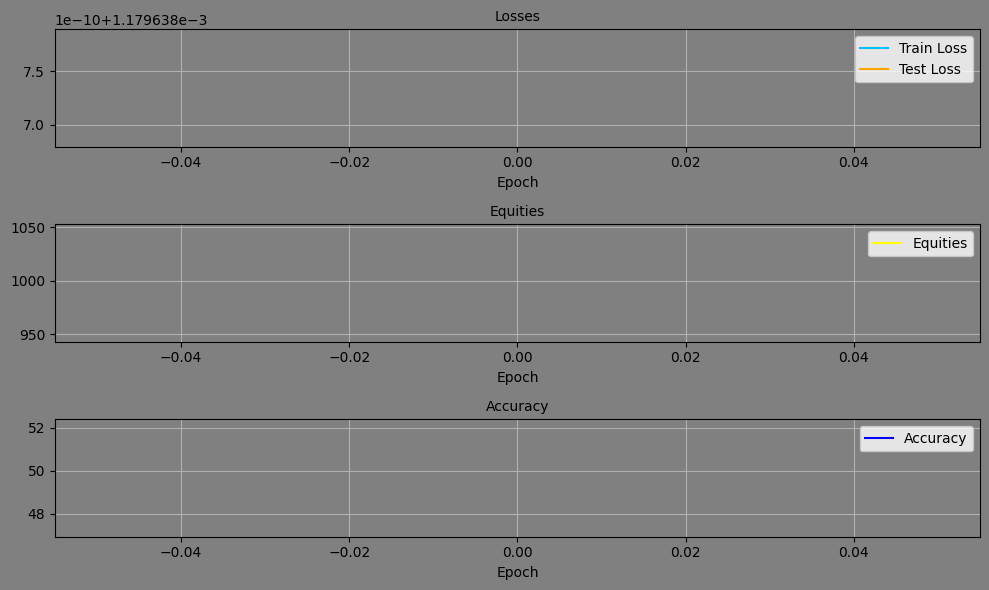

Epoch: 1, Equity: 1203.82, Accuracy: 51.45 train_losses: 0.0025596253759157593, test_losses: 0.0010270201601088047, Duration: 0:00:01.548529


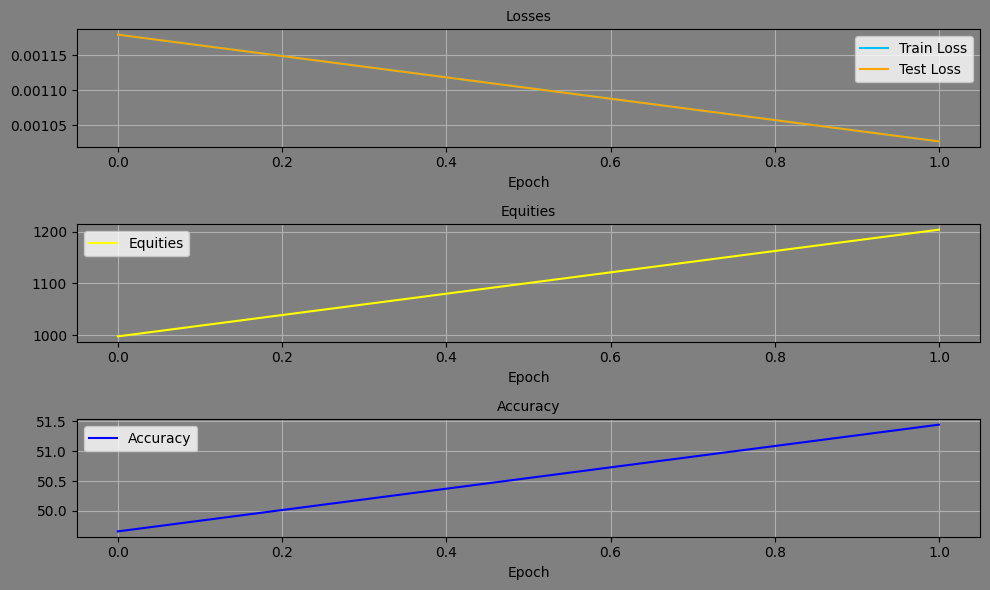

Epoch: 2, Equity: 1020.02, Accuracy: 49.72 train_losses: 0.0022770933768091104, test_losses: 0.0009127995581366122, Duration: 0:00:01.437777


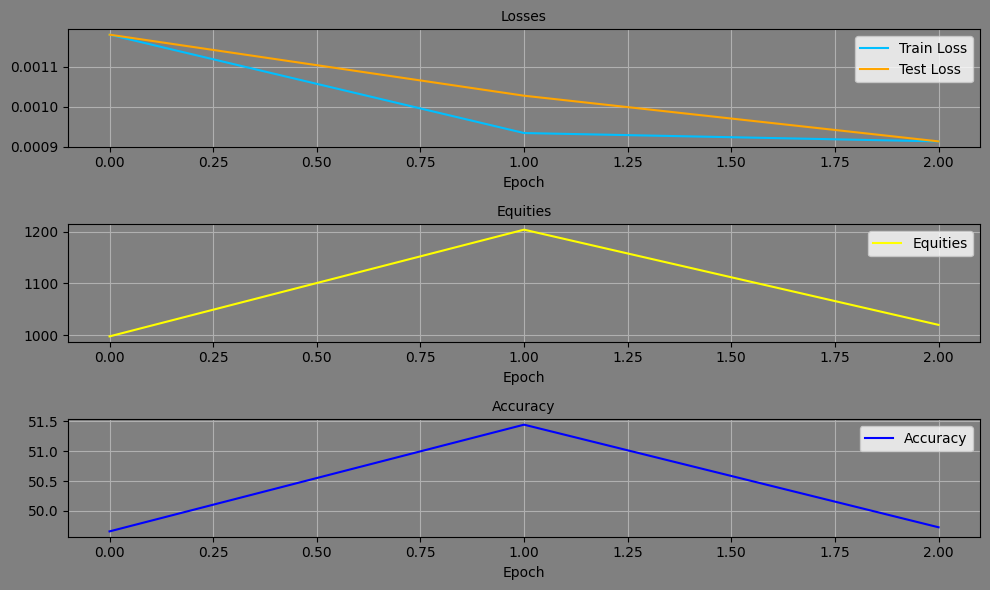

Epoch: 3, Equity: 1056.76, Accuracy: 50.00 train_losses: 0.002194028110518771, test_losses: 0.0008950238698162138, Duration: 0:00:01.398639


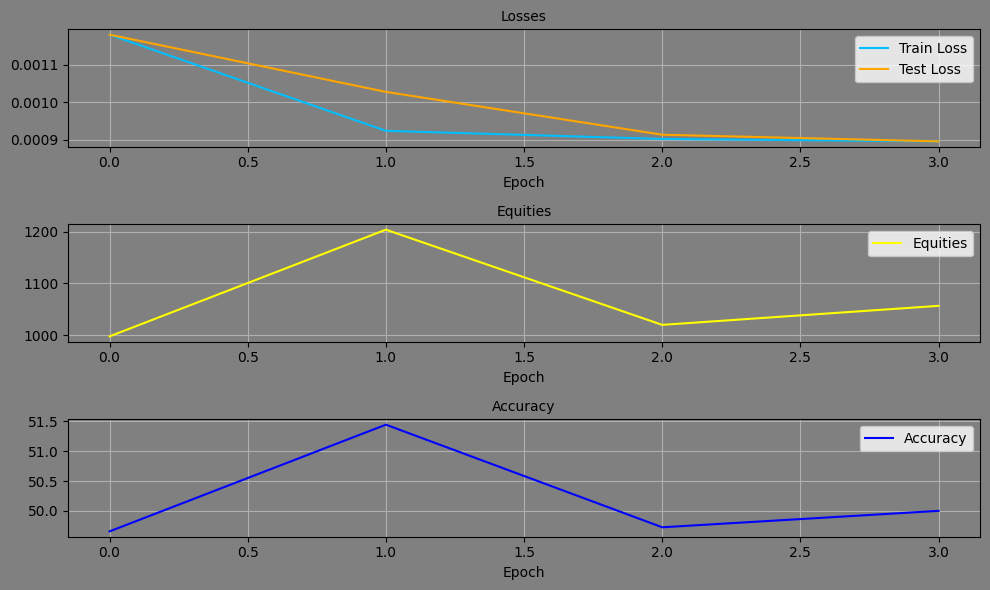

Epoch: 4, Equity: 594.48, Accuracy: 48.07 train_losses: 0.0021725355228784703, test_losses: 0.0008933311328291893, Duration: 0:00:01.454833


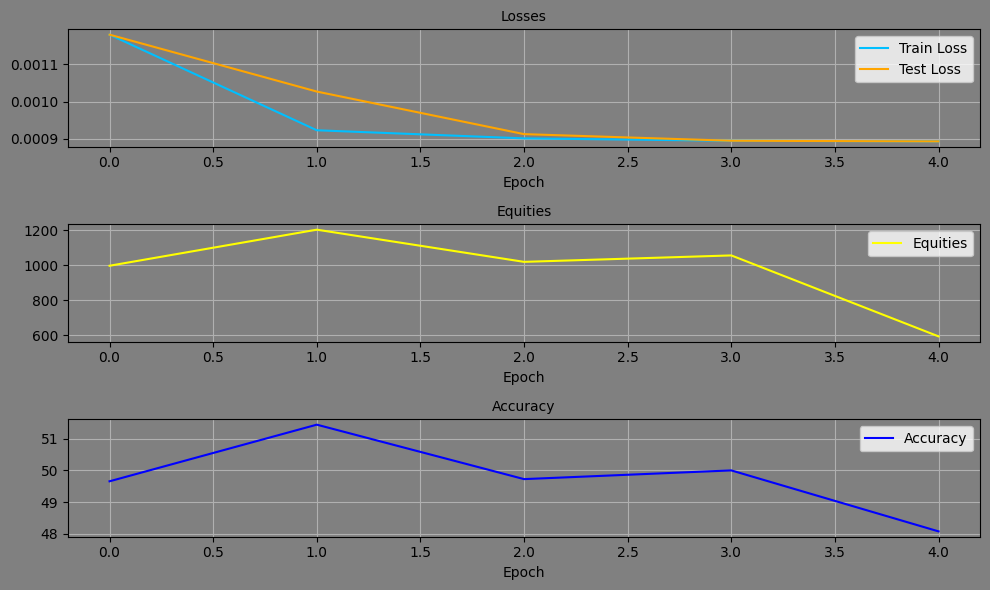

Epoch: 5, Equity: 970.84, Accuracy: 49.79 train_losses: 0.002162238807454171, test_losses: 0.0009131057886406779, Duration: 0:00:01.322786


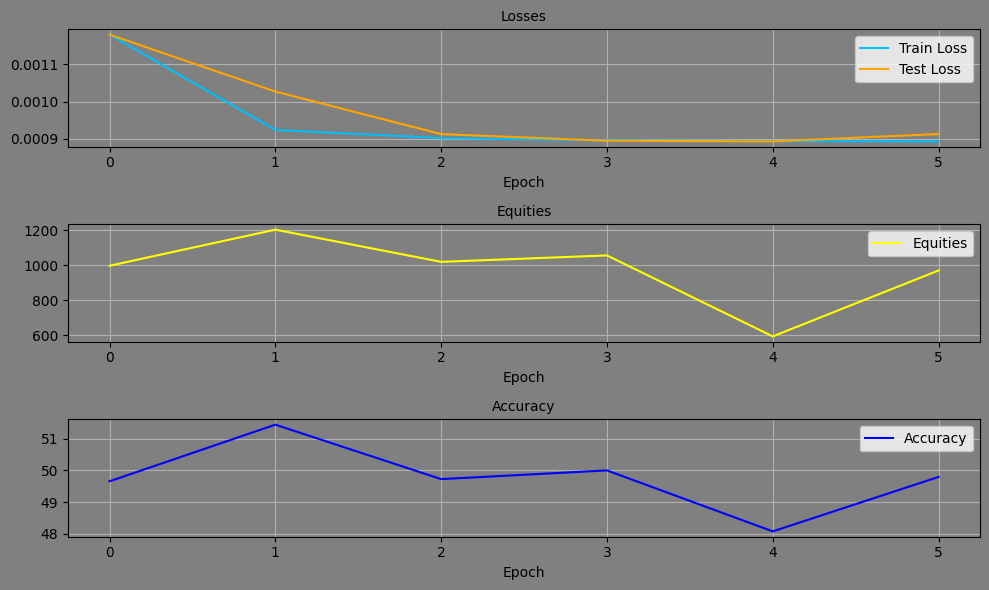

Epoch: 6, Equity: 1049.59, Accuracy: 50.34 train_losses: 0.0021498658749405093, test_losses: 0.0008854165789671242, Duration: 0:00:01.586663


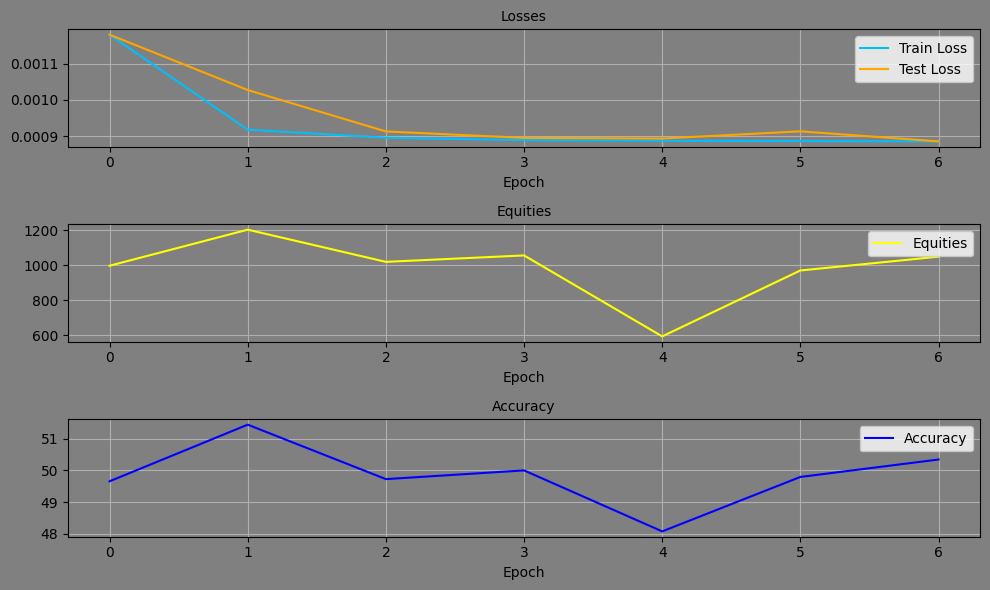

Epoch: 7, Equity: 1380.10, Accuracy: 51.93 train_losses: 0.0021340721116800154, test_losses: 0.0008853665785863996, Duration: 0:00:01.330843


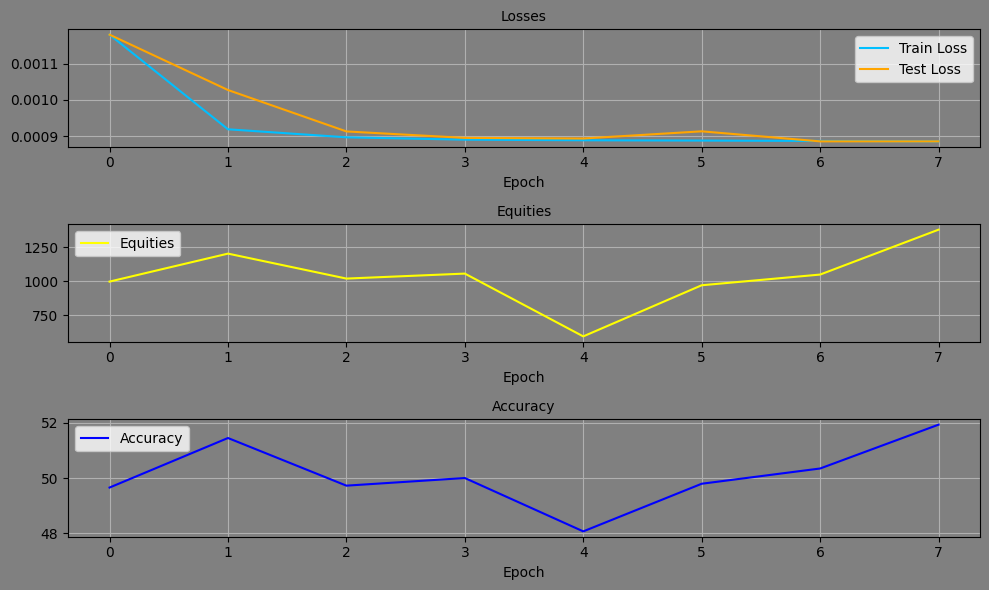

Epoch: 8, Equity: 666.89, Accuracy: 48.07 train_losses: 0.0021253200030909004, test_losses: 0.0008897627703845501, Duration: 0:00:01.372026


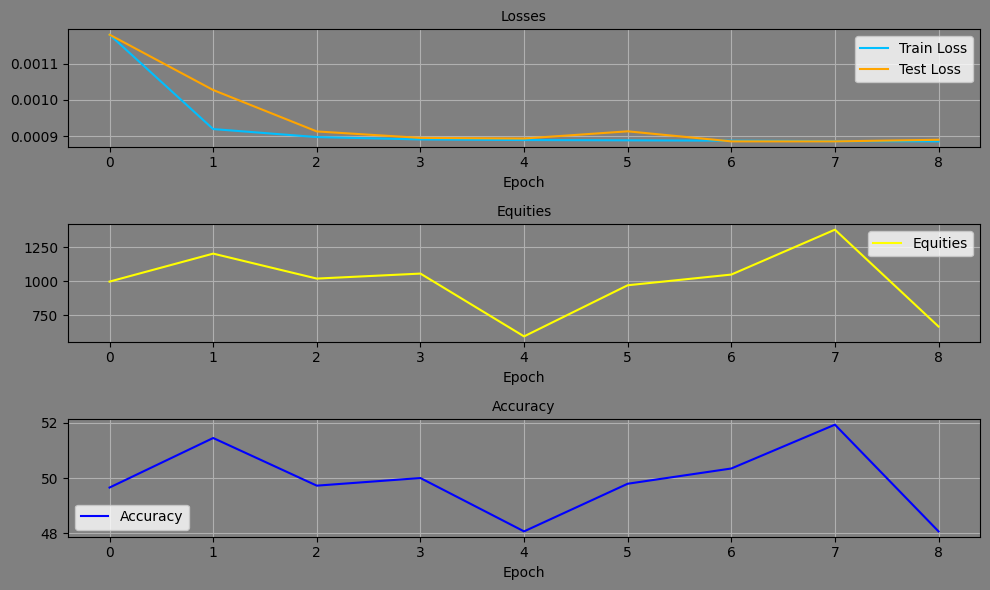

Epoch: 9, Equity: 1212.96, Accuracy: 51.03 train_losses: 0.0021165283662842845, test_losses: 0.00088214356219396, Duration: 0:00:01.523367


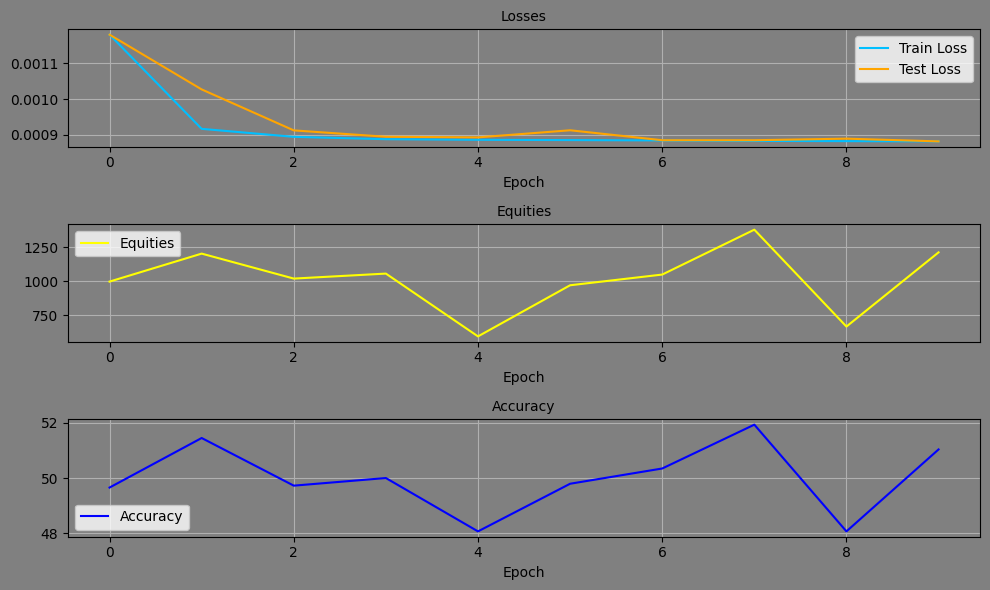

Epoch: 10, Equity: 1324.21, Accuracy: 51.79 train_losses: 0.002108326872959266, test_losses: 0.0008739671320654452, Duration: 0:00:01.737294


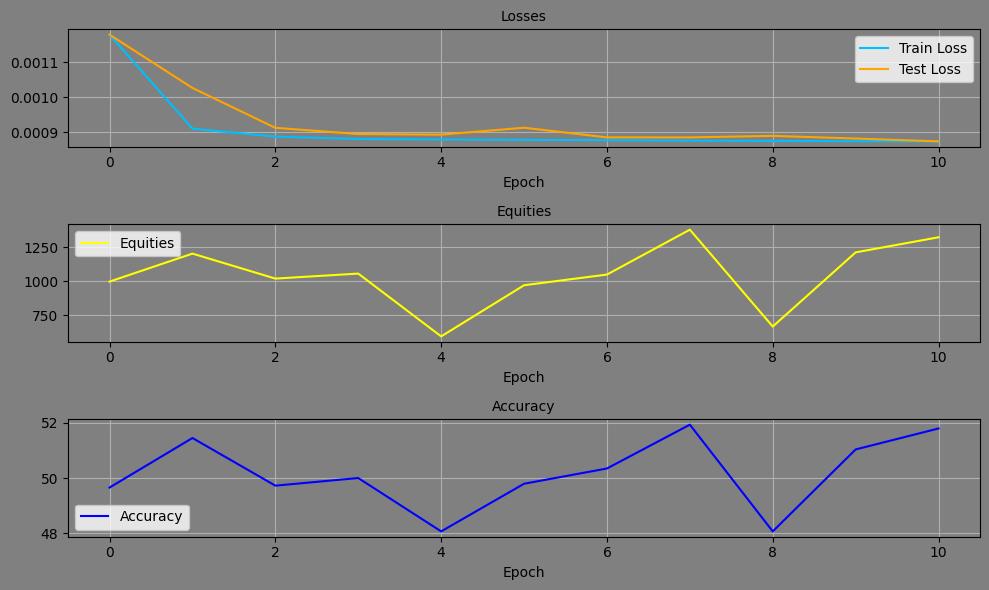

Epoch: 11, Equity: 1325.49, Accuracy: 51.72 train_losses: 0.0021001356337795292, test_losses: 0.0008747613173909485, Duration: 0:00:01.597531


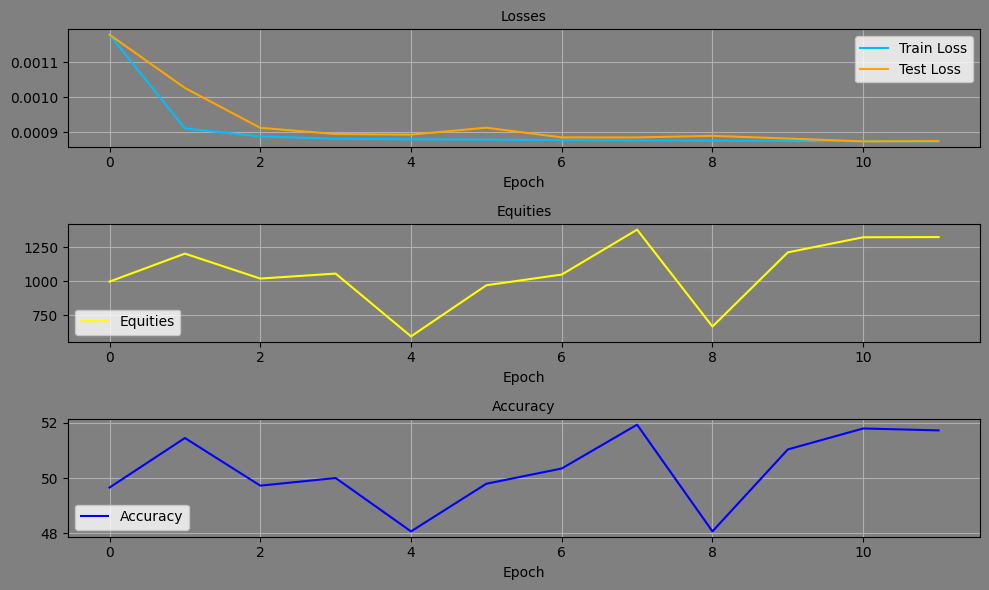

Epoch: 12, Equity: 1046.77, Accuracy: 51.24 train_losses: 0.00209626306818905, test_losses: 0.0008714358555153012, Duration: 0:00:01.760332


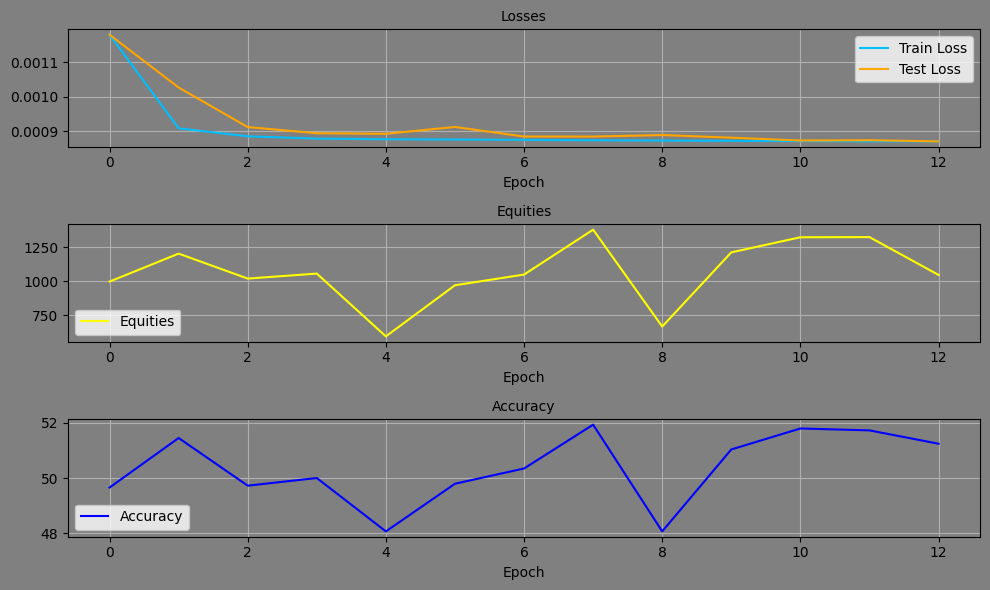

Epoch: 13, Equity: 1278.91, Accuracy: 51.52 train_losses: 0.0020792956858719817, test_losses: 0.0008799642091616988, Duration: 0:00:01.496922


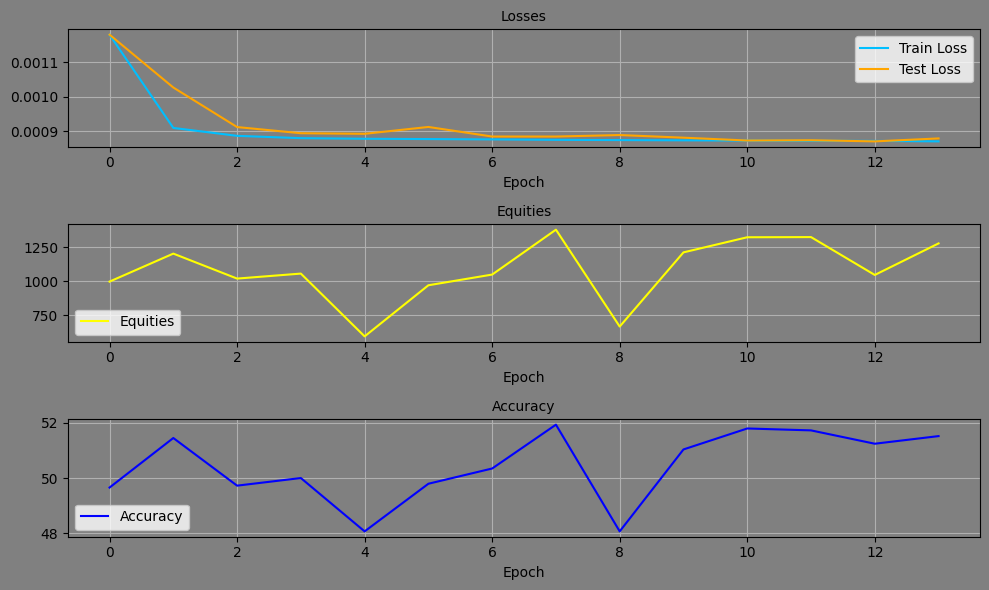

Epoch: 14, Equity: 1102.52, Accuracy: 50.14 train_losses: 0.00207674407554994, test_losses: 0.0008780997595749795, Duration: 0:00:01.418409


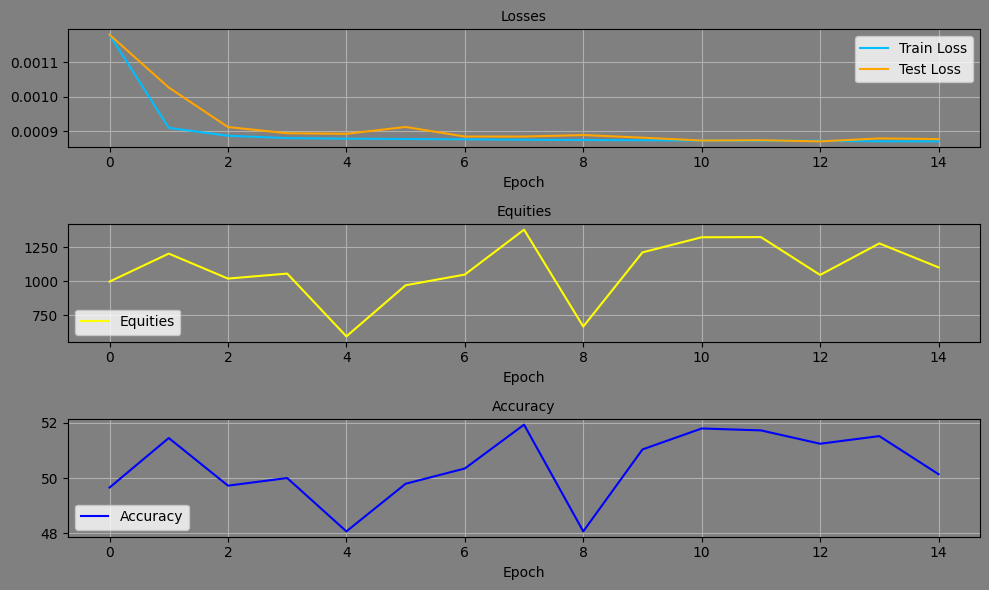

Epoch: 15, Equity: 1386.39, Accuracy: 52.55 train_losses: 0.0020746770676844635, test_losses: 0.0008663294138386846, Duration: 0:00:01.413552


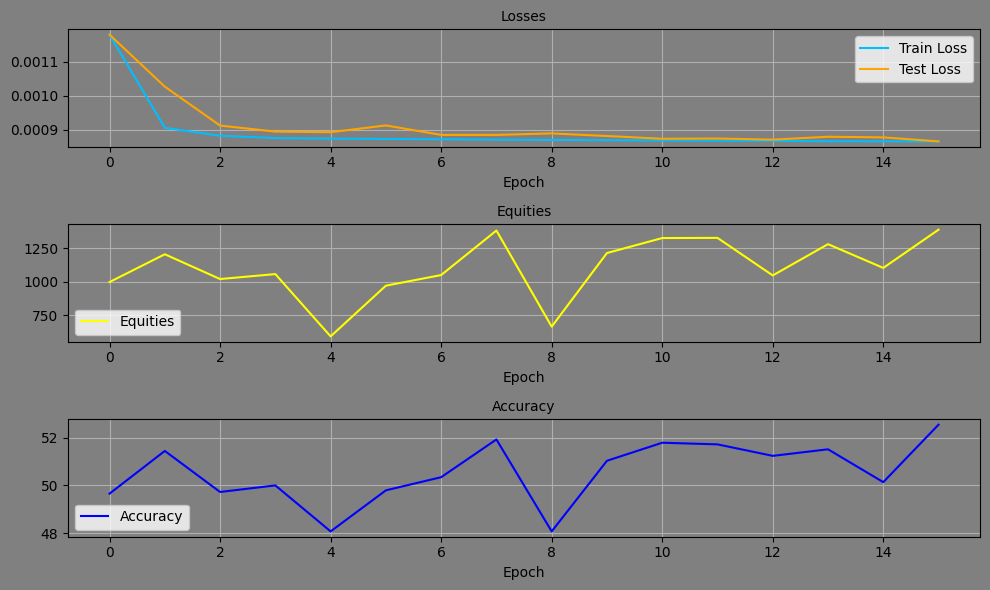

Epoch: 16, Equity: 1114.96, Accuracy: 49.86 train_losses: 0.0020594362261927082, test_losses: 0.0008701353799551725, Duration: 0:00:01.499625


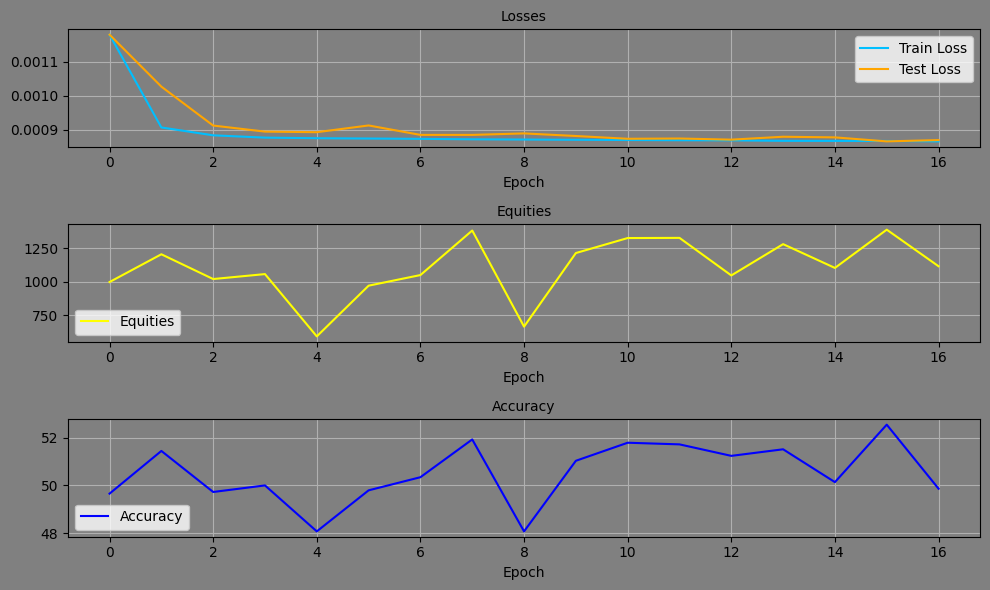

Epoch: 17, Equity: 940.86, Accuracy: 51.17 train_losses: 0.00205611739748685, test_losses: 0.0008854943444021046, Duration: 0:00:01.615960


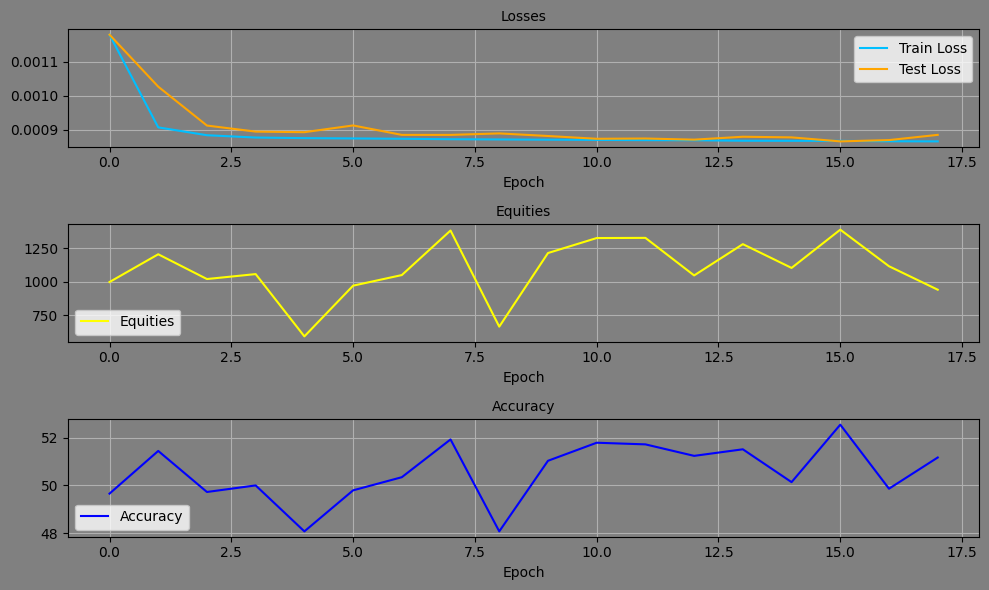

Epoch: 18, Equity: 976.26, Accuracy: 49.17 train_losses: 0.0020557084125191255, test_losses: 0.0008843380492180586, Duration: 0:00:01.604329


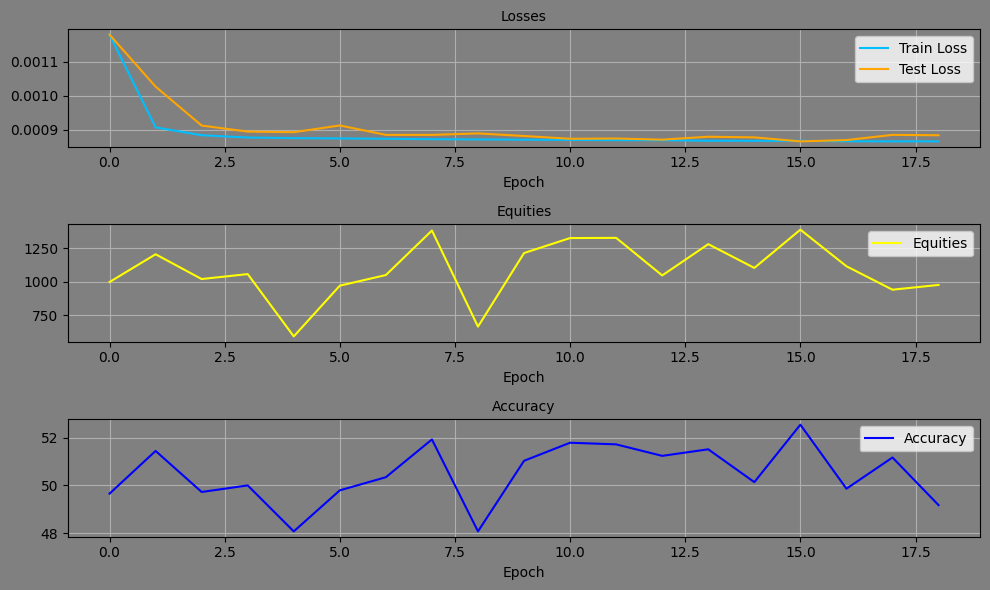

Epoch: 19, Equity: 1415.26, Accuracy: 52.07 train_losses: 0.0020485291553546062, test_losses: 0.0008832201710902154, Duration: 0:00:01.839308


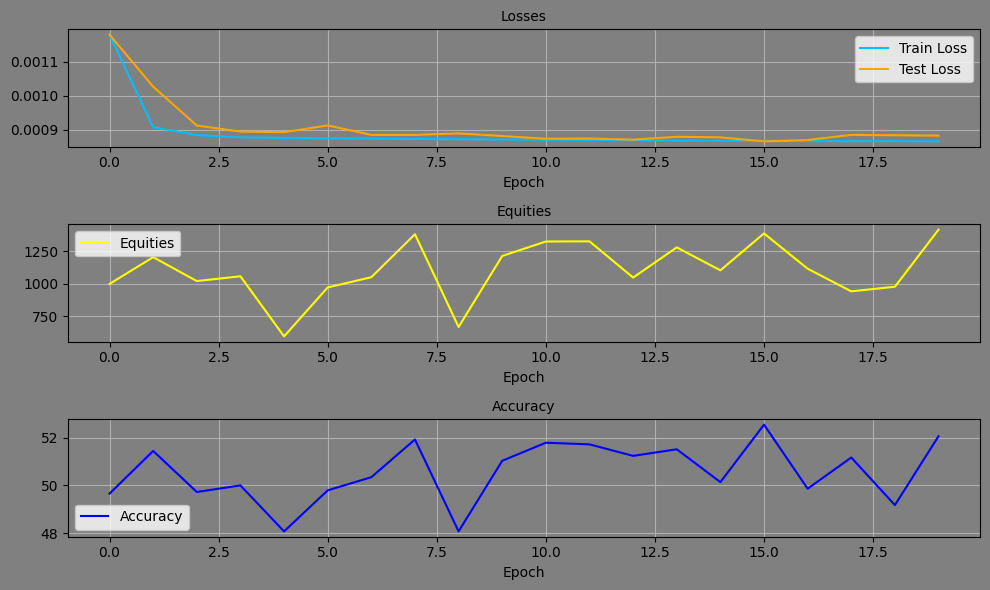

Epoch: 20, Equity: 1384.61, Accuracy: 52.00 train_losses: 0.0020400011199726772, test_losses: 0.0008822191739454865, Duration: 0:00:01.587148


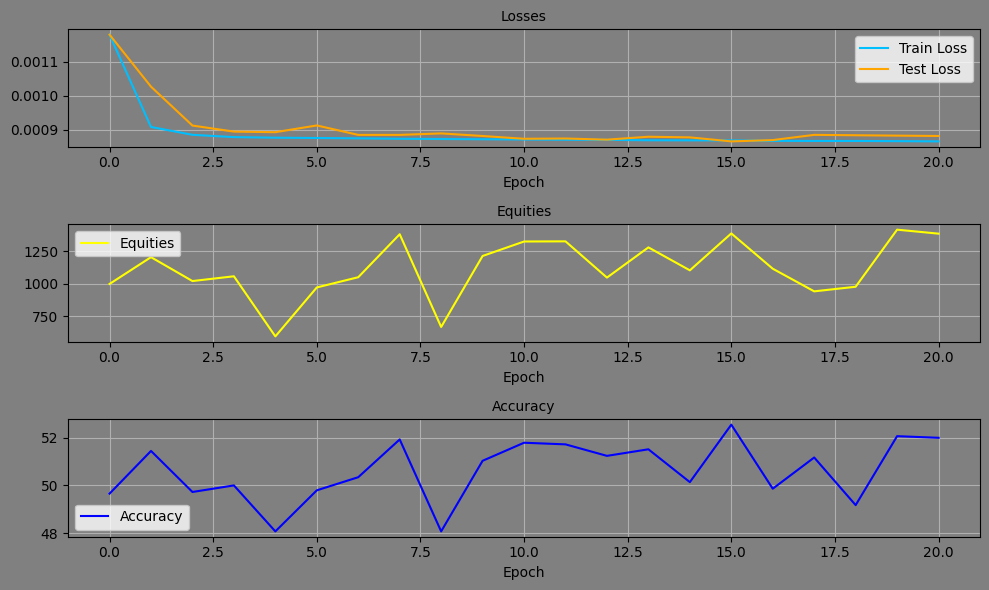

Epoch: 21, Equity: 1110.06, Accuracy: 50.90 train_losses: 0.002049082640631919, test_losses: 0.0008620950975455344, Duration: 0:00:01.416314


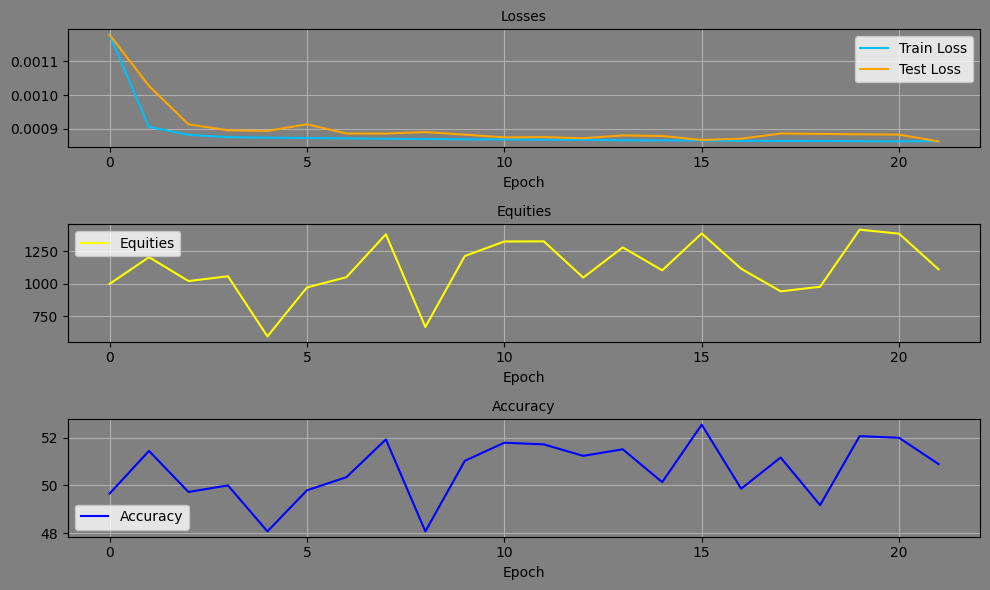

Epoch: 22, Equity: 901.63, Accuracy: 51.24 train_losses: 0.002039266290396826, test_losses: 0.0008630227530375123, Duration: 0:00:01.544063


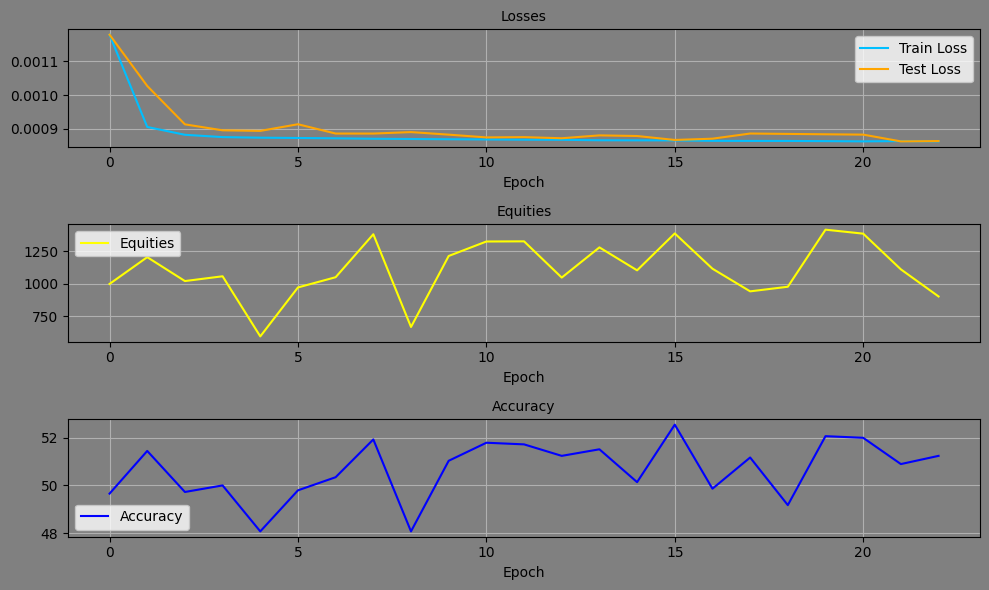

Epoch: 23, Equity: 644.92, Accuracy: 48.35 train_losses: 0.0020394681831471303, test_losses: 0.0008654699777252972, Duration: 0:00:01.391071


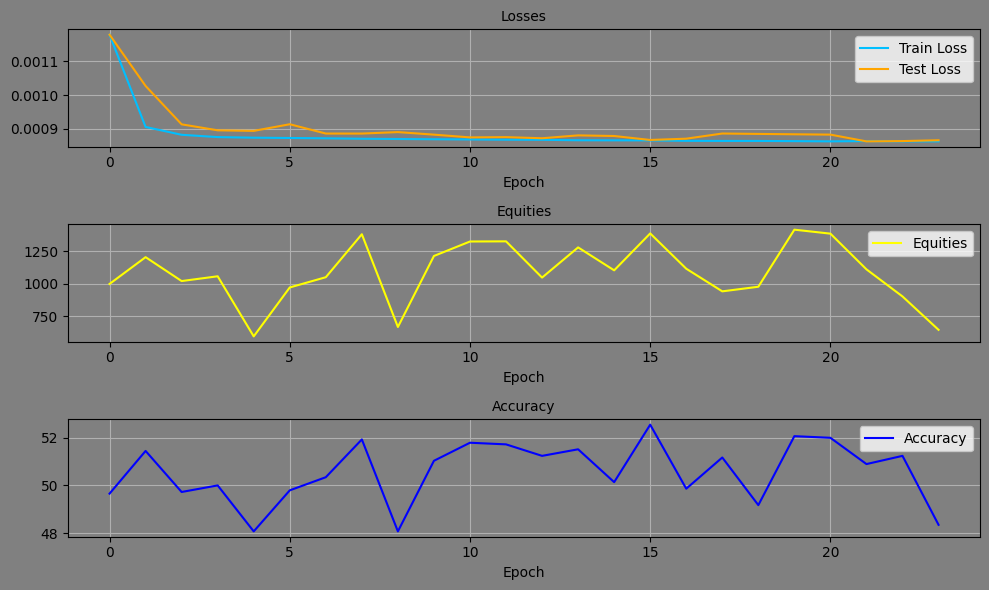

Epoch: 24, Equity: 649.38, Accuracy: 48.35 train_losses: 0.0020382933005253286, test_losses: 0.0008718642638996243, Duration: 0:00:01.402900


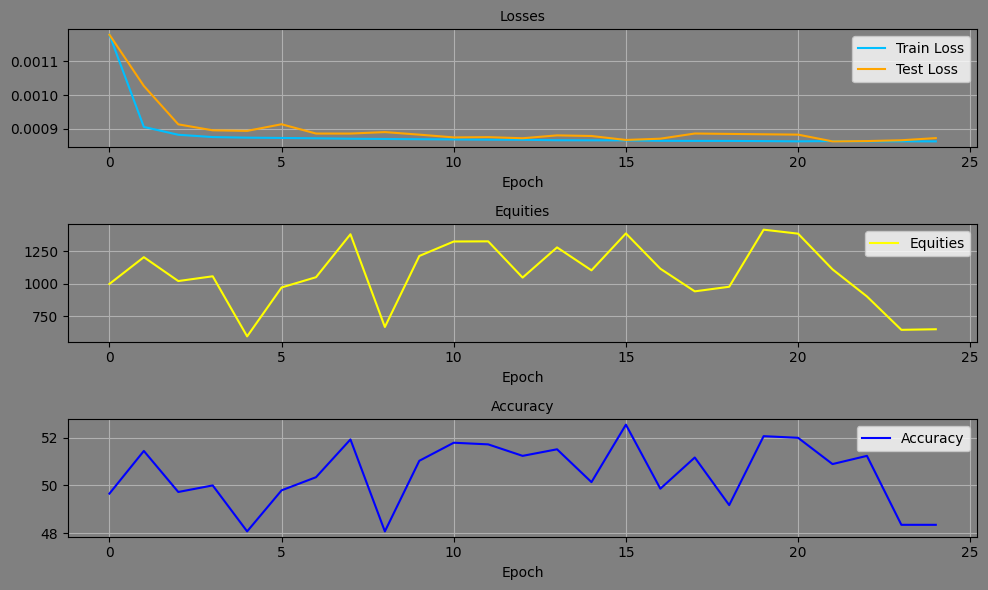

Epoch: 25, Equity: 1202.22, Accuracy: 51.79 train_losses: 0.0020381843064716386, test_losses: 0.0008788860868662596, Duration: 0:00:01.380975


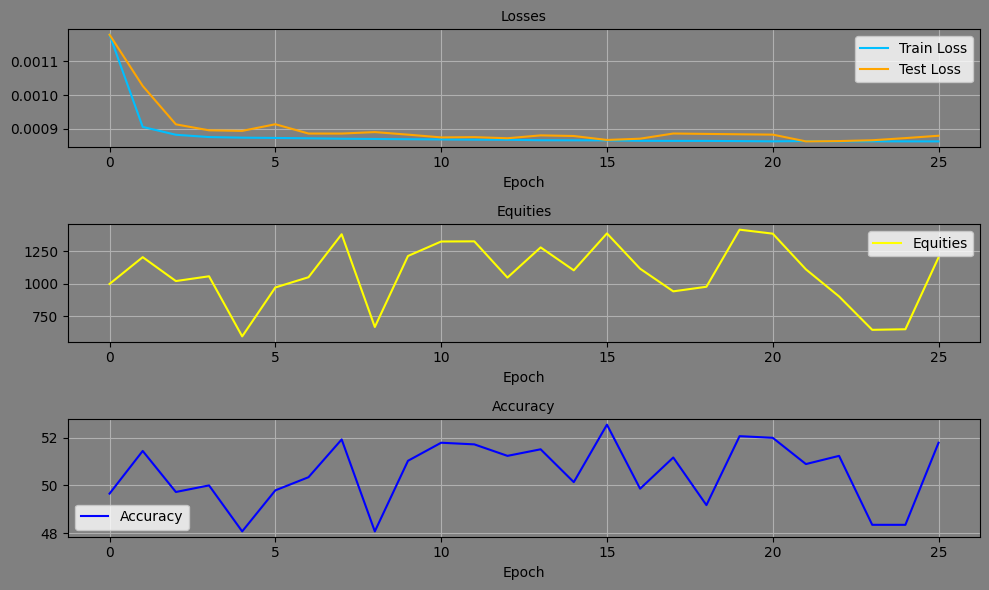

Epoch: 26, Equity: 1328.41, Accuracy: 52.13 train_losses: 0.0020273690741787927, test_losses: 0.0008687700610607862, Duration: 0:00:01.308014


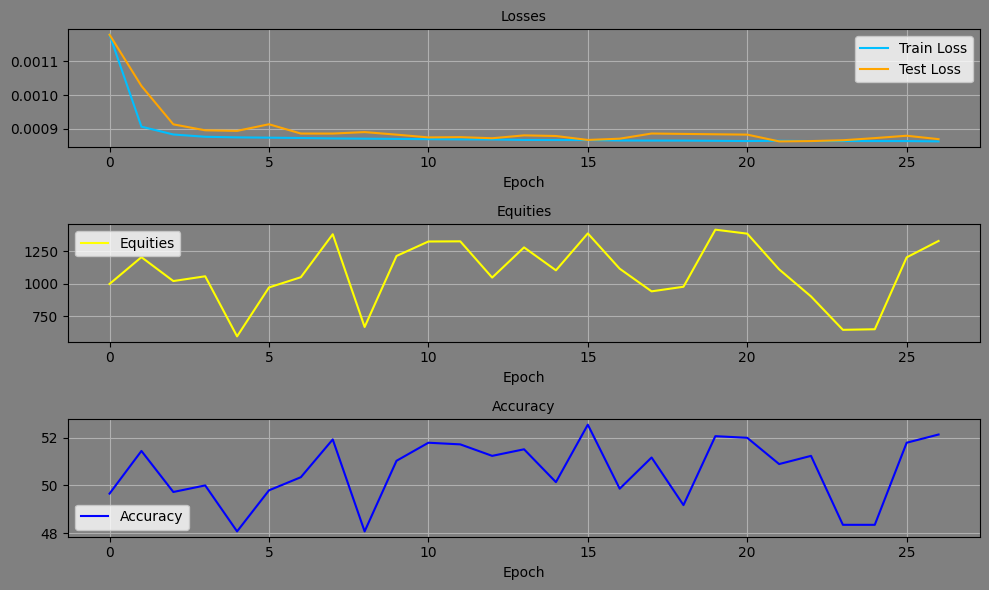

Epoch: 27, Equity: 709.91, Accuracy: 48.69 train_losses: 0.0020292526026303116, test_losses: 0.0008666335488669574, Duration: 0:00:01.351976


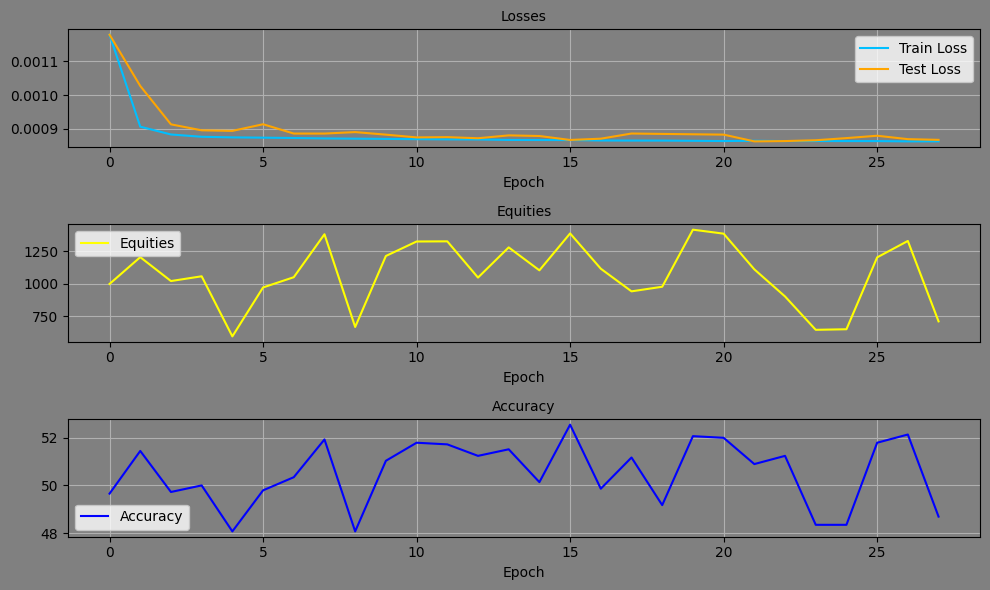

Epoch: 28, Equity: 1268.99, Accuracy: 51.58 train_losses: 0.0020314083037410585, test_losses: 0.0008642340544611216, Duration: 0:00:01.355979


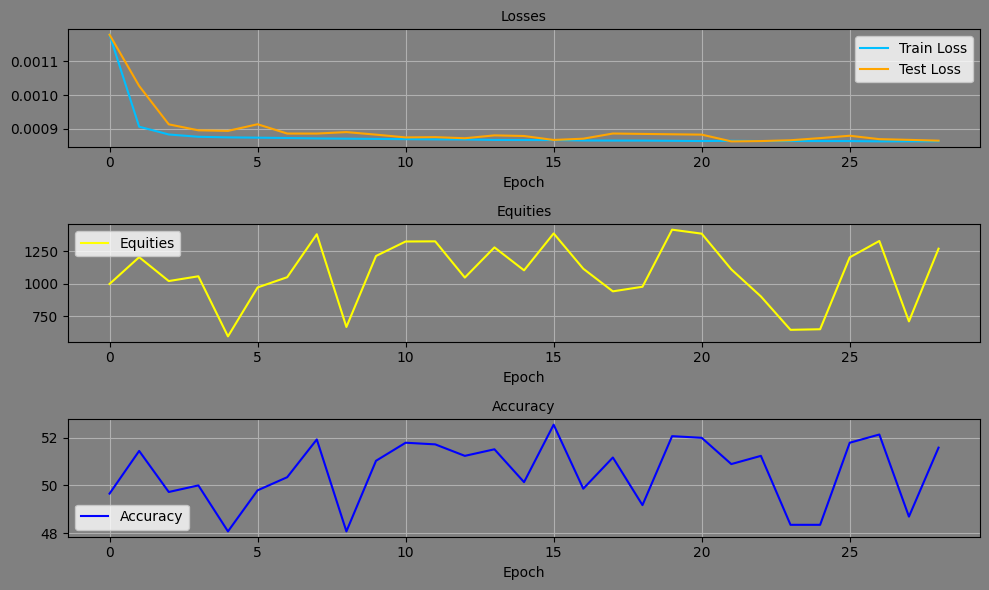

Epoch: 29, Equity: 670.74, Accuracy: 48.42 train_losses: 0.0020310527843875495, test_losses: 0.0008835968910716474, Duration: 0:00:01.359594


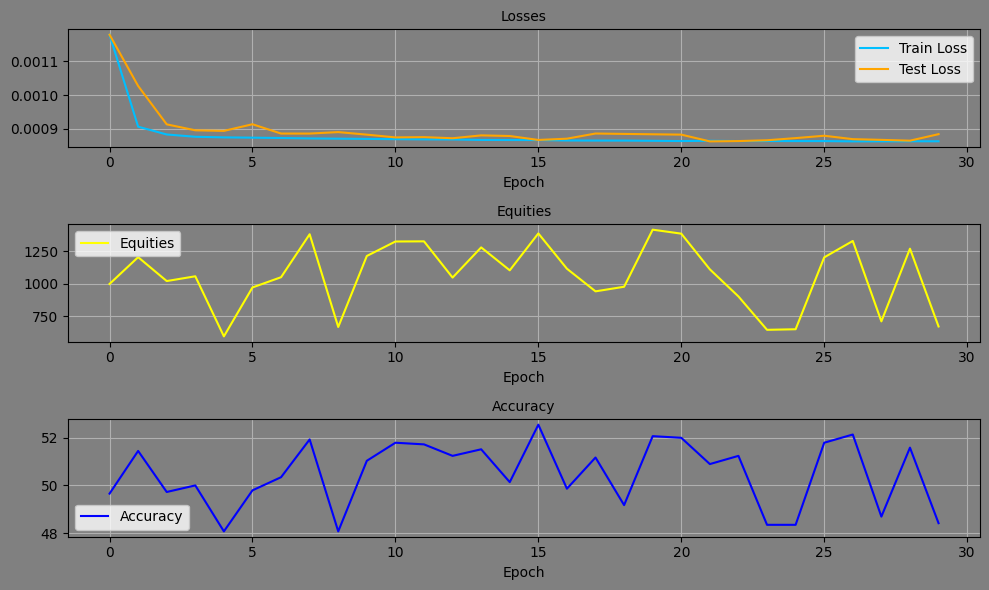

Epoch: 30, Equity: 848.82, Accuracy: 48.83 train_losses: 0.002015680524810154, test_losses: 0.0009193871519528329, Duration: 0:00:01.334705


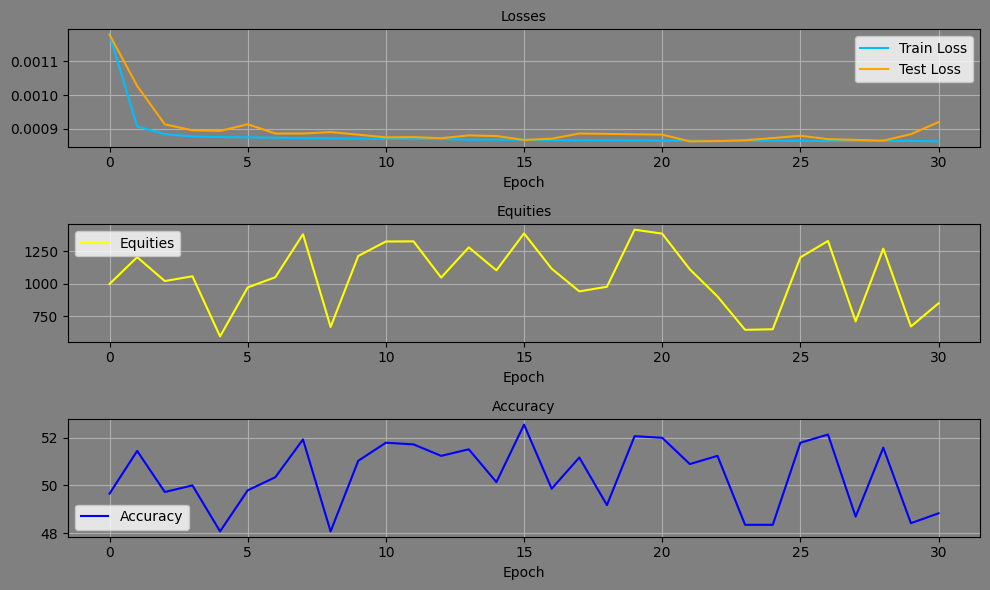

Epoch: 31, Equity: 1310.74, Accuracy: 51.58 train_losses: 0.0020296855972150147, test_losses: 0.0008694767602719367, Duration: 0:00:01.431850


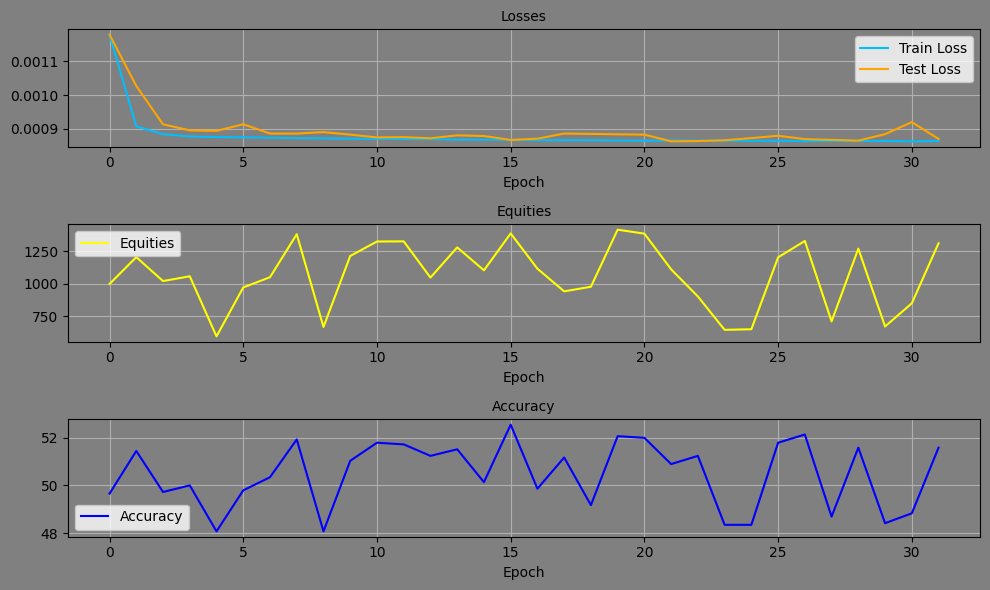

Epoch: 32, Equity: 1376.12, Accuracy: 52.20 train_losses: 0.0020270593152264646, test_losses: 0.0008591519435867667, Duration: 0:00:01.356397


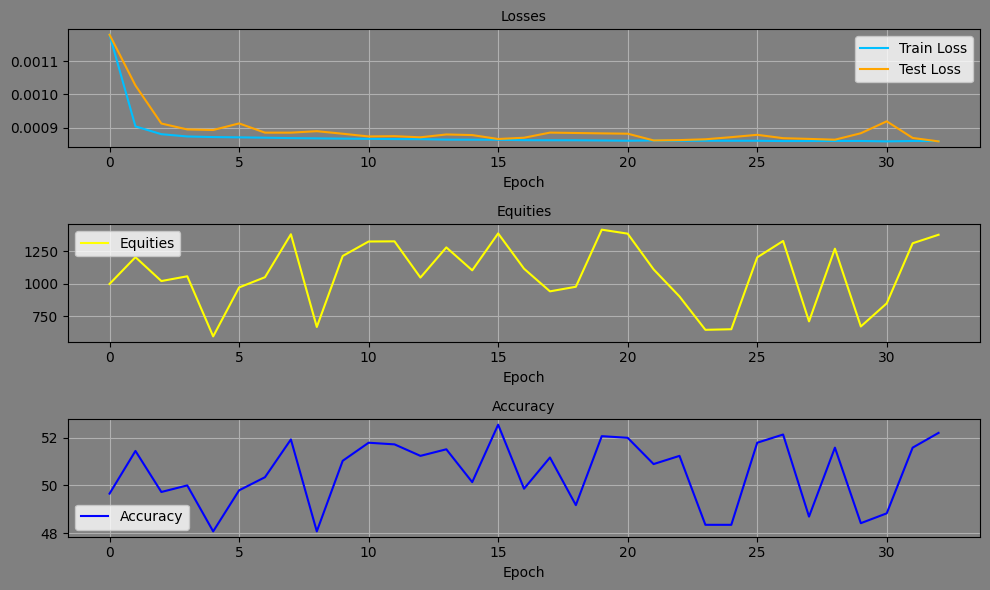

Epoch: 33, Equity: 1207.21, Accuracy: 51.72 train_losses: 0.0020237725200323476, test_losses: 0.0008647797512821853, Duration: 0:00:01.357312


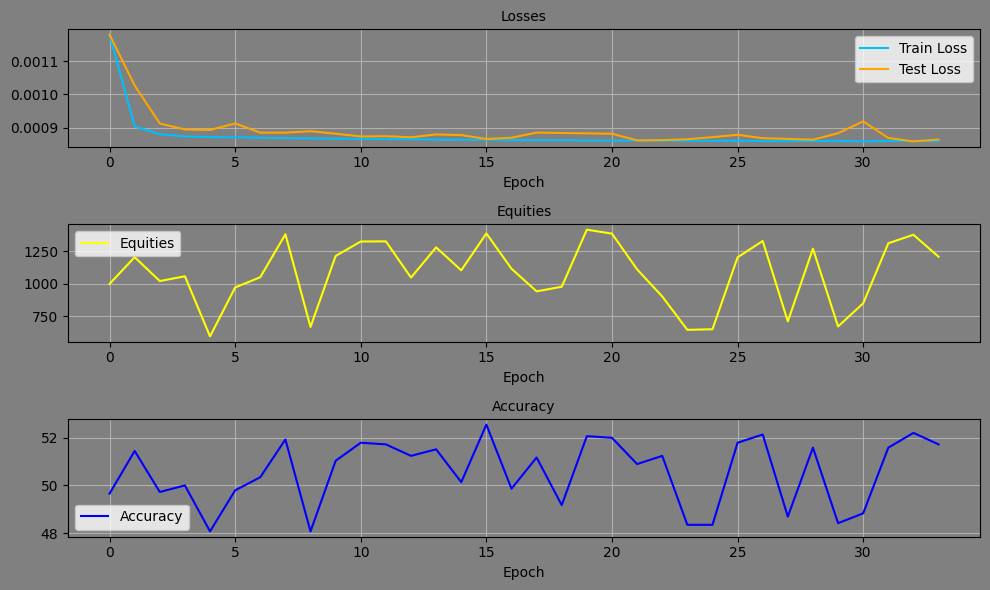

Epoch: 34, Equity: 1184.53, Accuracy: 51.79 train_losses: 0.002025032885819941, test_losses: 0.0008622833411209285, Duration: 0:00:01.390833


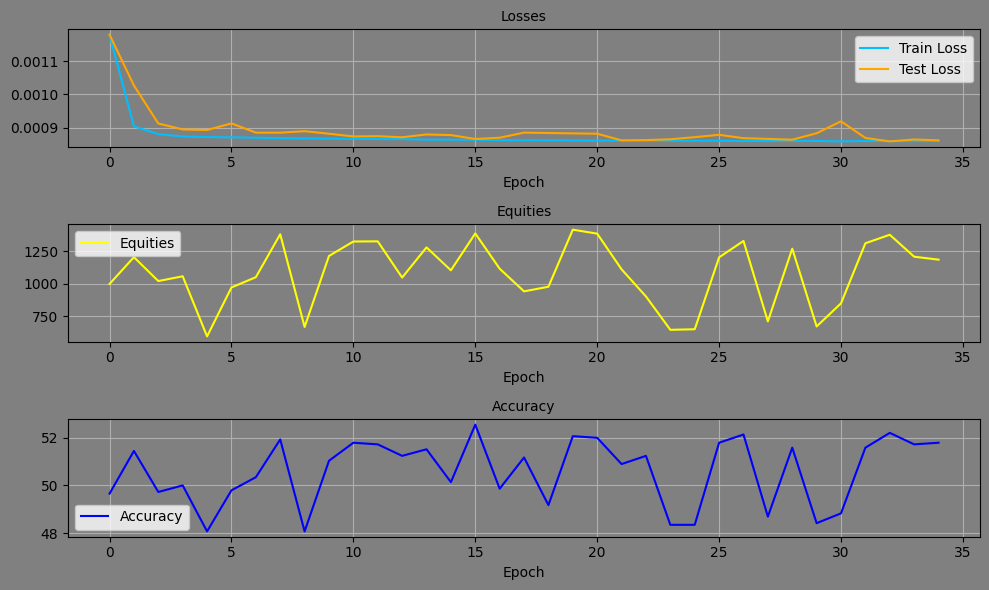

Epoch: 35, Equity: 1207.63, Accuracy: 52.00 train_losses: 0.0020264878044552485, test_losses: 0.0008590738871134818, Duration: 0:00:01.449619


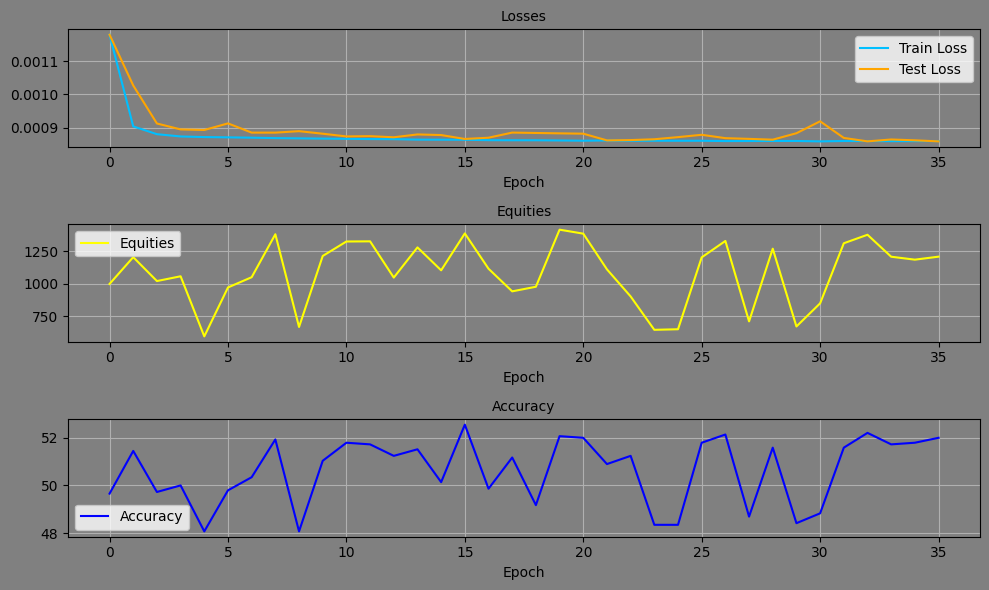

Epoch: 36, Equity: 1091.63, Accuracy: 51.52 train_losses: 0.0020247831473111984, test_losses: 0.0008651848183944821, Duration: 0:00:01.421068


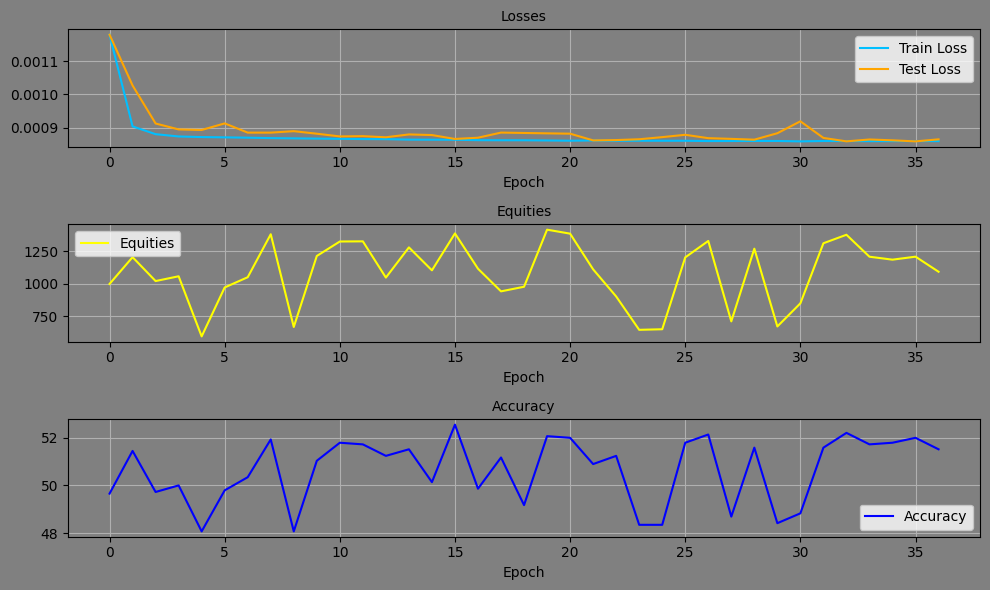

Epoch: 37, Equity: 1033.73, Accuracy: 50.14 train_losses: 0.0020257044280211586, test_losses: 0.0008706166408956051, Duration: 0:00:01.356934


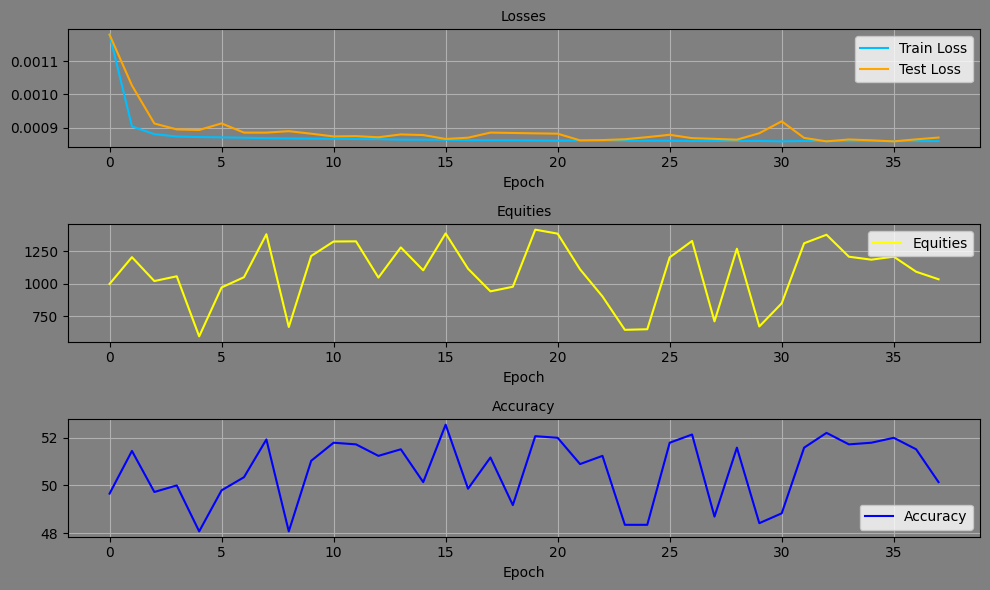

Epoch: 38, Equity: 804.38, Accuracy: 50.00 train_losses: 0.0020126244008389226, test_losses: 0.0008626405615359545, Duration: 0:00:01.409919


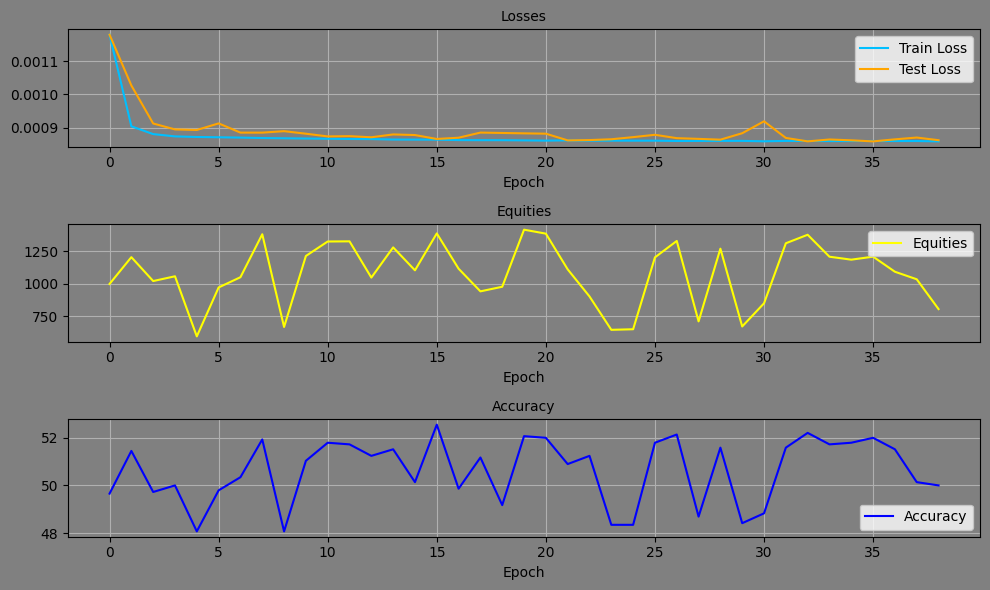

Epoch: 39, Equity: 1377.32, Accuracy: 52.07 train_losses: 0.0020227685427179685, test_losses: 0.0008721338817849755, Duration: 0:00:01.372186


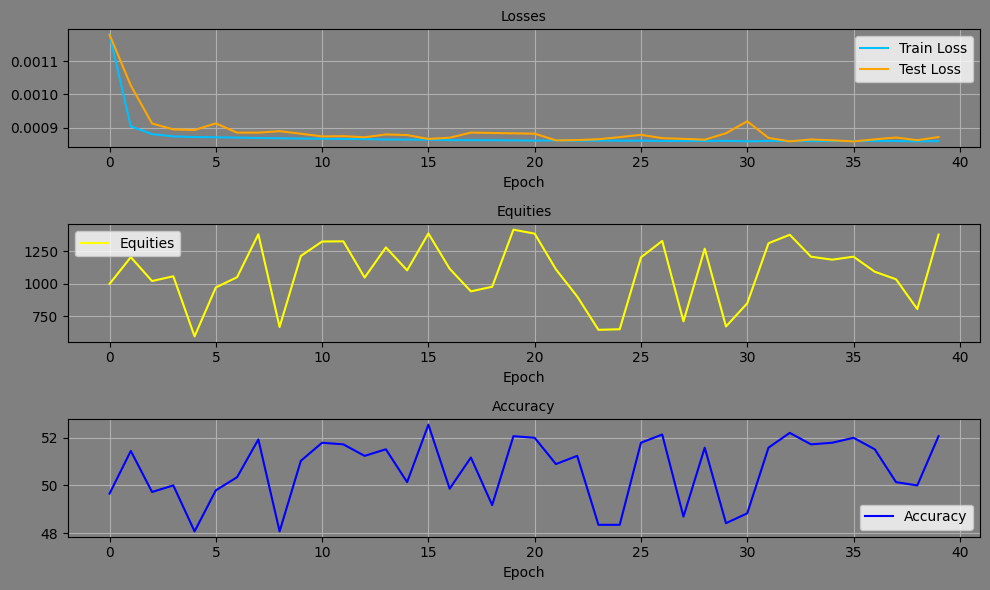

Epoch: 40, Equity: 1059.36, Accuracy: 50.21 train_losses: 0.0020173705073647653, test_losses: 0.0008663902408443391, Duration: 0:00:01.383668


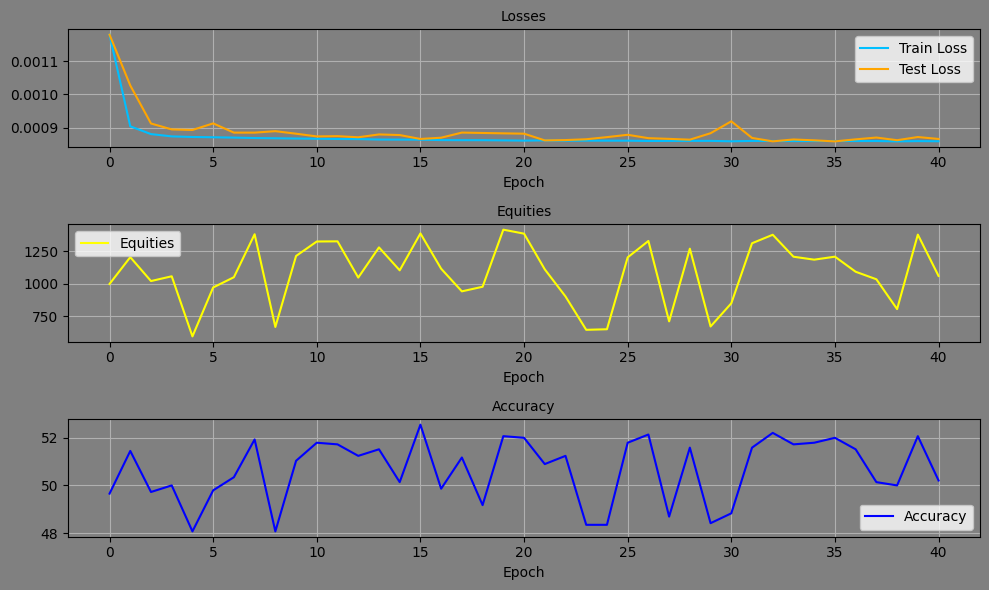

Epoch: 41, Equity: 839.31, Accuracy: 49.31 train_losses: 0.002017962505667901, test_losses: 0.0008653528639115393, Duration: 0:00:01.450118


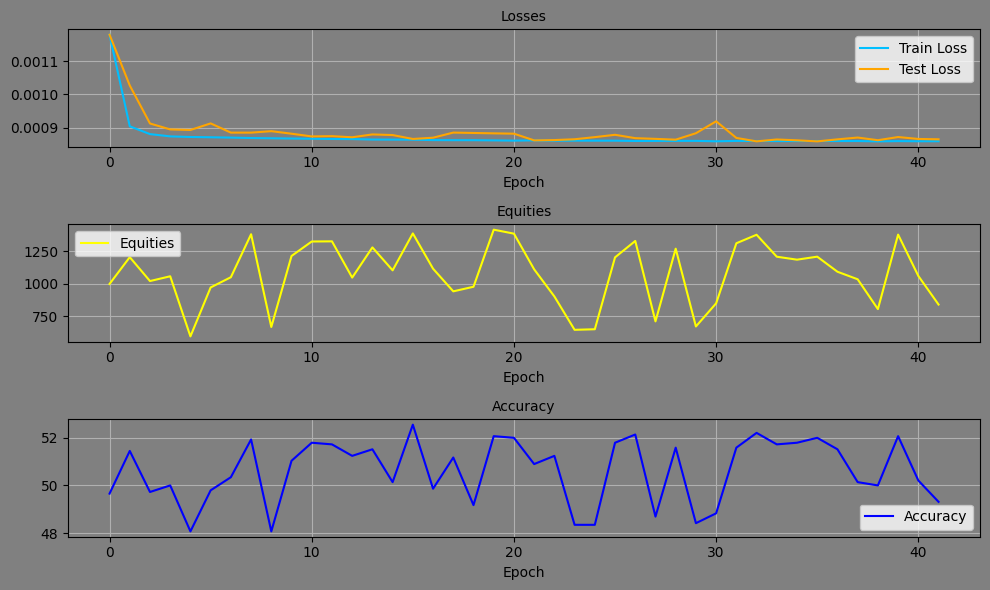

Epoch: 42, Equity: 1119.36, Accuracy: 50.14 train_losses: 0.002018137819214647, test_losses: 0.0008632573881186545, Duration: 0:00:01.391677


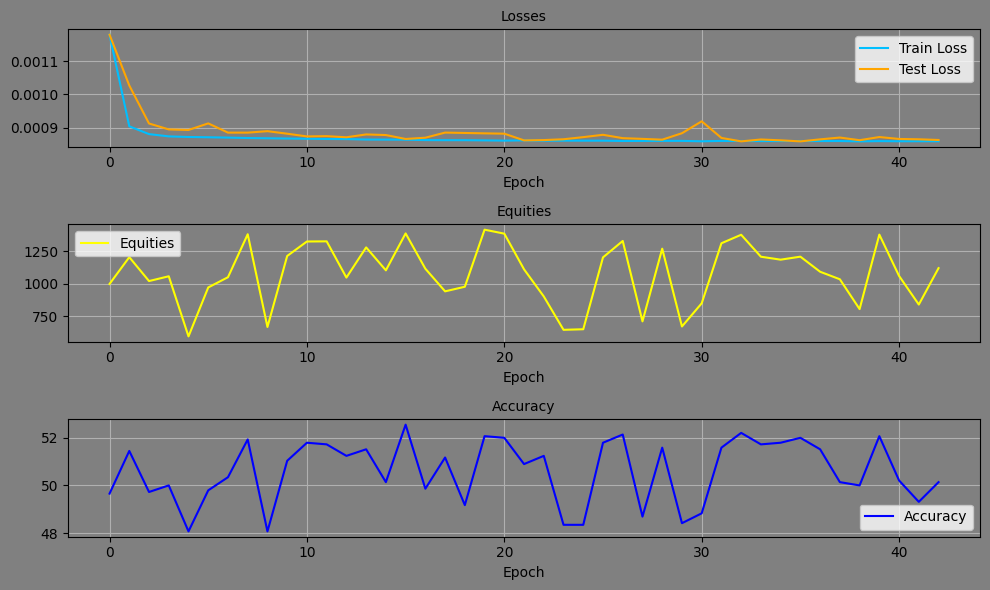

Epoch: 43, Equity: 1095.69, Accuracy: 50.21 train_losses: 0.002014157982955363, test_losses: 0.0008603007881902158, Duration: 0:00:01.410993


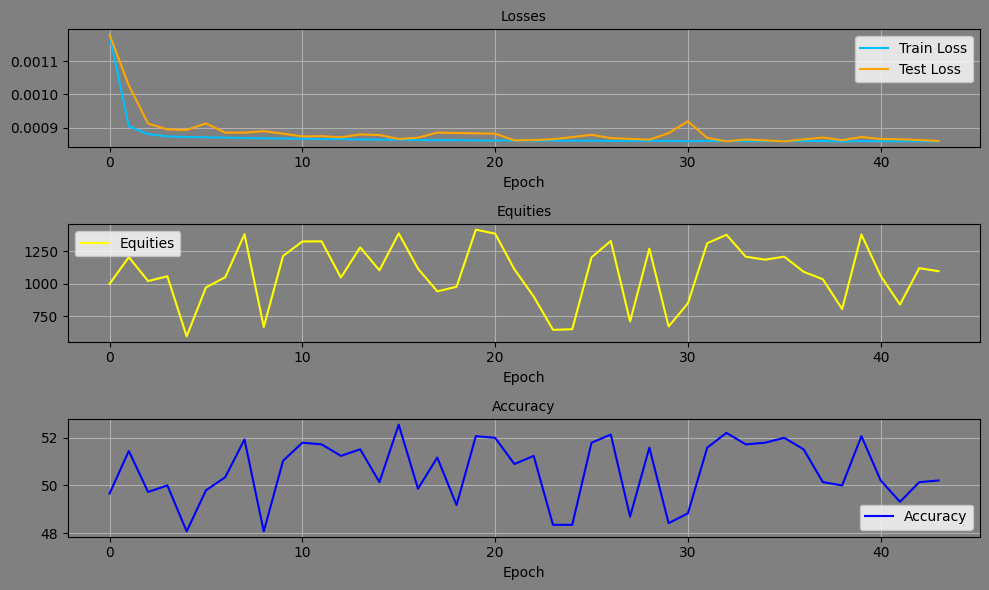

Epoch: 44, Equity: 790.38, Accuracy: 48.83 train_losses: 0.002005451790300802, test_losses: 0.0008616483537480235, Duration: 0:00:01.505087


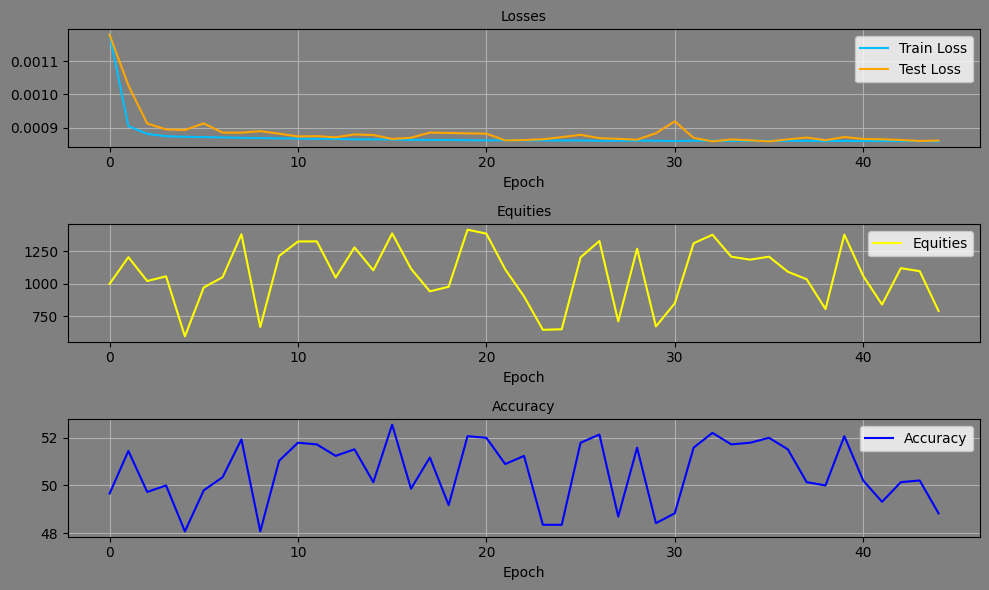

Epoch: 45, Equity: 1233.32, Accuracy: 51.79 train_losses: 0.002019122331177876, test_losses: 0.0008743055514059961, Duration: 0:00:01.507089


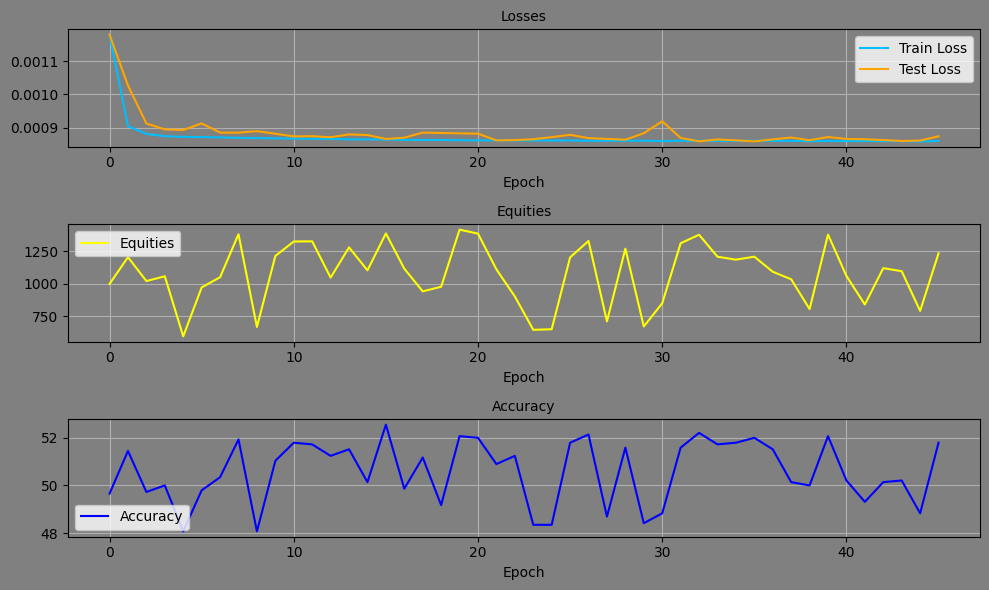

Epoch: 46, Equity: 842.63, Accuracy: 50.55 train_losses: 0.002019614472152418, test_losses: 0.0008615399710834026, Duration: 0:00:01.405001


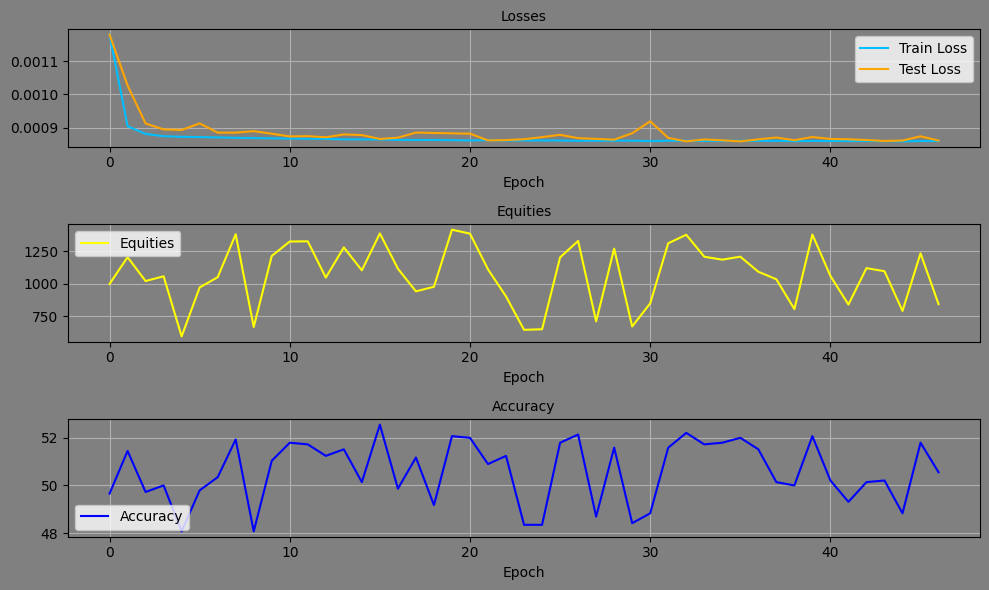

Epoch: 47, Equity: 1026.94, Accuracy: 51.72 train_losses: 0.0020162758185222787, test_losses: 0.0008575977408327162, Duration: 0:00:01.404383


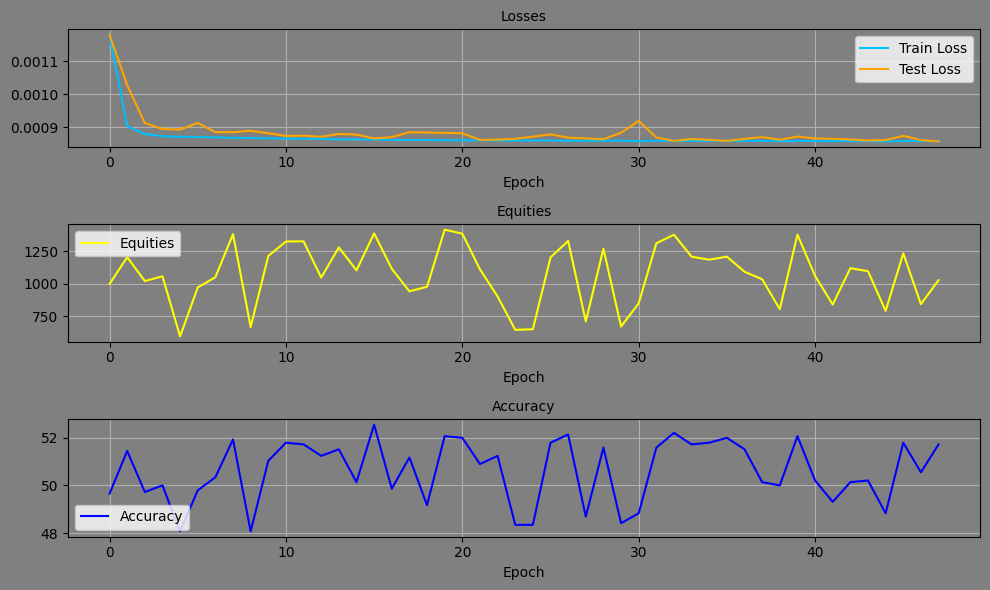

Epoch: 48, Equity: 1166.17, Accuracy: 52.07 train_losses: 0.0020198465148020387, test_losses: 0.0008572223596274853, Duration: 0:00:01.494878


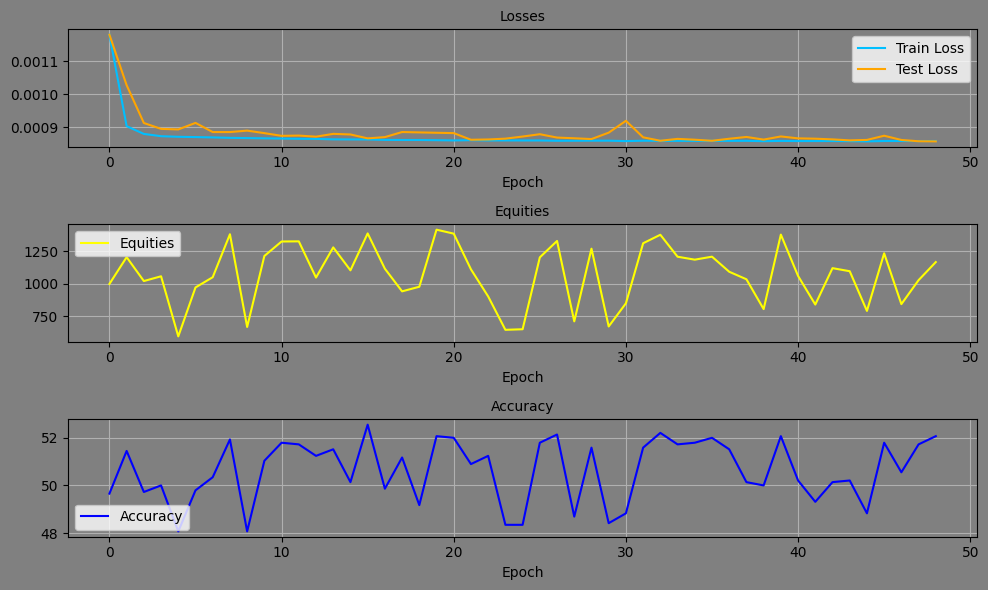

Epoch: 49, Equity: 1069.05, Accuracy: 51.72 train_losses: 0.0019886737675189063, test_losses: 0.0008602997986599803, Duration: 0:00:01.391723


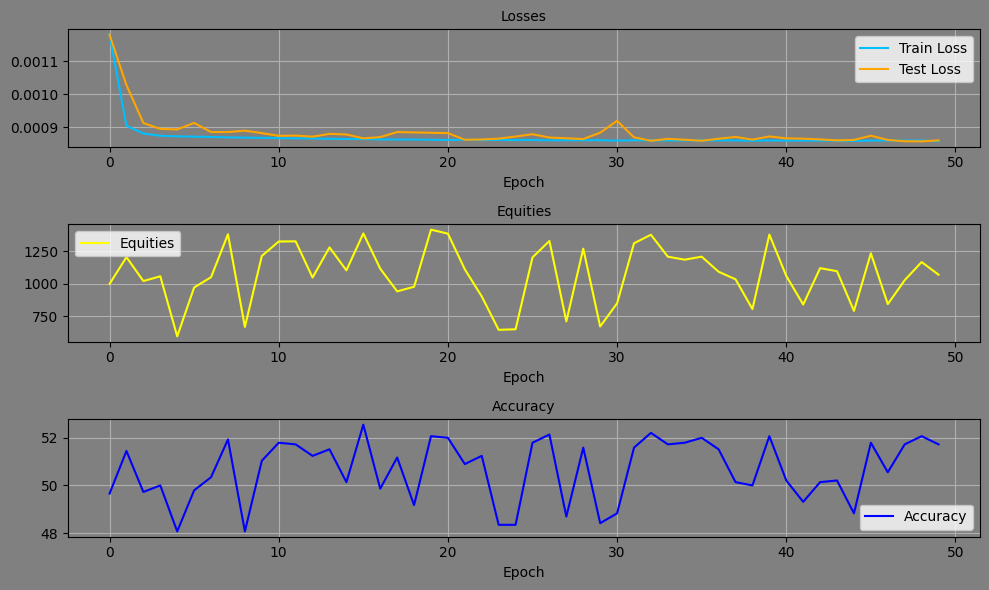

Epoch: 50, Equity: 1059.39, Accuracy: 49.66 train_losses: 0.0020162280566329437, test_losses: 0.0008660122402943671, Duration: 0:00:01.395316


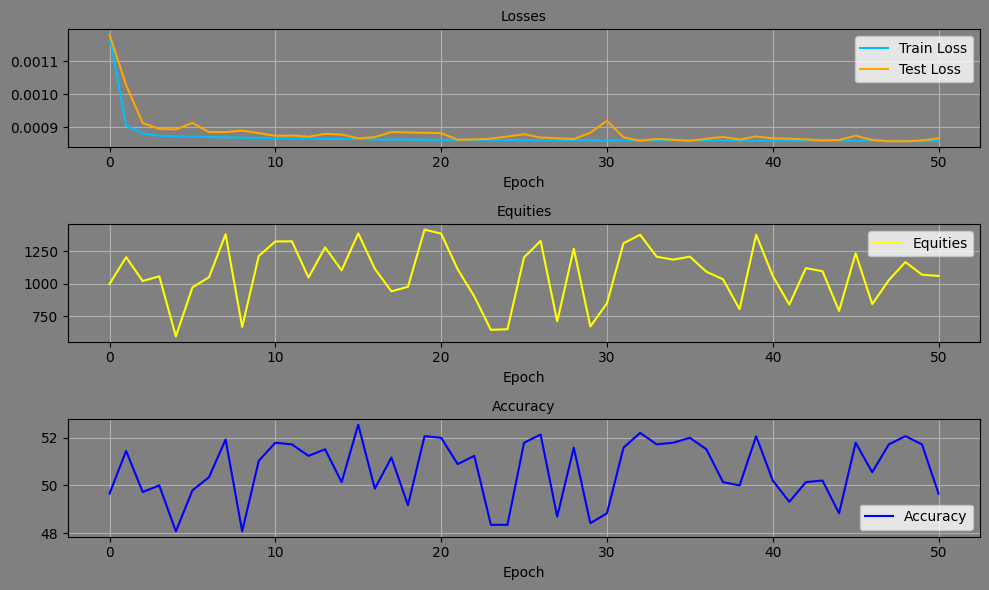

Epoch: 51, Equity: 1053.34, Accuracy: 50.69 train_losses: 0.002010762690246025, test_losses: 0.0008616030681878328, Duration: 0:00:01.325217


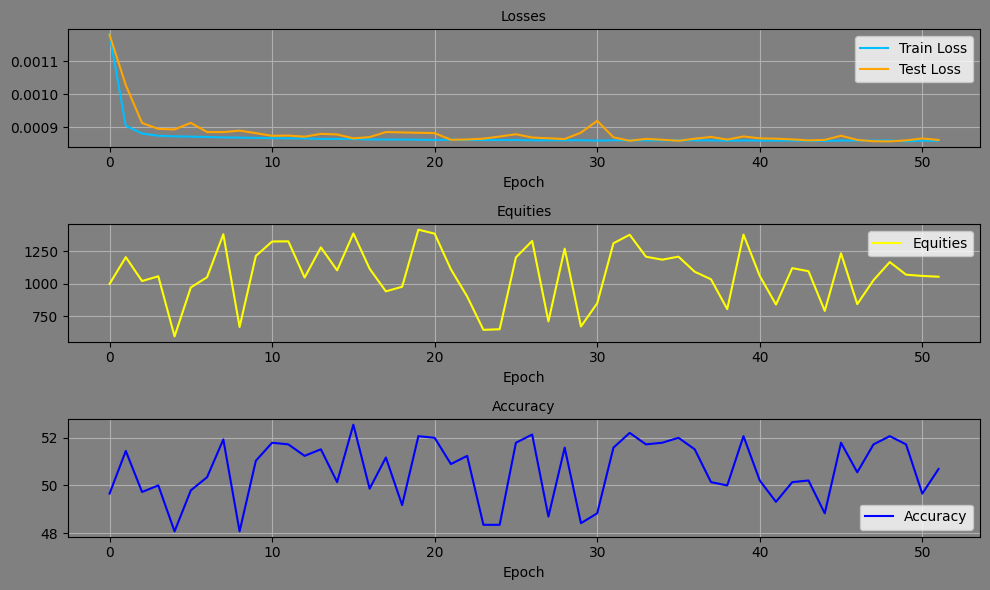

Epoch: 52, Equity: 1341.78, Accuracy: 52.48 train_losses: 0.0020170191303521437, test_losses: 0.0008603892638348043, Duration: 0:00:01.327787


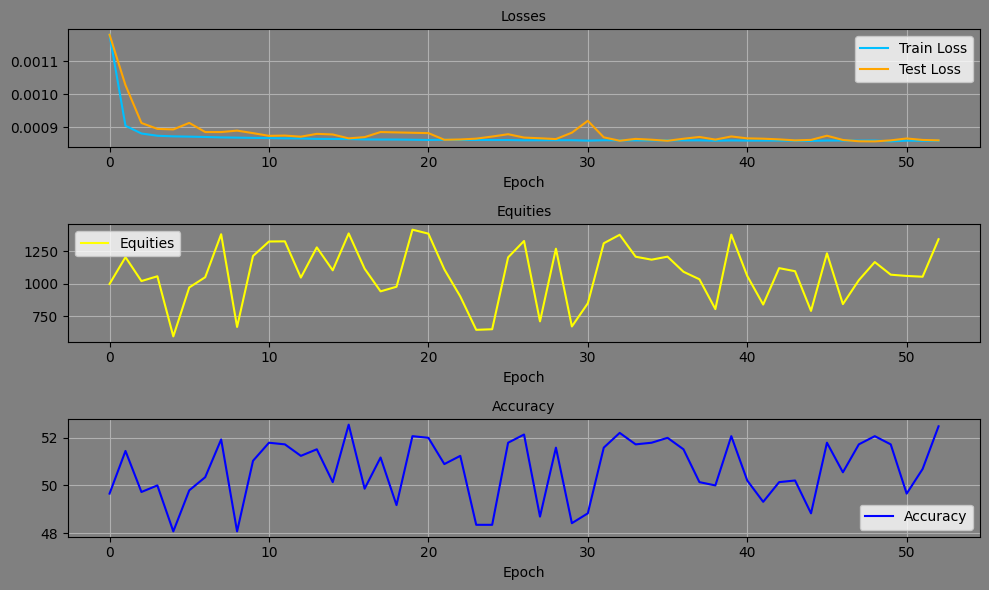

Epoch: 53, Equity: 1250.84, Accuracy: 51.58 train_losses: 0.002012242219768845, test_losses: 0.0008654098492115736, Duration: 0:00:01.405306


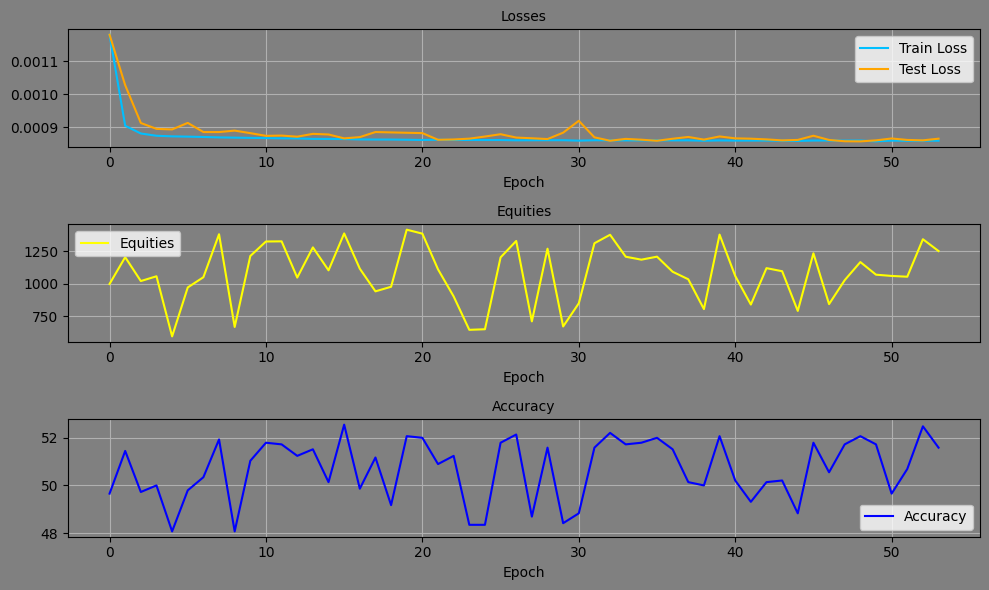

Epoch: 54, Equity: 1084.37, Accuracy: 49.59 train_losses: 0.002011159787602943, test_losses: 0.0008646599599160254, Duration: 0:00:01.458957


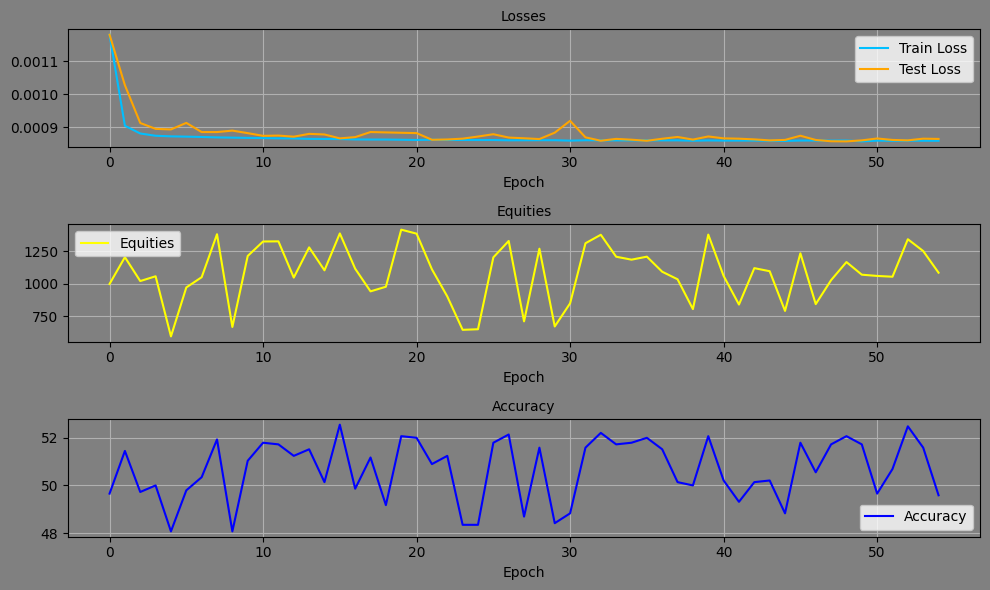

Epoch: 55, Equity: 1275.97, Accuracy: 51.38 train_losses: 0.0019975571748575257, test_losses: 0.0008602476445958018, Duration: 0:00:01.465639


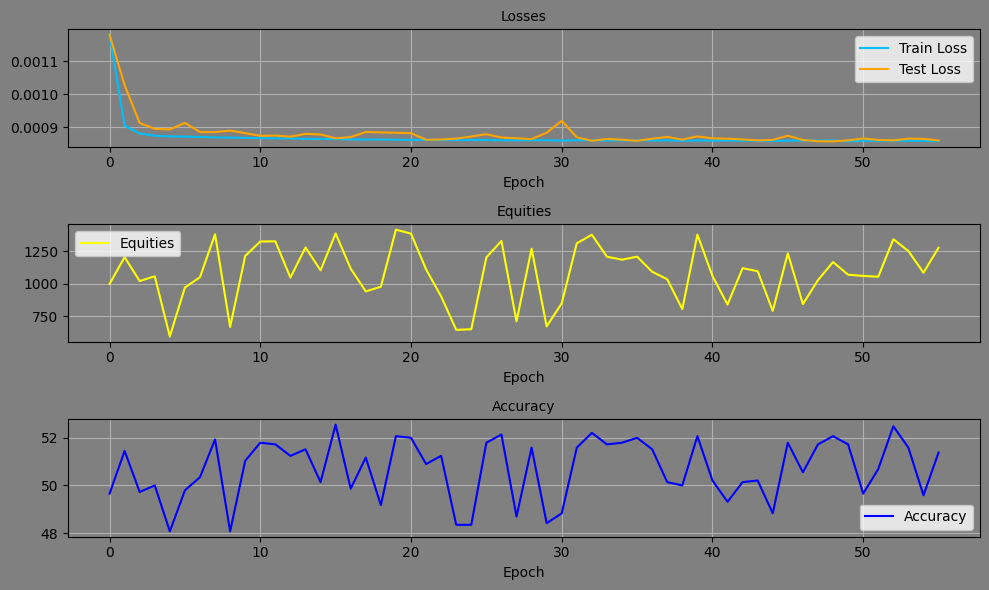

Epoch: 56, Equity: 1349.75, Accuracy: 51.52 train_losses: 0.0020152056503349976, test_losses: 0.0008617160492576659, Duration: 0:00:01.389134


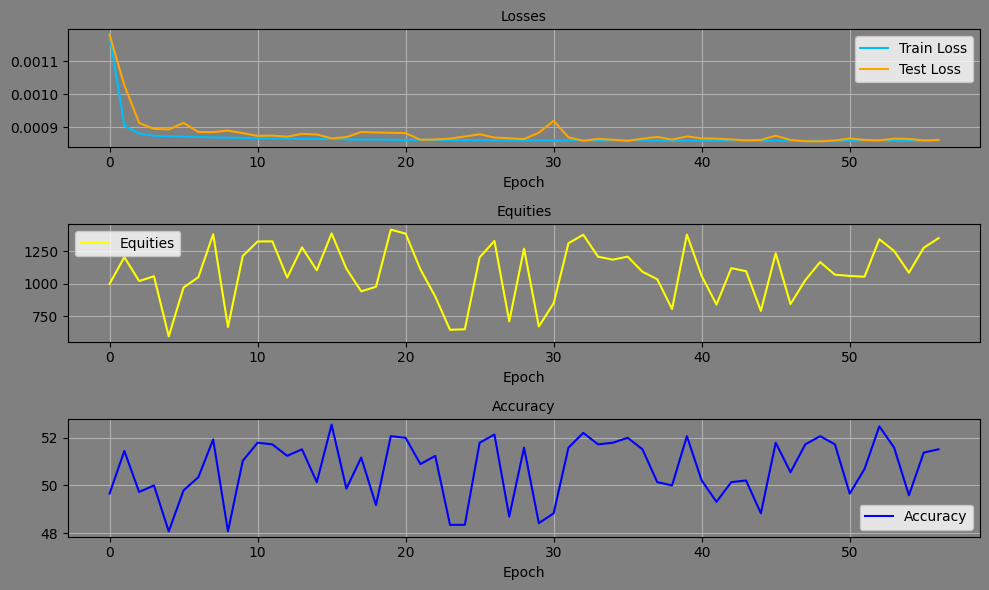

Epoch: 57, Equity: 1118.56, Accuracy: 51.52 train_losses: 0.0020112369942235156, test_losses: 0.0008593269158154726, Duration: 0:00:01.375567


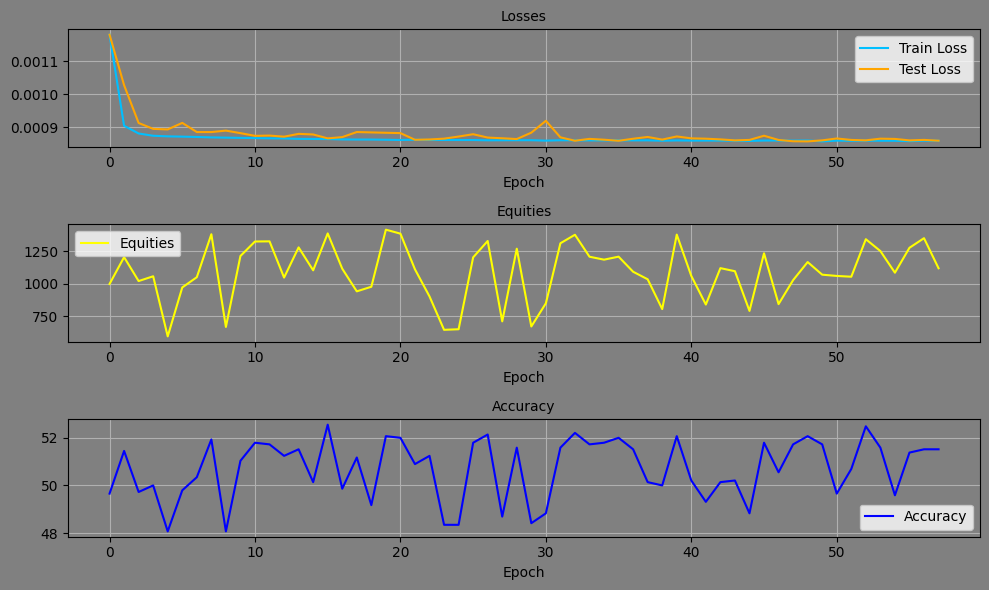

Epoch: 58, Equity: 1223.23, Accuracy: 51.93 train_losses: 0.002015777420119873, test_losses: 0.000860271044075489, Duration: 0:00:01.367137


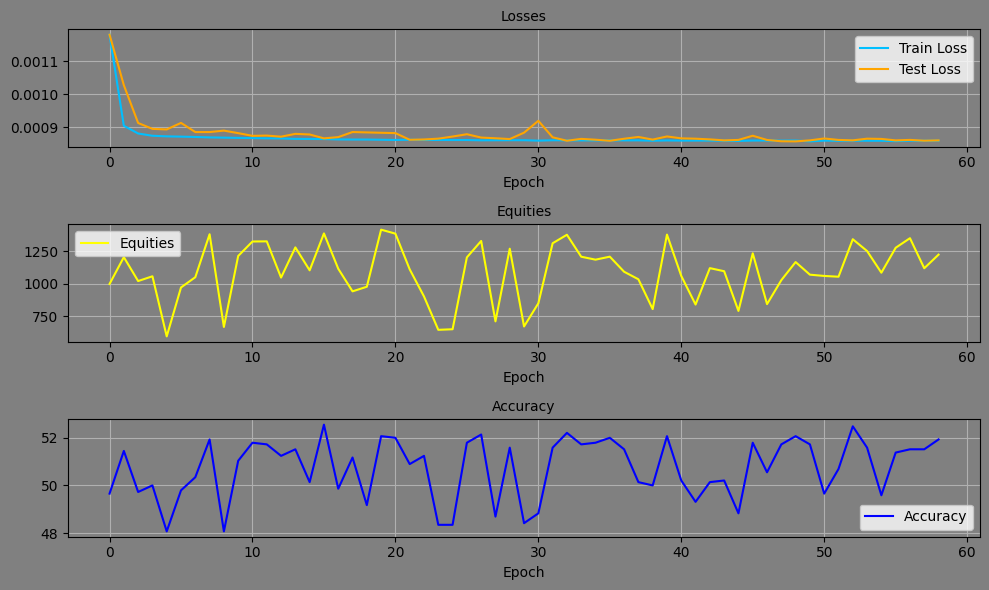

Epoch: 59, Equity: 804.04, Accuracy: 49.24 train_losses: 0.0020126694845499665, test_losses: 0.0008598152198828757, Duration: 0:00:01.465344


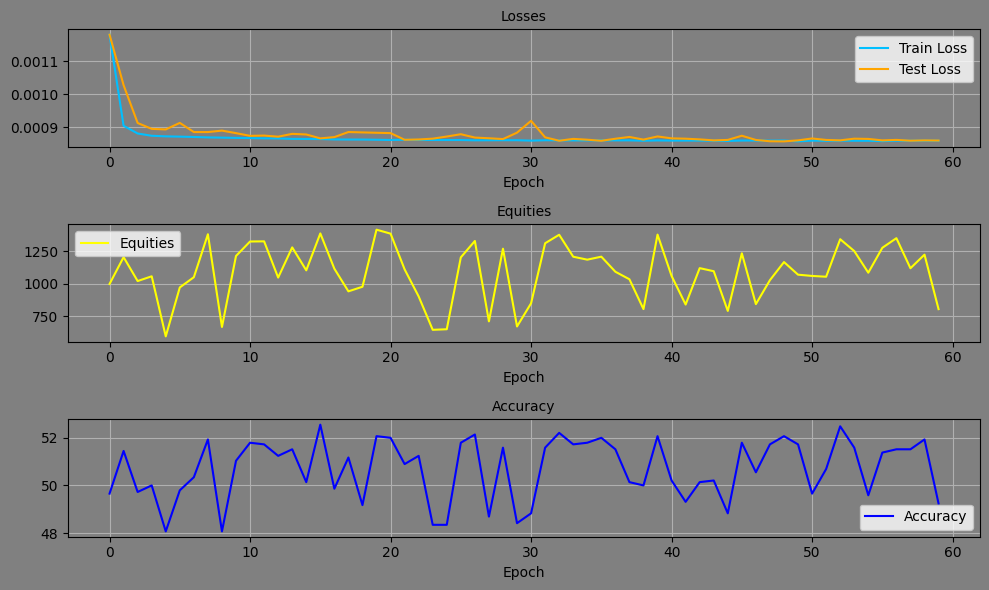

Epoch: 60, Equity: 907.30, Accuracy: 49.59 train_losses: 0.002010548711582471, test_losses: 0.0008686560322530568, Duration: 0:00:01.472466


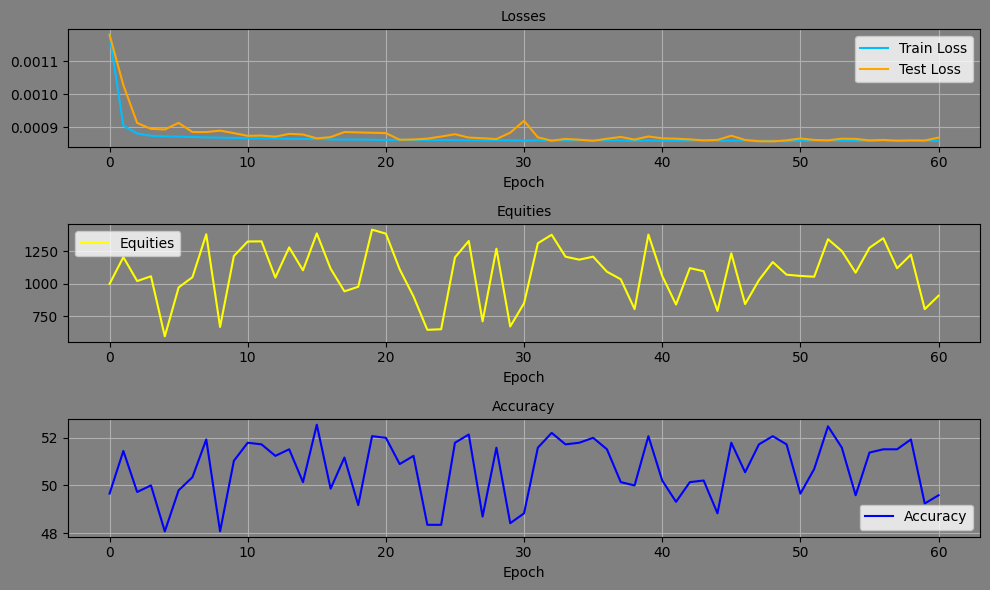

Epoch: 61, Equity: 1231.57, Accuracy: 52.34 train_losses: 0.002014308850223359, test_losses: 0.000859048857819289, Duration: 0:00:01.500395


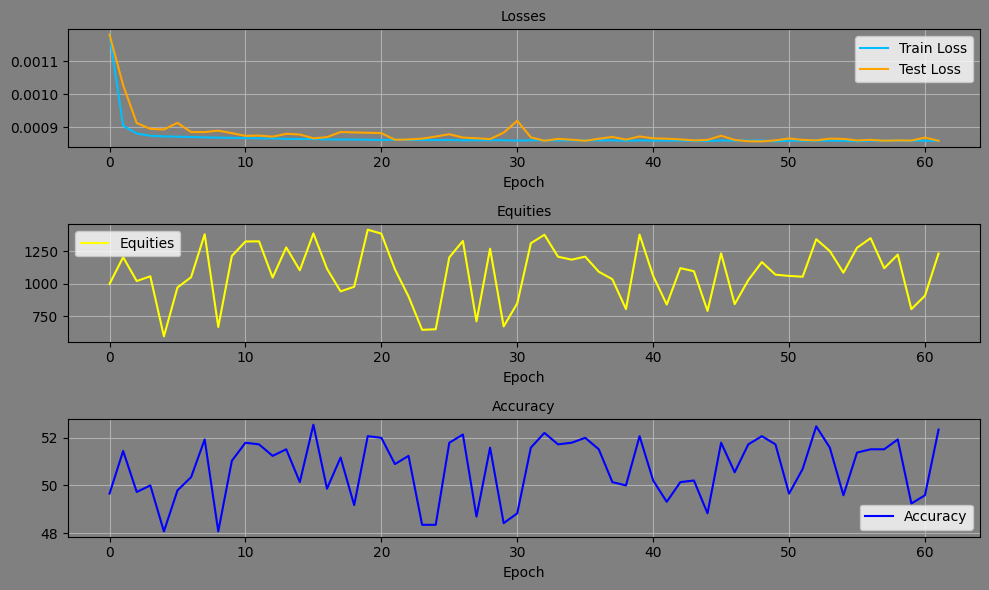

Epoch: 62, Equity: 1293.95, Accuracy: 51.58 train_losses: 0.002014143865198351, test_losses: 0.000876755453646183, Duration: 0:00:01.424347


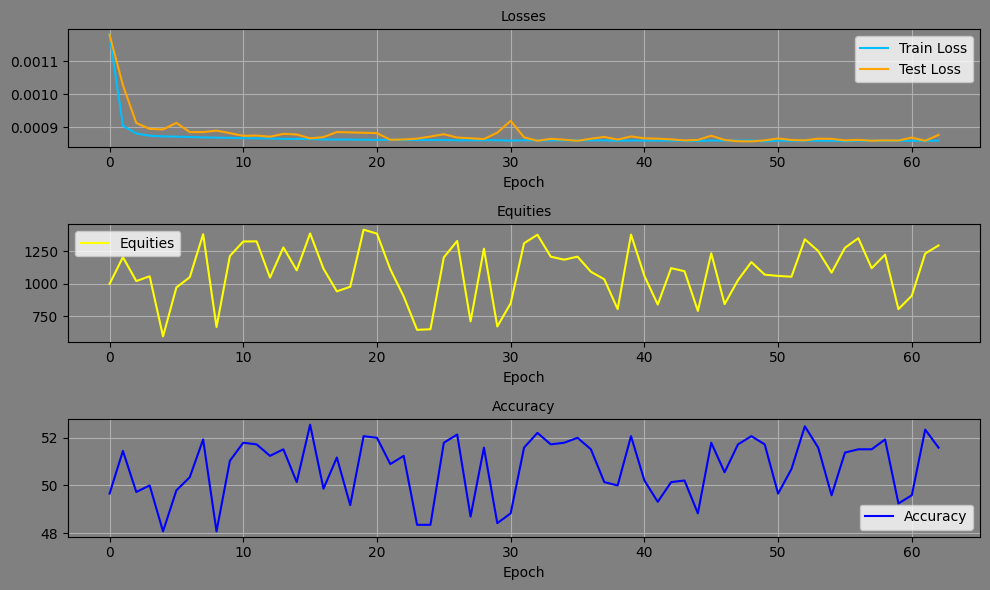

Epoch: 63, Equity: 887.03, Accuracy: 49.38 train_losses: 0.0020081311372304035, test_losses: 0.0008624689653515816, Duration: 0:00:01.445276


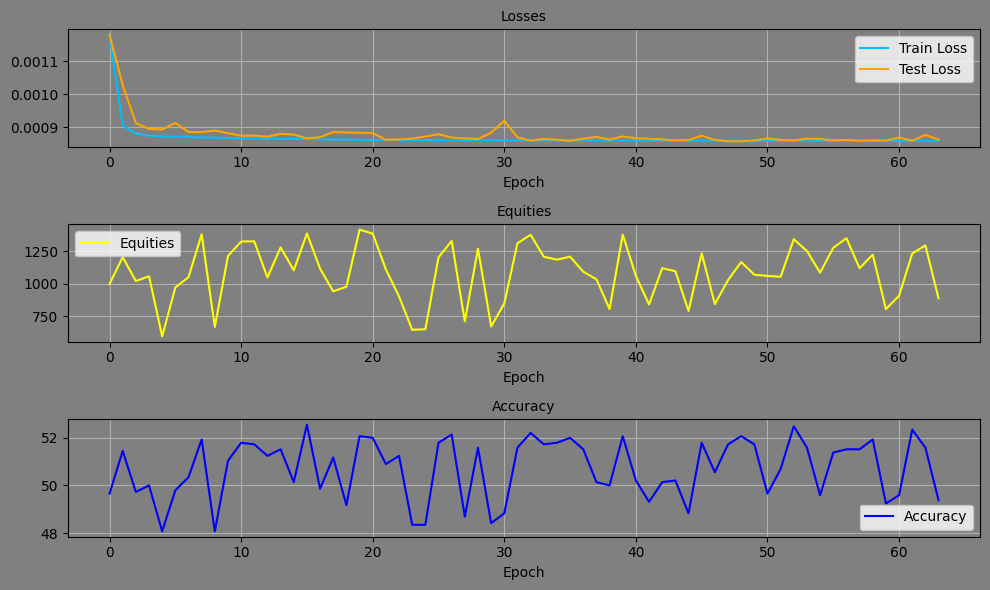

Epoch: 64, Equity: 1136.32, Accuracy: 50.69 train_losses: 0.0020135797896734557, test_losses: 0.0008601841982454062, Duration: 0:00:01.468623


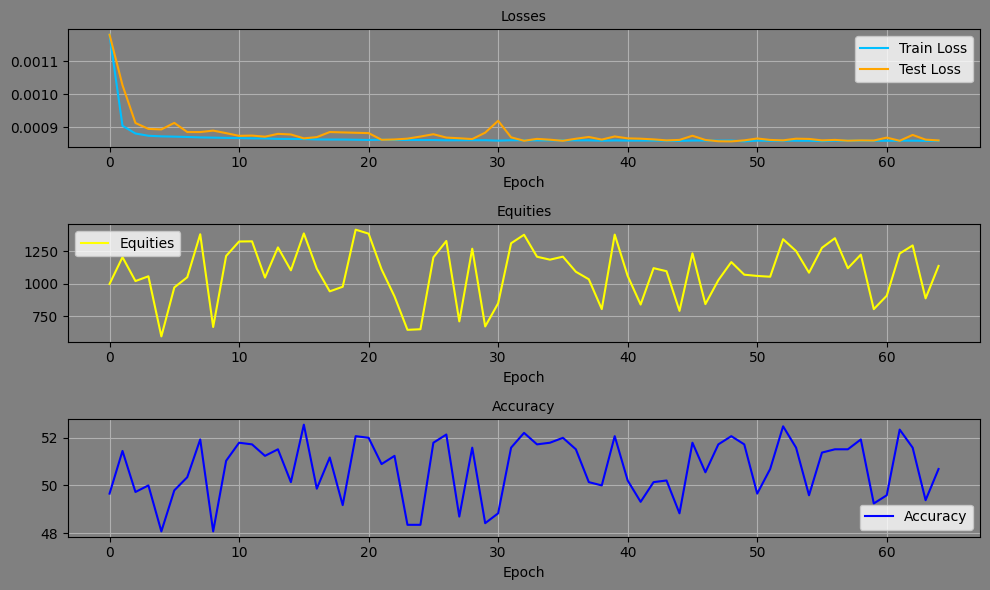

Epoch: 65, Equity: 1131.17, Accuracy: 50.41 train_losses: 0.0020108878817809844, test_losses: 0.0008602580055594444, Duration: 0:00:01.523980


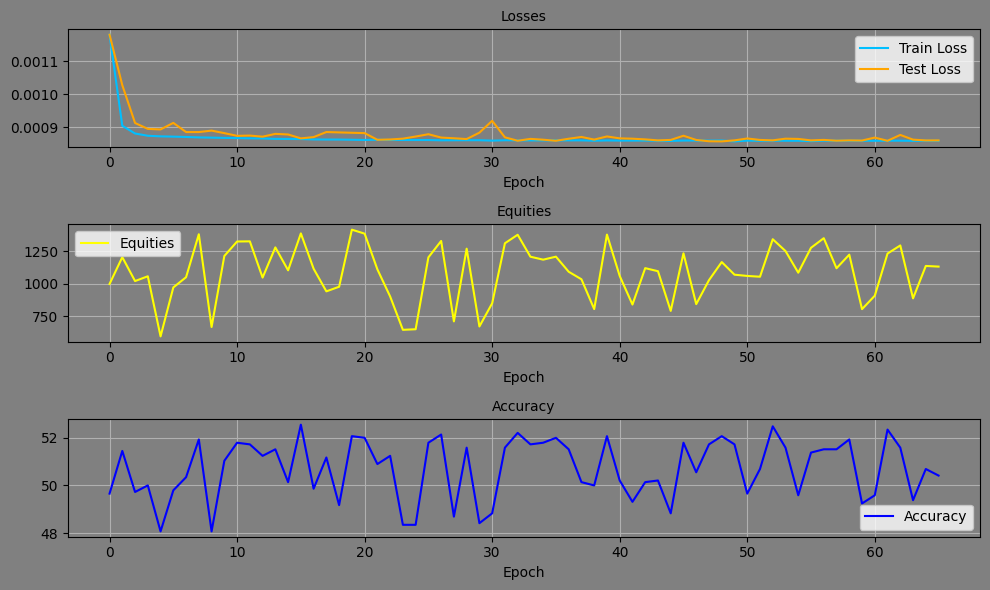

Epoch: 66, Equity: 1258.90, Accuracy: 51.17 train_losses: 0.0020107191162831465, test_losses: 0.0008644756744615734, Duration: 0:00:01.455699


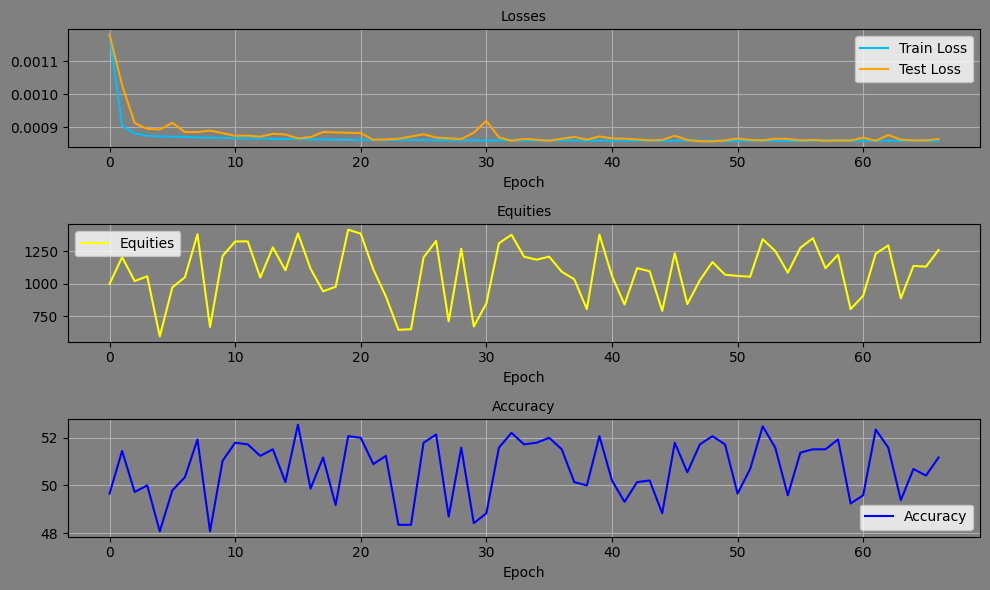

Epoch: 67, Equity: 1248.46, Accuracy: 51.38 train_losses: 0.002013140091819415, test_losses: 0.0008586710900999606, Duration: 0:00:01.477398


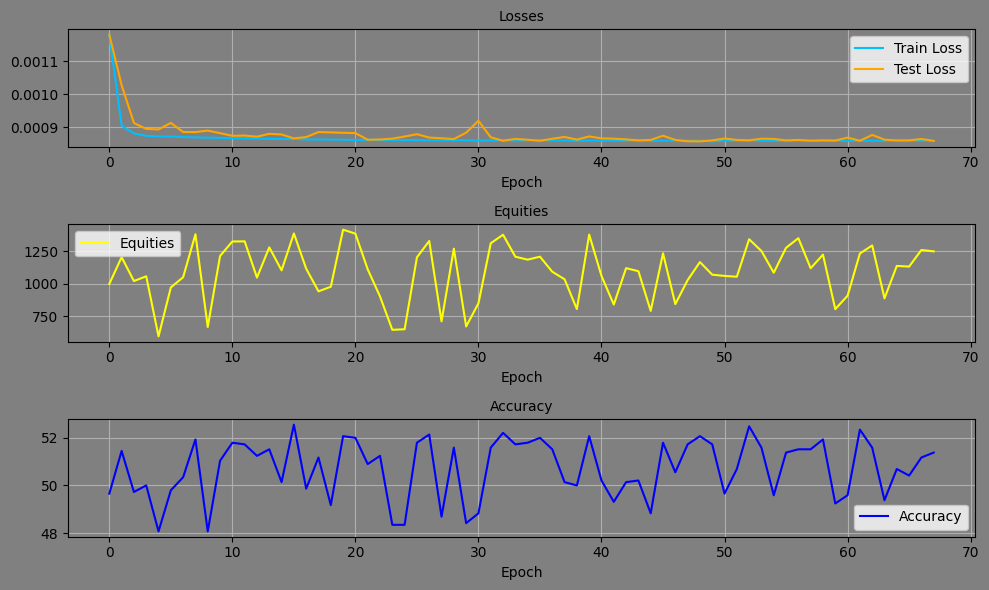

Epoch: 68, Equity: 1105.84, Accuracy: 50.83 train_losses: 0.0020087395896292277, test_losses: 0.0008586344192735851, Duration: 0:00:01.426528


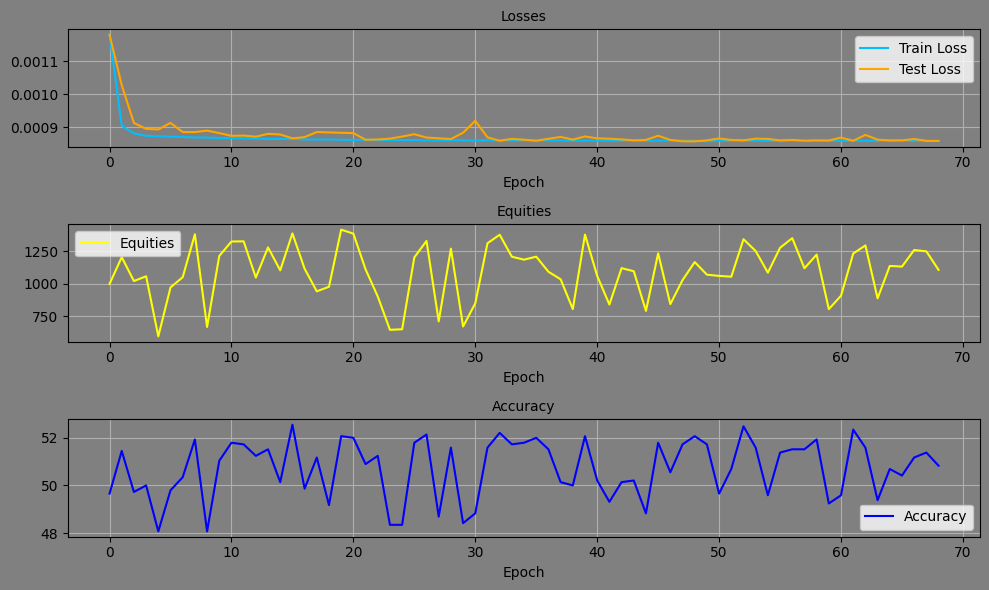

Epoch: 69, Equity: 792.31, Accuracy: 48.48 train_losses: 0.0020102038157529677, test_losses: 0.0008742220234125853, Duration: 0:00:01.412564


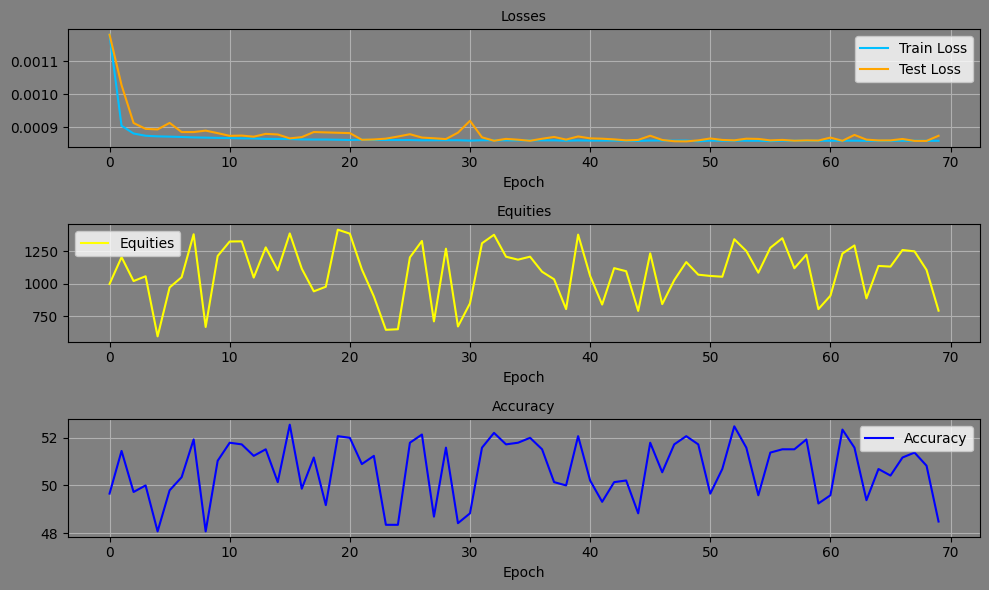

Epoch: 70, Equity: 1182.69, Accuracy: 52.34 train_losses: 0.0020101391080279557, test_losses: 0.0008595940889790654, Duration: 0:00:01.395993


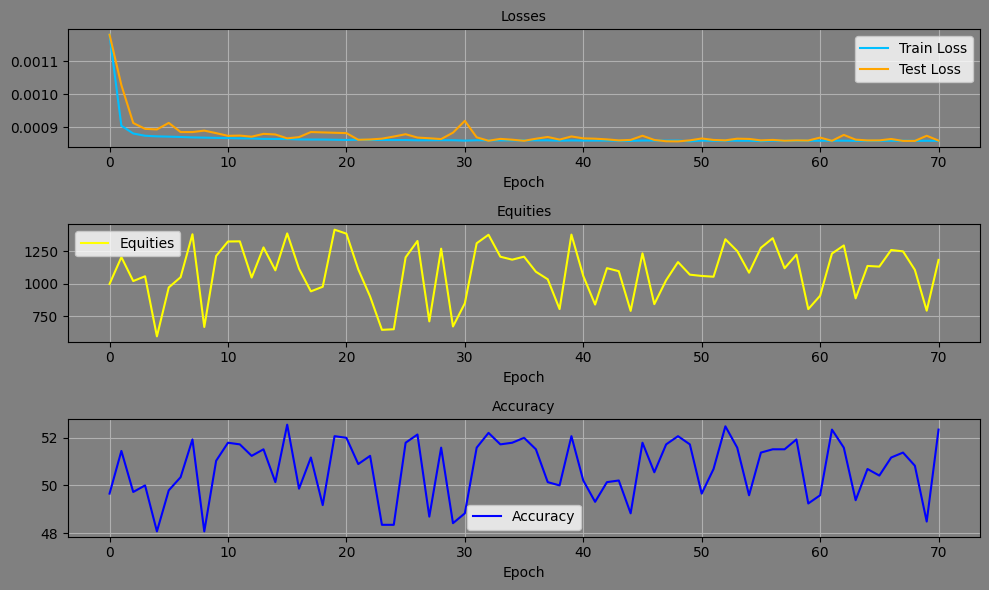

Epoch: 71, Equity: 1007.16, Accuracy: 49.59 train_losses: 0.0020103439659265782, test_losses: 0.000857151229865849, Duration: 0:00:01.497868


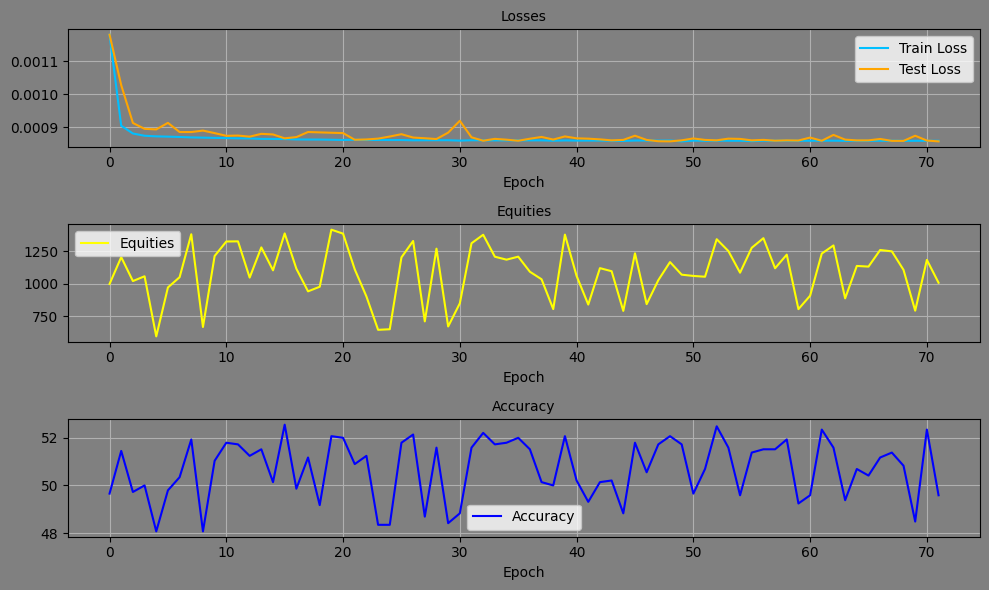

Epoch: 72, Equity: 1178.89, Accuracy: 52.00 train_losses: 0.0020104853260476062, test_losses: 0.0008624157053418458, Duration: 0:00:01.501762


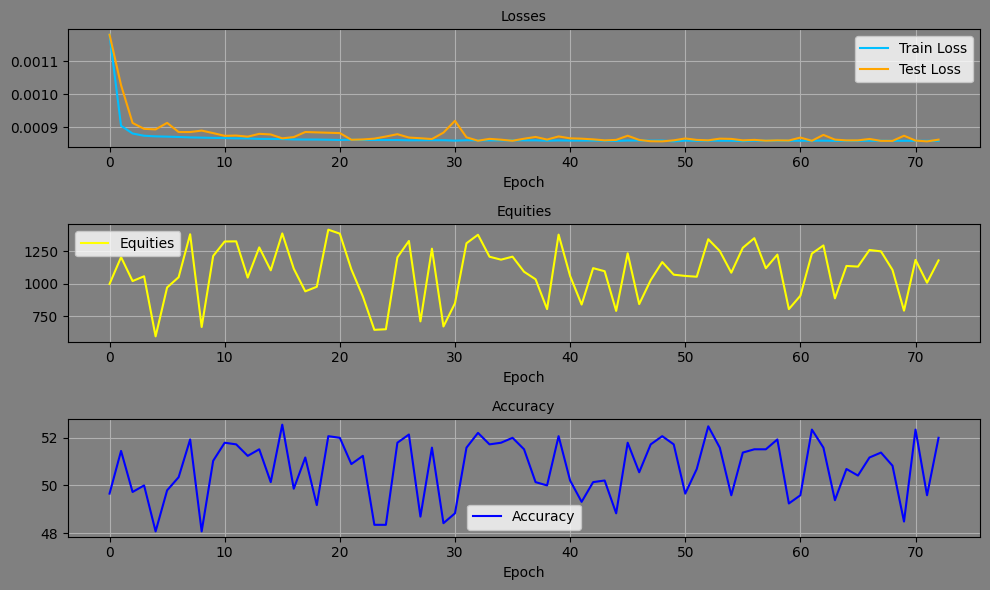

Epoch: 73, Equity: 1275.36, Accuracy: 50.90 train_losses: 0.0020103081675892274, test_losses: 0.0008585670148022473, Duration: 0:00:01.494373


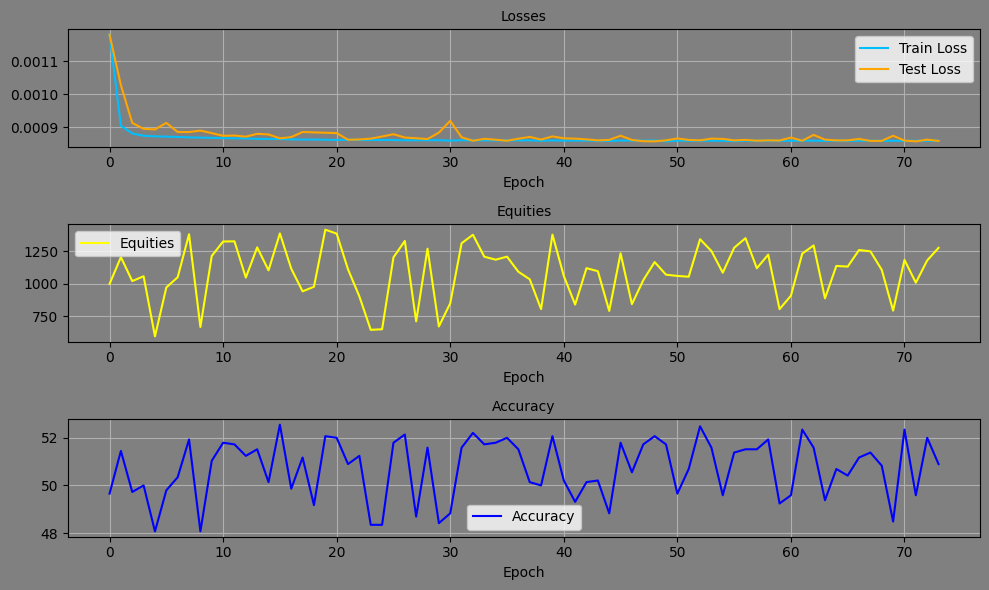

Epoch: 74, Equity: 1266.04, Accuracy: 52.13 train_losses: 0.002006966724268271, test_losses: 0.000858619692735374, Duration: 0:00:01.451142


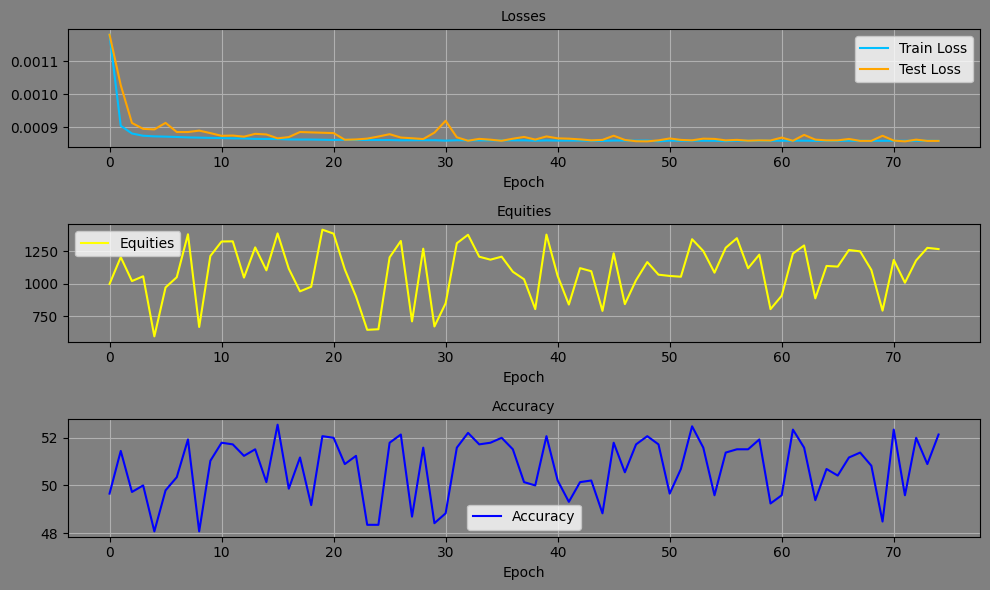

Epoch: 75, Equity: 894.79, Accuracy: 50.00 train_losses: 0.0020071395886077223, test_losses: 0.0008588788332417607, Duration: 0:00:01.406574


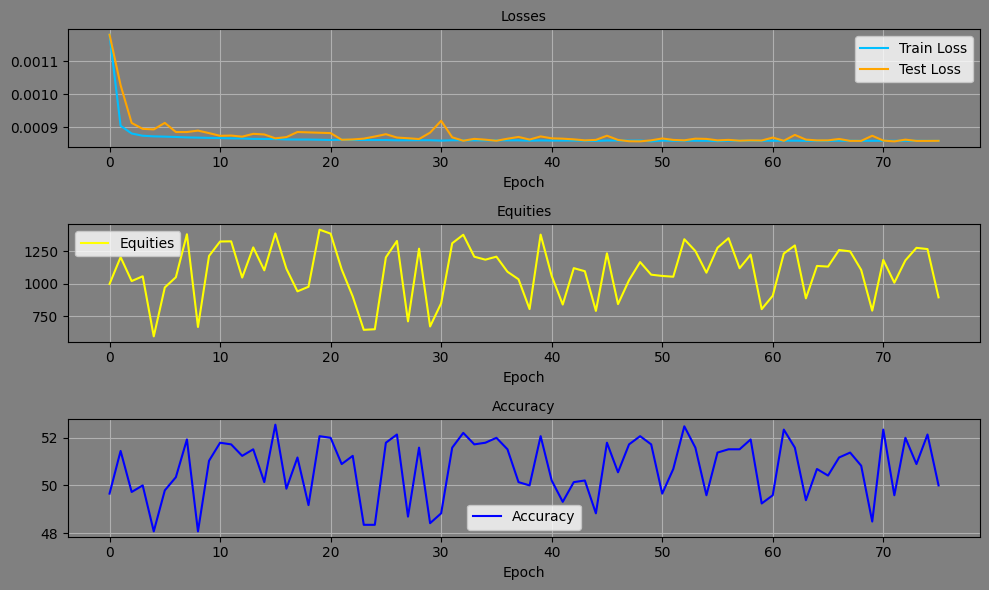

Epoch: 76, Equity: 1230.05, Accuracy: 49.86 train_losses: 0.002006746852965725, test_losses: 0.0008624090114608407, Duration: 0:00:01.510008


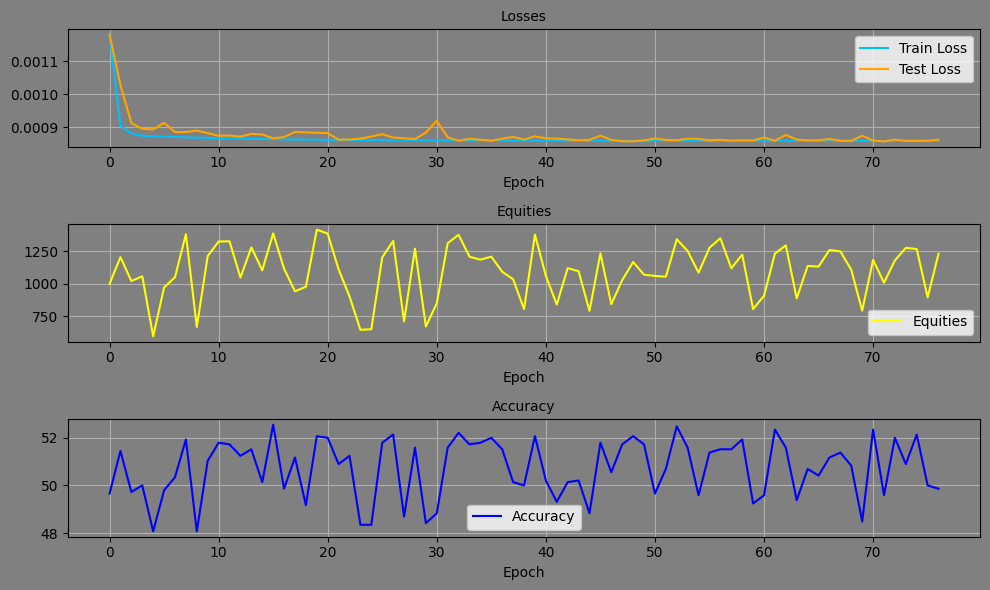

Epoch: 77, Equity: 1155.22, Accuracy: 51.10 train_losses: 0.002005502038533502, test_losses: 0.0008578698034398258, Duration: 0:00:01.450003


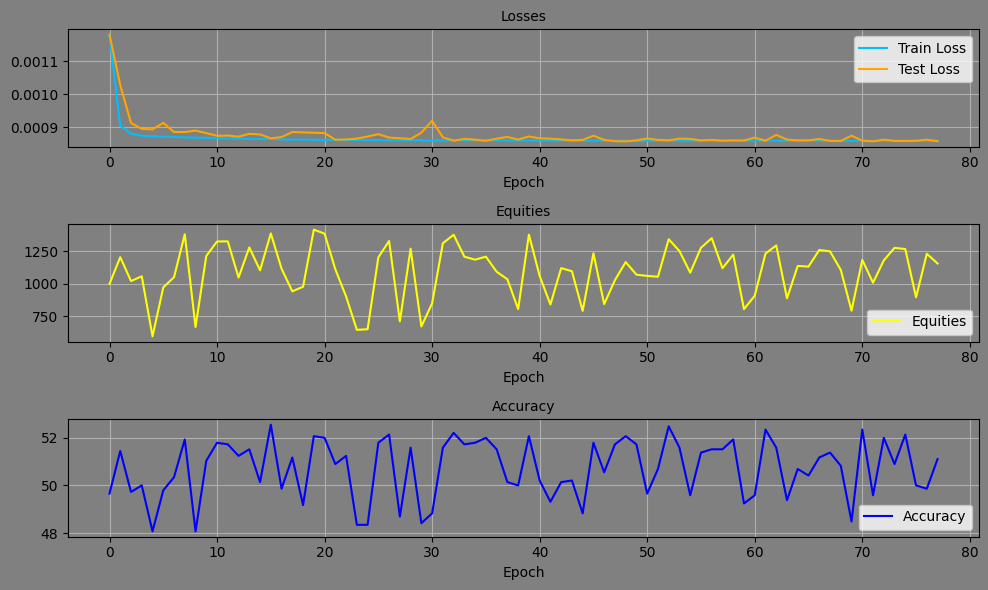

Epoch: 78, Equity: 1169.27, Accuracy: 50.55 train_losses: 0.0020032436513896085, test_losses: 0.00085969059728086, Duration: 0:00:01.500416


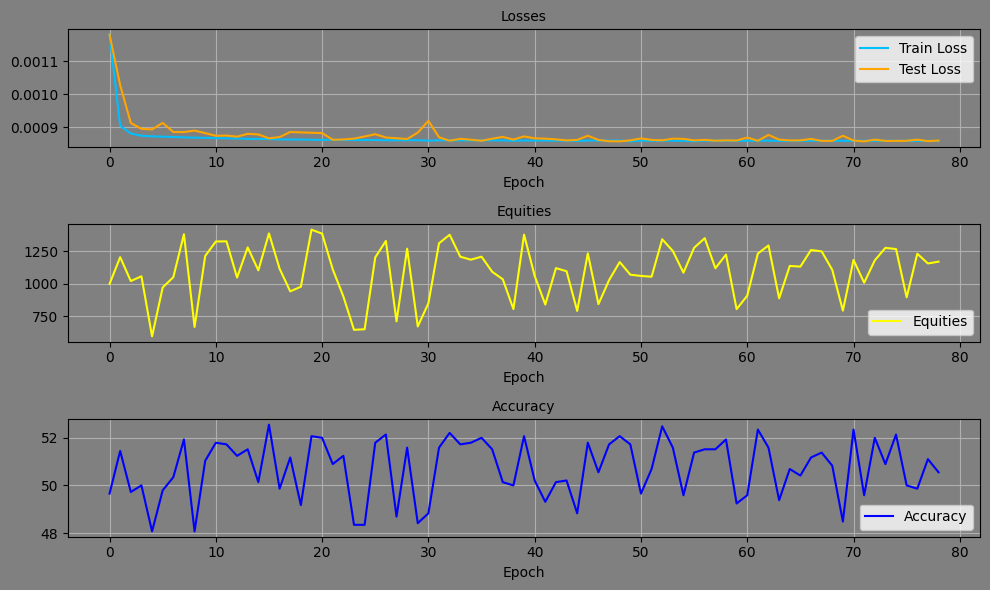

Epoch: 79, Equity: 1039.67, Accuracy: 51.10 train_losses: 0.0020017556475407, test_losses: 0.0008629126823507249, Duration: 0:00:01.349615


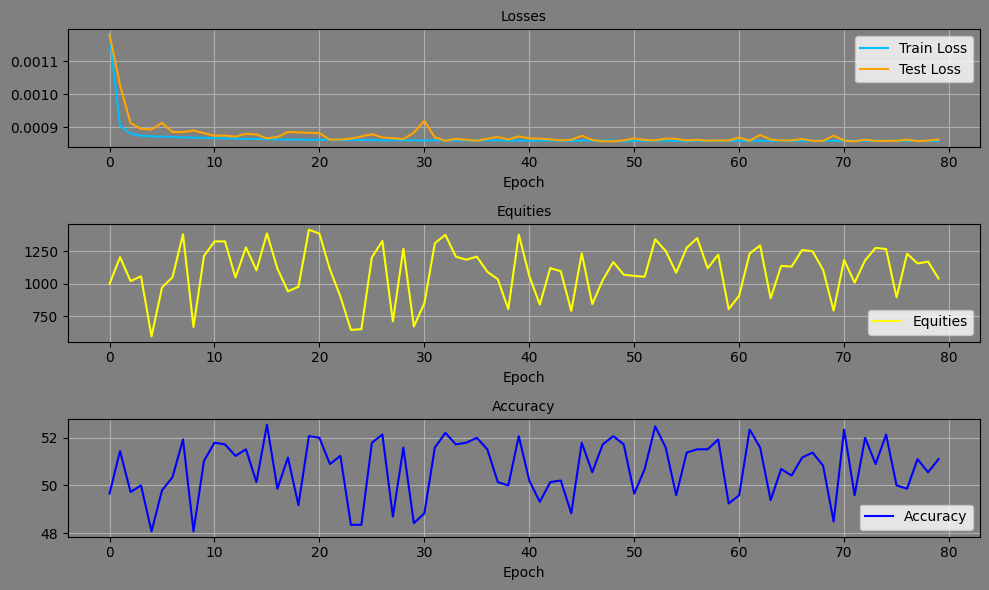

Epoch: 80, Equity: 853.97, Accuracy: 50.34 train_losses: 0.002007852977005711, test_losses: 0.0008572171209380031, Duration: 0:00:01.387953


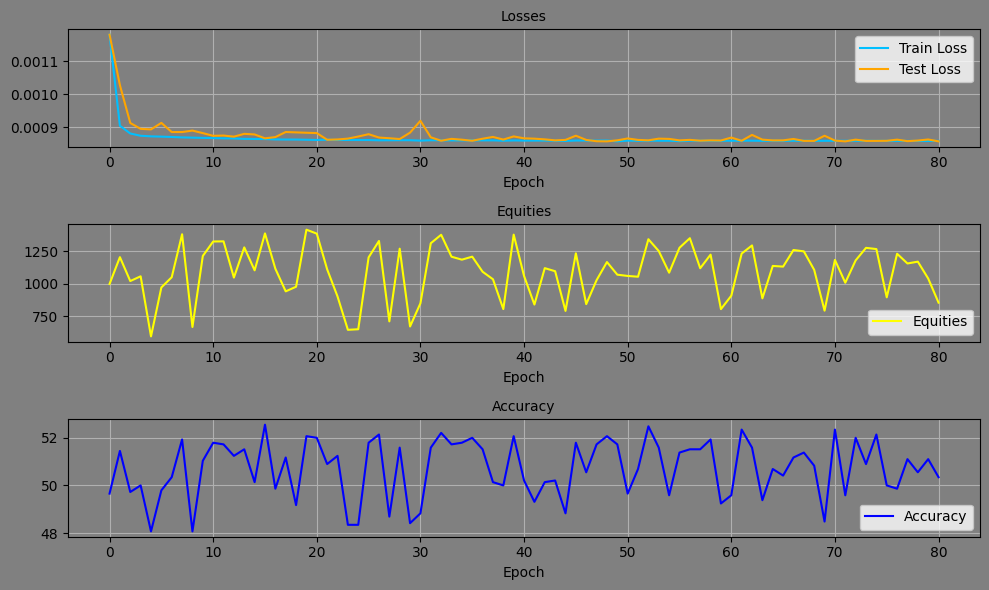

Epoch: 81, Equity: 905.38, Accuracy: 51.24 train_losses: 0.00200684864356059, test_losses: 0.0008578940178267658, Duration: 0:00:01.494051


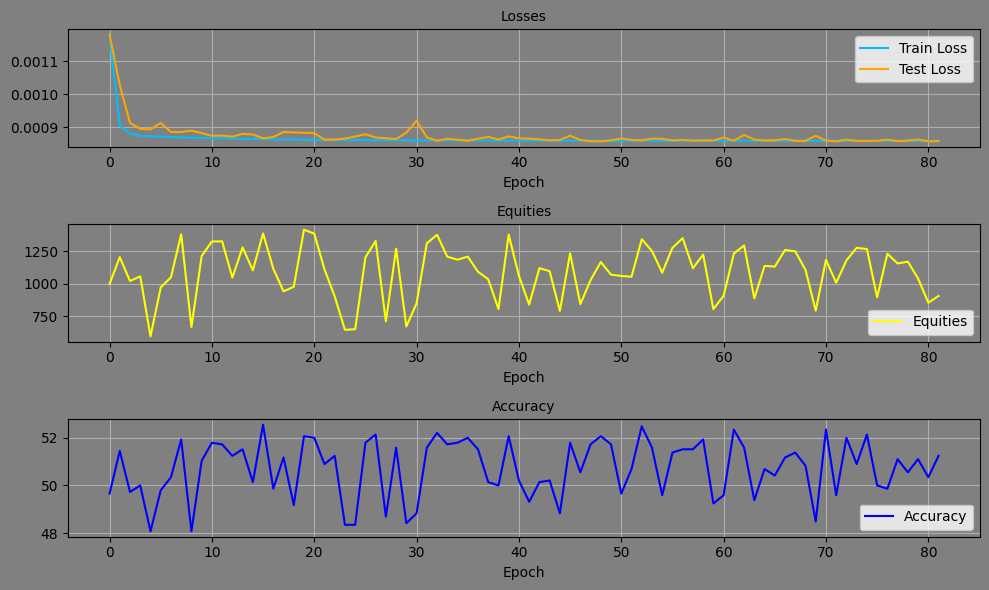

Epoch: 82, Equity: 1095.39, Accuracy: 50.55 train_losses: 0.002006176529922873, test_losses: 0.0008586982148699462, Duration: 0:00:01.477128


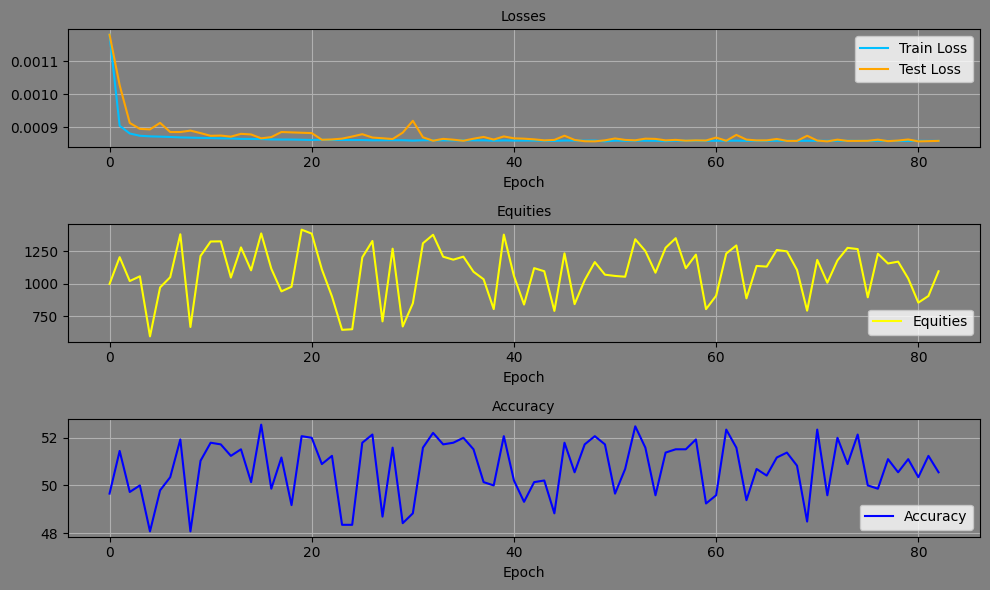

Epoch: 83, Equity: 871.78, Accuracy: 49.24 train_losses: 0.002000784865074781, test_losses: 0.0008630625670775771, Duration: 0:00:01.508310


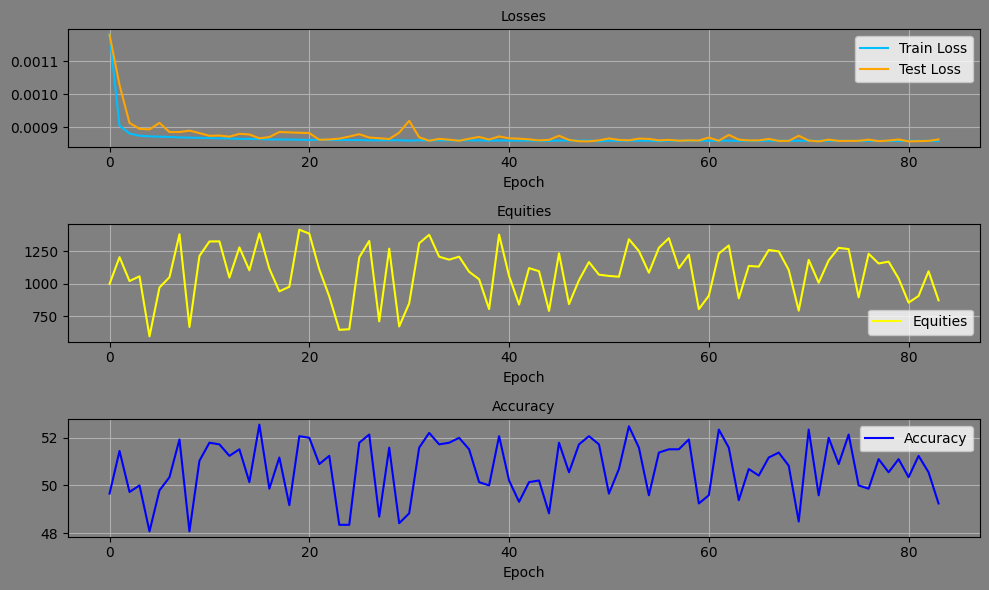

Epoch: 84, Equity: 1288.18, Accuracy: 52.07 train_losses: 0.0019988033652020196, test_losses: 0.0008590591605752707, Duration: 0:00:01.505436


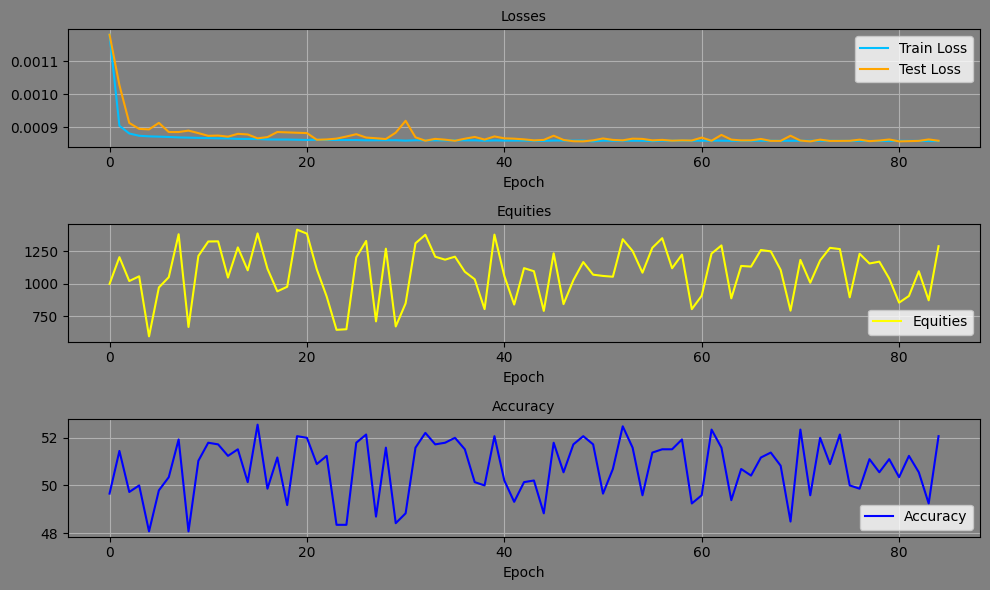

Epoch: 85, Equity: 1194.42, Accuracy: 50.83 train_losses: 0.002004950156157476, test_losses: 0.0008599669672548771, Duration: 0:00:01.410617


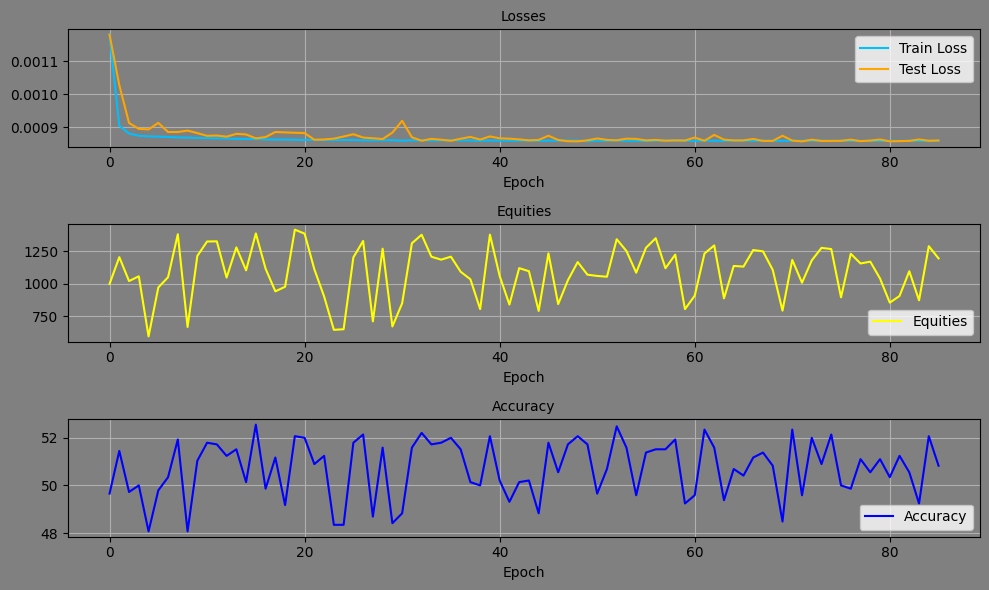

Epoch: 86, Equity: 1272.60, Accuracy: 50.69 train_losses: 0.002004538201973156, test_losses: 0.0008614944526925683, Duration: 0:00:01.567396


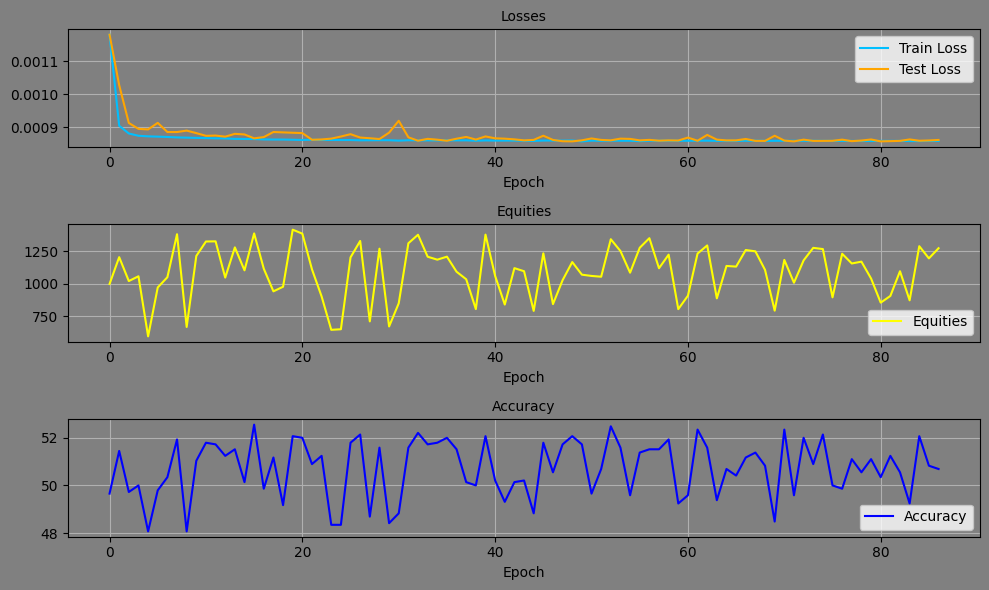

Epoch: 87, Equity: 1004.83, Accuracy: 51.65 train_losses: 0.002004332633690715, test_losses: 0.0008578361594118178, Duration: 0:00:01.421276


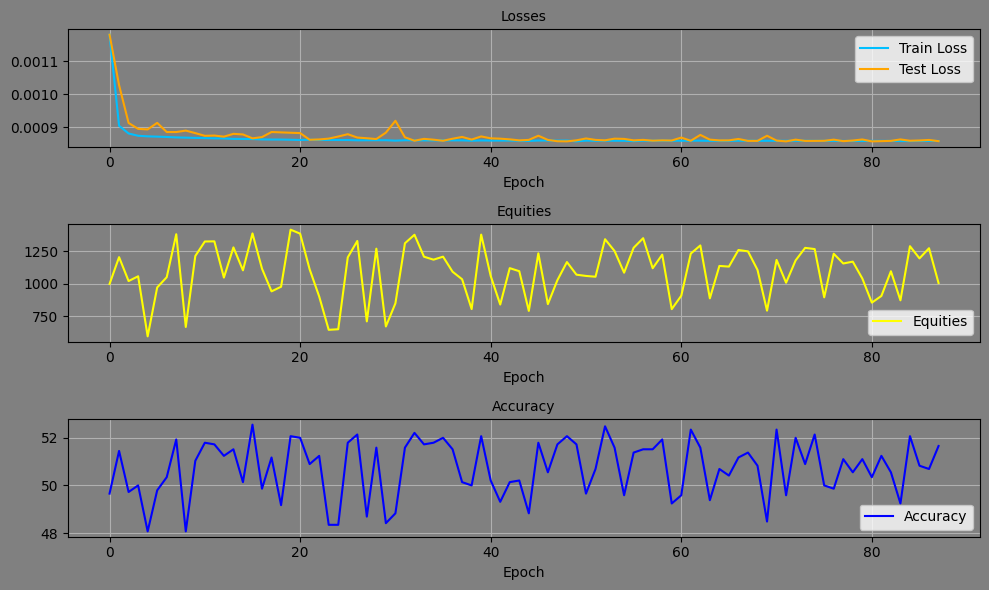

Epoch: 88, Equity: 1087.73, Accuracy: 51.03 train_losses: 0.0020053984752128494, test_losses: 0.0008576858672313392, Duration: 0:00:01.409731


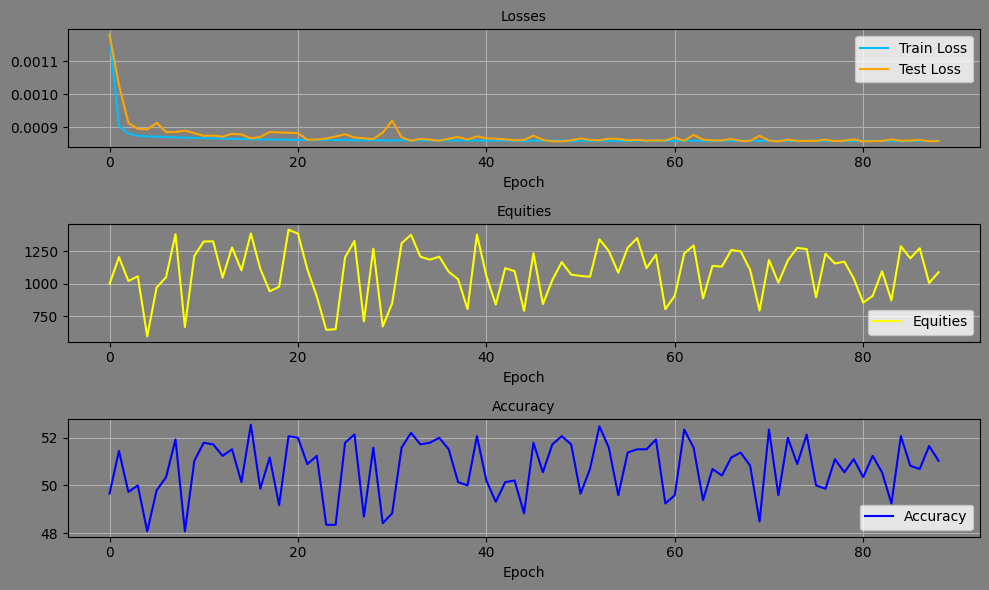

Epoch: 89, Equity: 920.13, Accuracy: 50.55 train_losses: 0.0020041619496349926, test_losses: 0.0008597241248935461, Duration: 0:00:01.850186


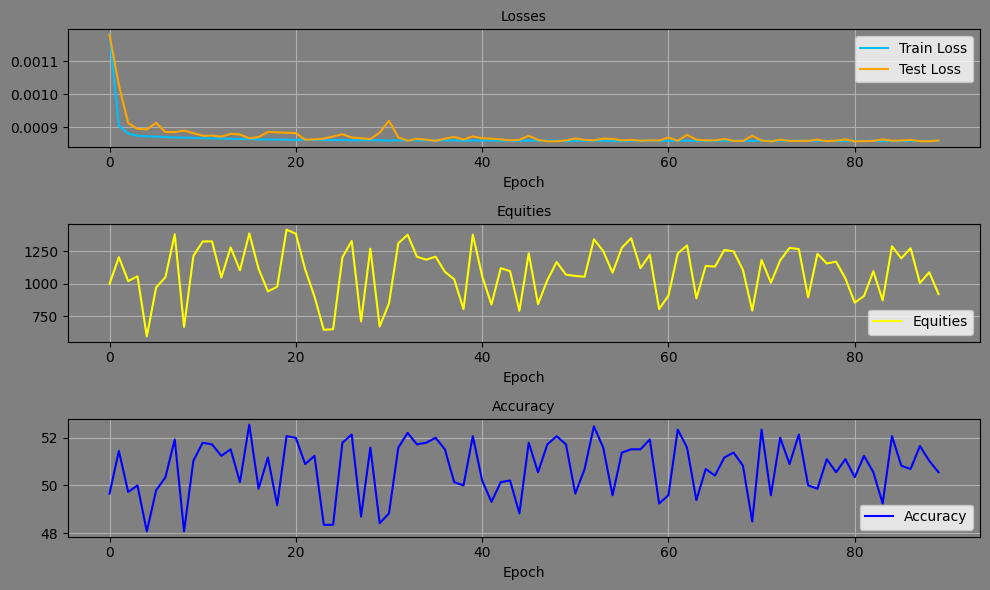

Epoch: 90, Equity: 1112.09, Accuracy: 50.55 train_losses: 0.0019995643408663613, test_losses: 0.0008755403687246144, Duration: 0:00:01.589587


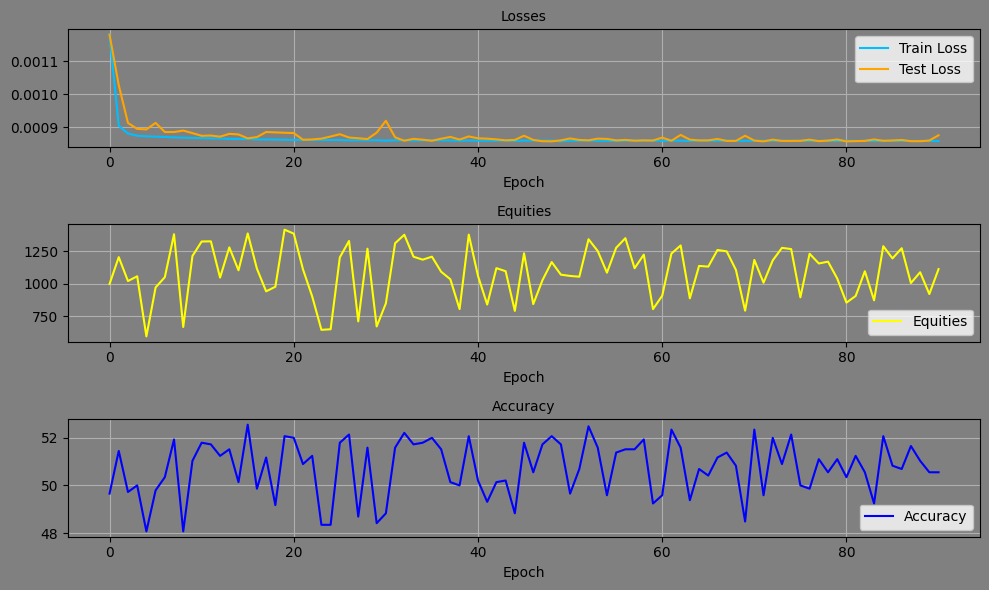

Epoch: 91, Equity: 943.34, Accuracy: 48.48 train_losses: 0.0019971785611451326, test_losses: 0.0008744150400161743, Duration: 0:00:01.486348


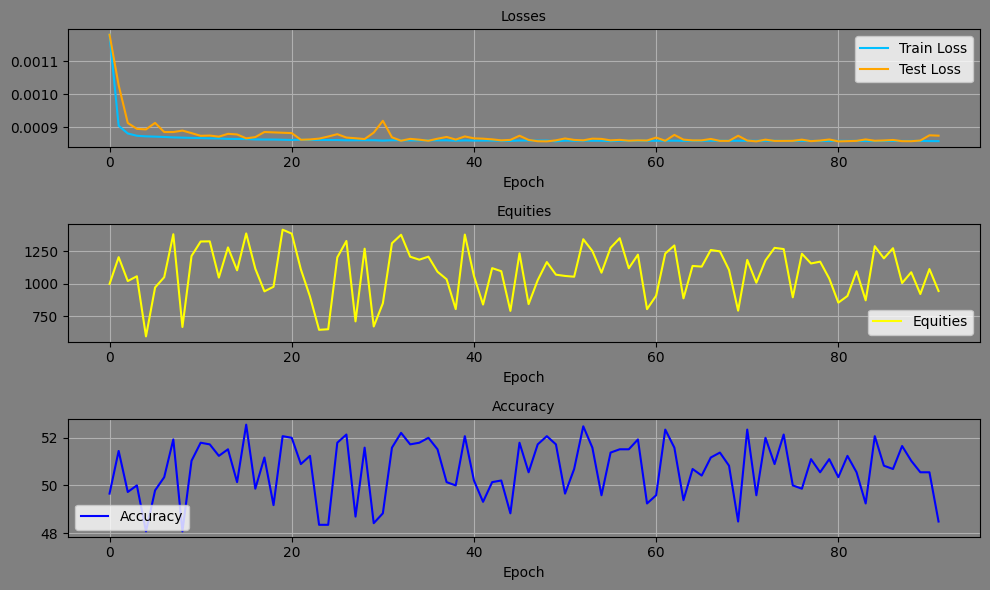

Epoch: 92, Equity: 1212.24, Accuracy: 51.31 train_losses: 0.0020025087084235642, test_losses: 0.0008571533253416419, Duration: 0:00:01.473023


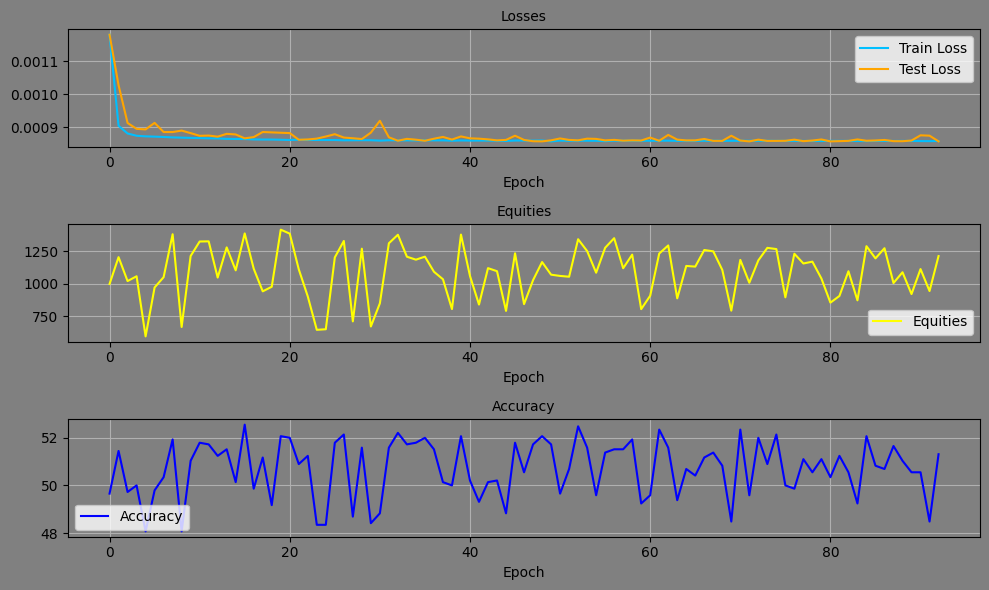

Epoch: 93, Equity: 1194.06, Accuracy: 51.10 train_losses: 0.0020018413032431783, test_losses: 0.0008584187016822398, Duration: 0:00:01.516143


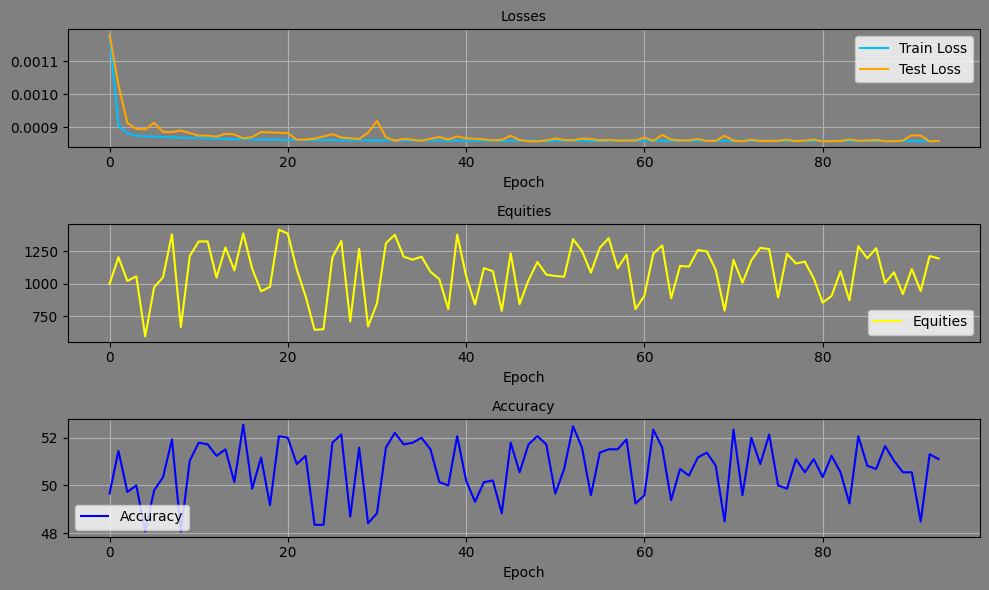

Epoch: 94, Equity: 1238.00, Accuracy: 50.41 train_losses: 0.0019974163402744828, test_losses: 0.0008622843306511641, Duration: 0:00:01.630413


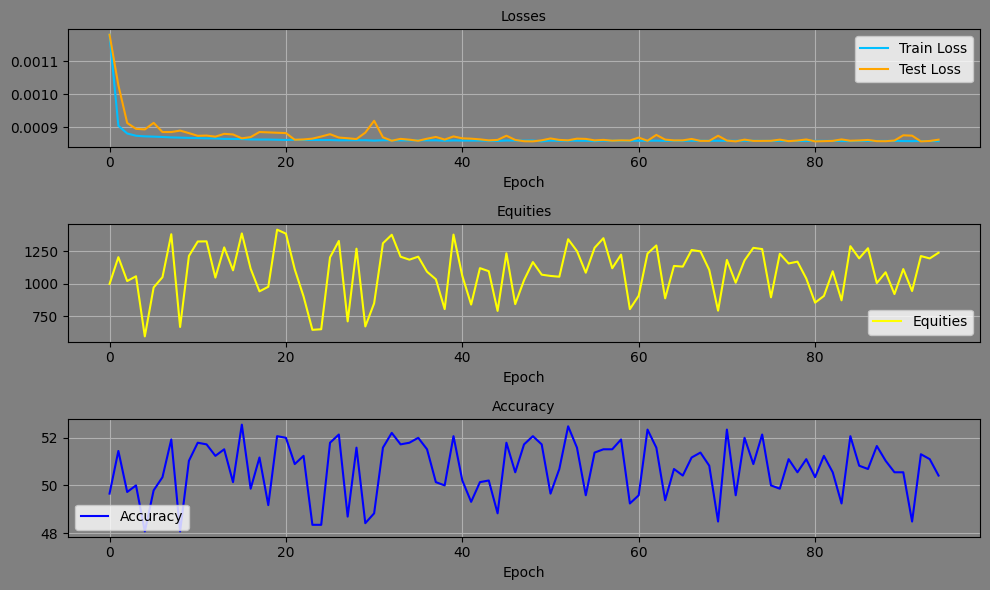

Epoch: 95, Equity: 1002.44, Accuracy: 51.52 train_losses: 0.0019997462180049216, test_losses: 0.0008554147789254785, Duration: 0:00:01.473678


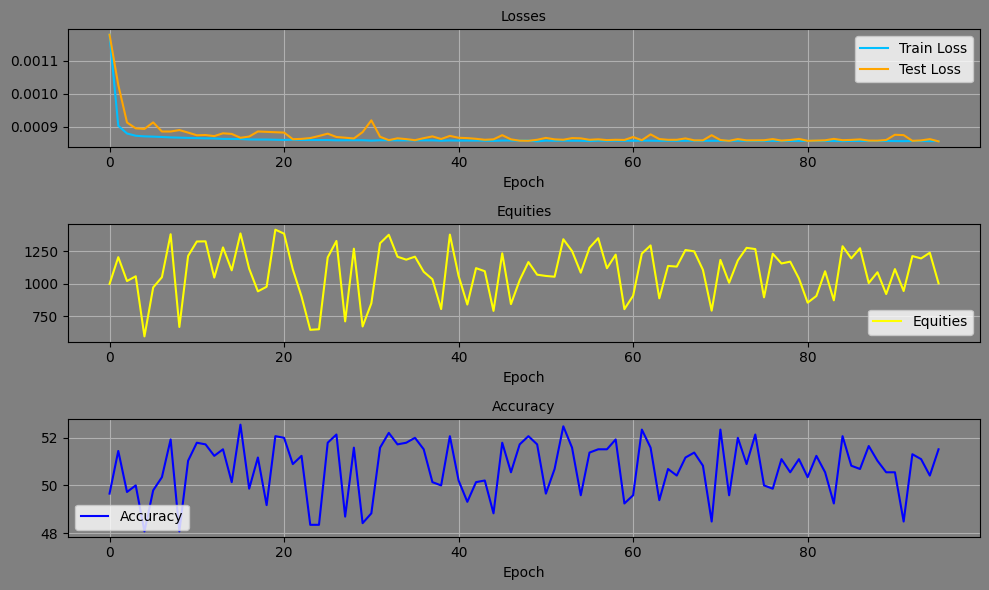

Epoch: 96, Equity: 1145.43, Accuracy: 50.00 train_losses: 0.002004848081930657, test_losses: 0.0008594359387643635, Duration: 0:00:01.498221


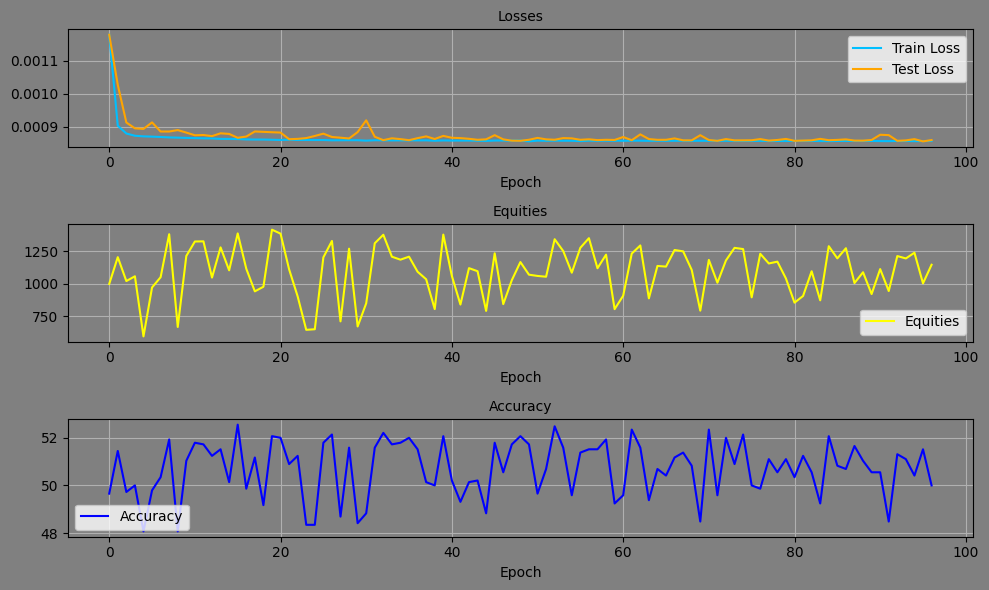

Epoch: 97, Equity: 1289.75, Accuracy: 52.48 train_losses: 0.0019978099692684655, test_losses: 0.0008629845688119531, Duration: 0:00:01.449153


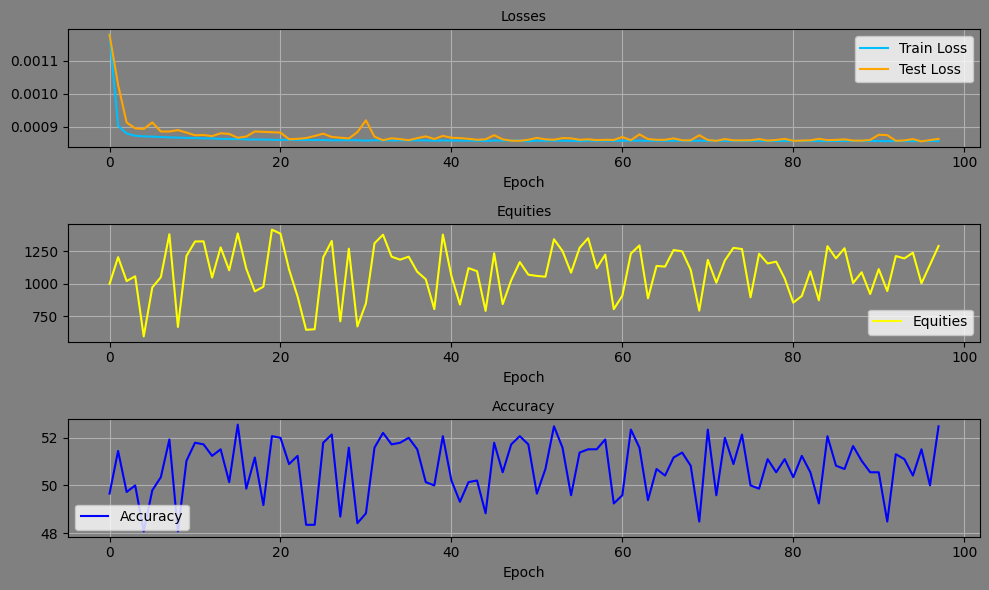

Epoch: 98, Equity: 958.59, Accuracy: 51.52 train_losses: 0.0019992981786175388, test_losses: 0.0008568755583837628, Duration: 0:00:01.490852


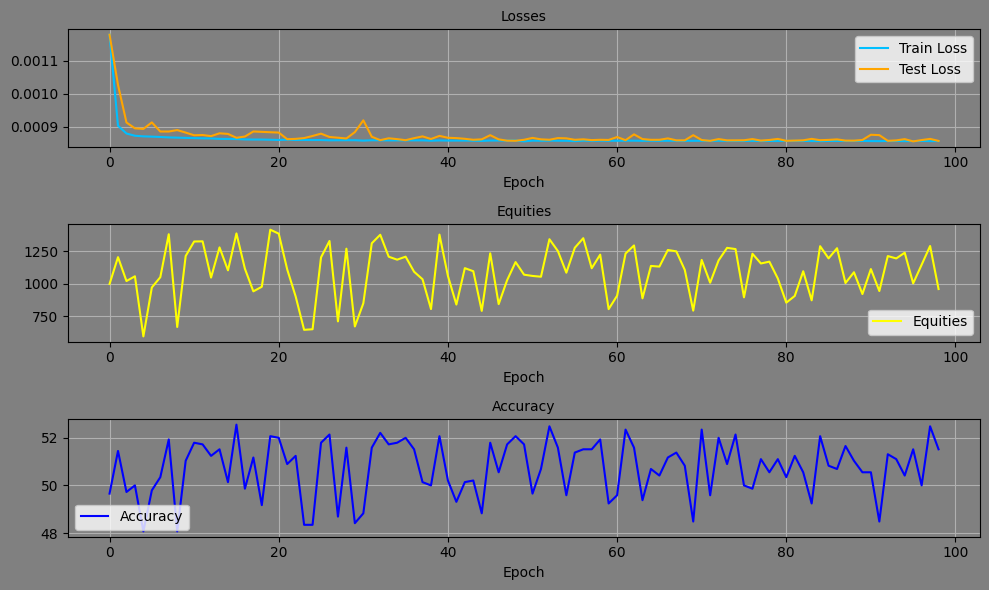

Epoch: 99, Equity: 1024.85, Accuracy: 50.69 train_losses: 0.0020000805126337874, test_losses: 0.0008598771528340876, Duration: 0:00:01.512253


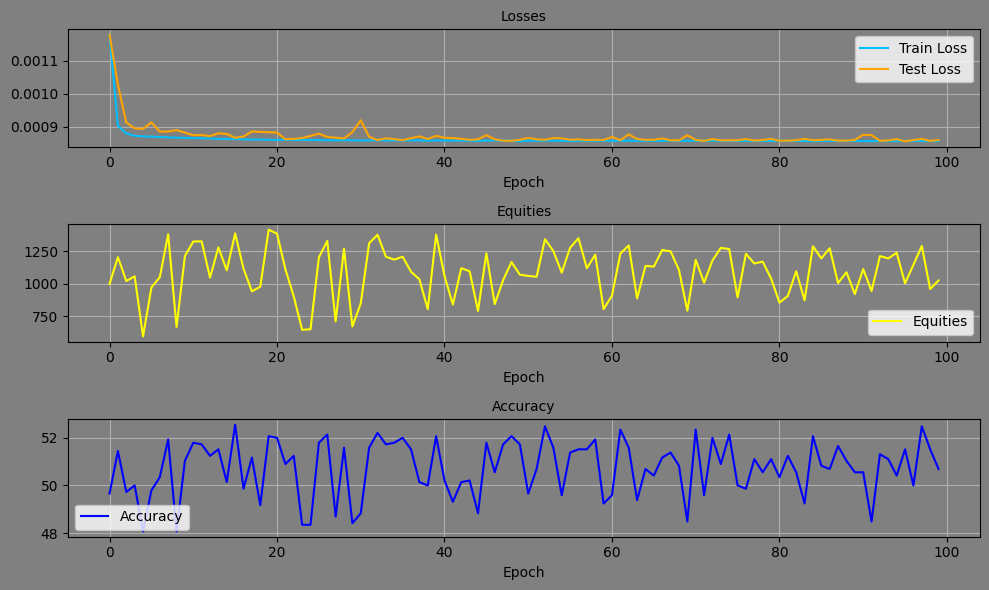

Epoch: 100, Equity: 880.28, Accuracy: 49.17 train_losses: 0.001999129403314109, test_losses: 0.0008675845456309617, Duration: 0:00:01.659072


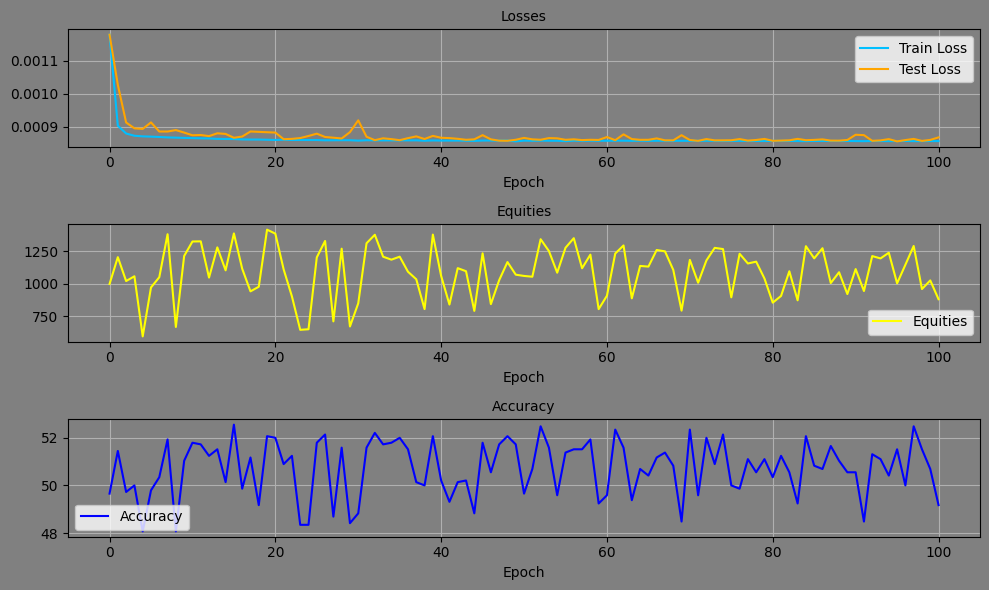

Epoch: 101, Equity: 1226.76, Accuracy: 51.17 train_losses: 0.001998775003988656, test_losses: 0.0008611769299022853, Duration: 0:00:01.395046


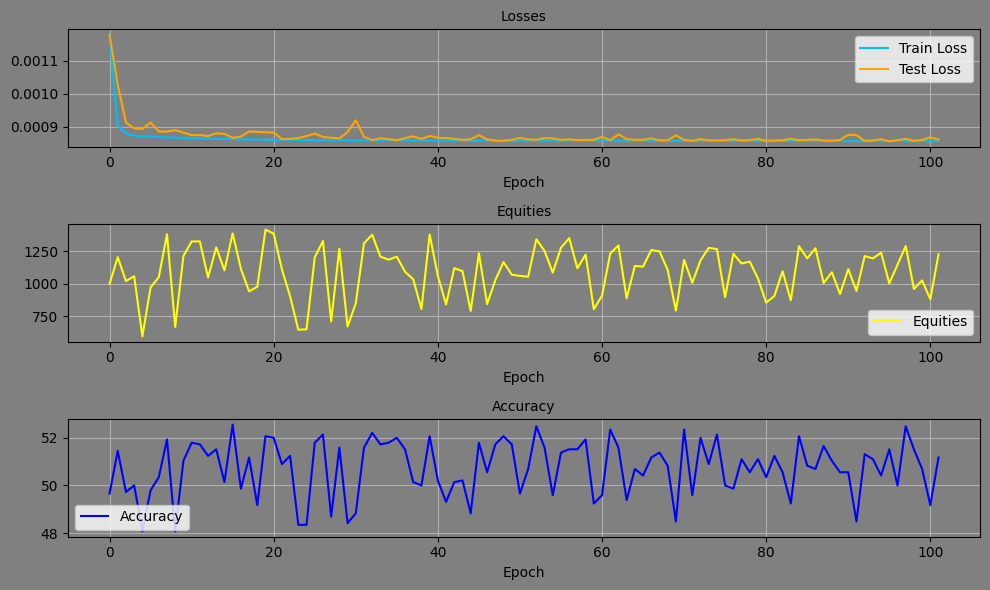

Epoch: 102, Equity: 1213.15, Accuracy: 51.24 train_losses: 0.0019929757700376813, test_losses: 0.0008619120926596224, Duration: 0:00:01.518178


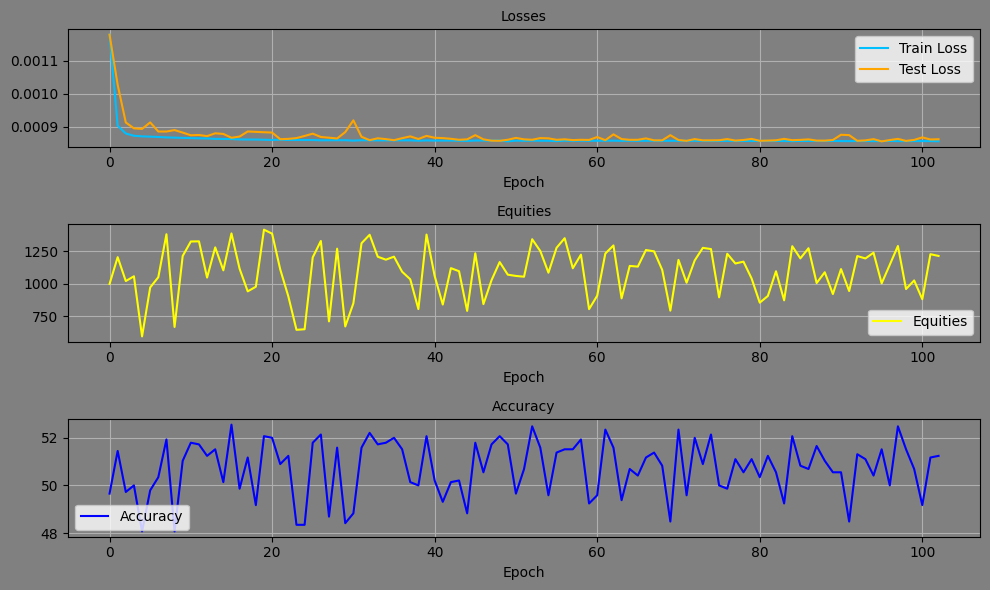

Epoch: 103, Equity: 1125.40, Accuracy: 50.41 train_losses: 0.0019999366649176165, test_losses: 0.0008585929172113538, Duration: 0:00:01.441085


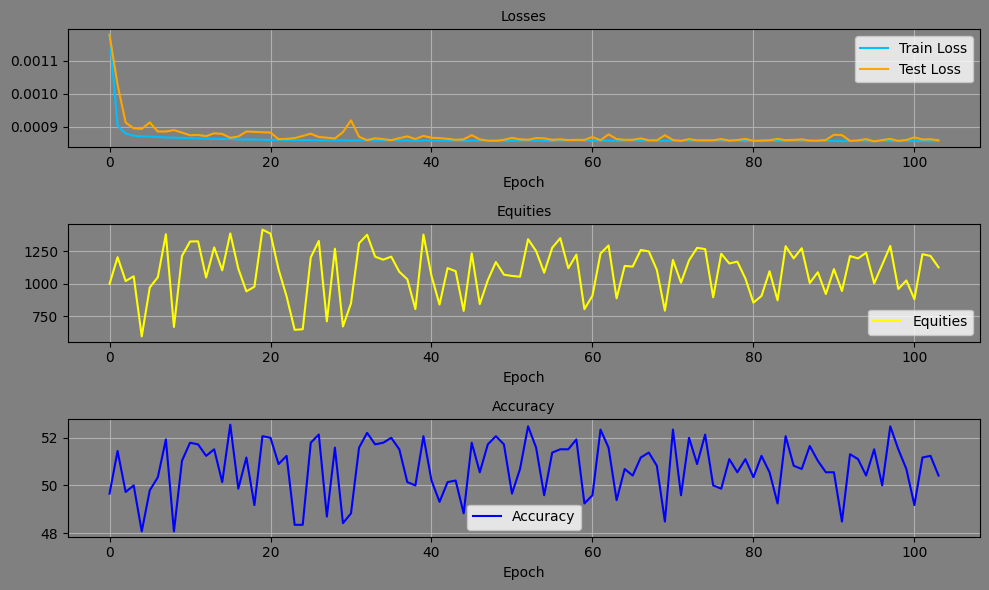

Epoch: 104, Equity: 1176.45, Accuracy: 52.07 train_losses: 0.00199627225983247, test_losses: 0.0008608588832430542, Duration: 0:00:01.444608


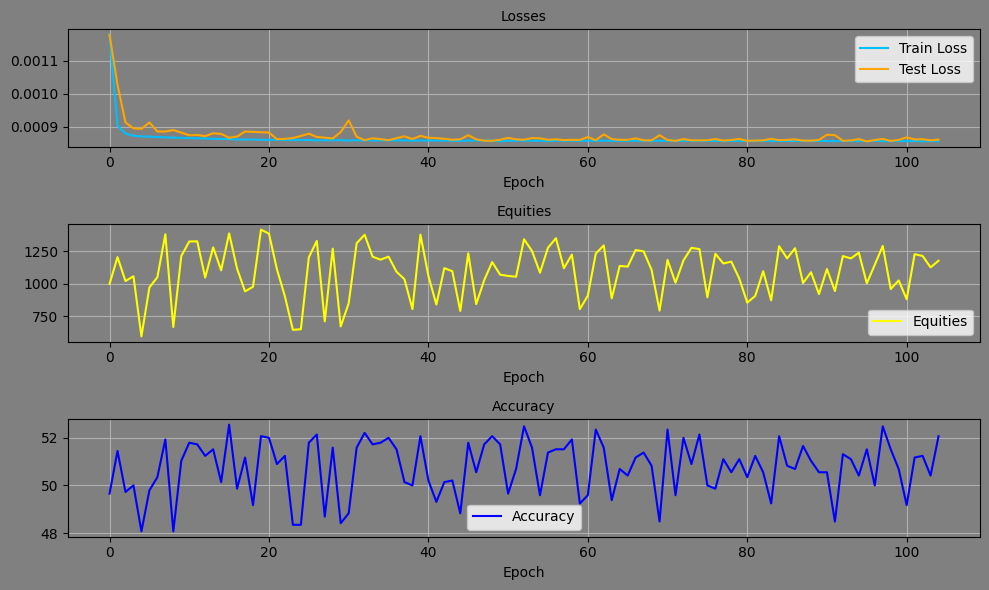

Epoch: 105, Equity: 1263.14, Accuracy: 51.38 train_losses: 0.00199779797702991, test_losses: 0.0008574161329306662, Duration: 0:00:01.503905


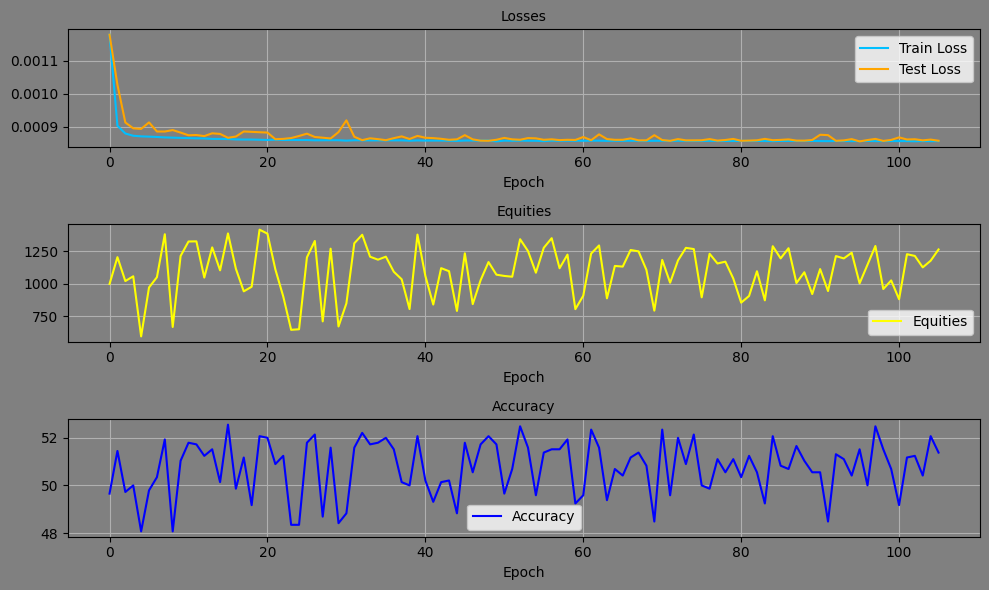

Epoch: 106, Equity: 1221.65, Accuracy: 51.86 train_losses: 0.0019923885186840396, test_losses: 0.0008581136353313923, Duration: 0:00:01.492377


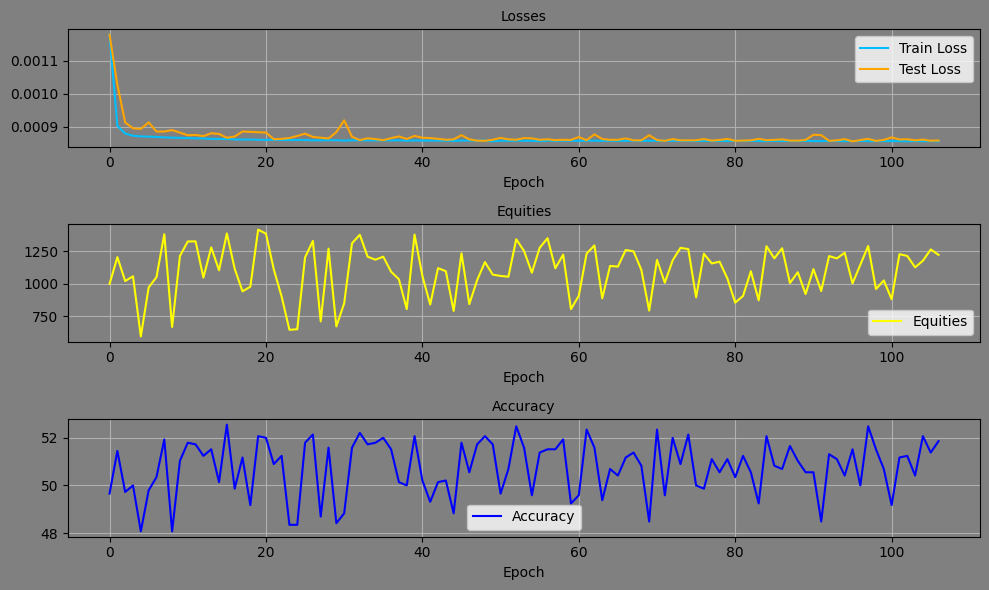

Epoch: 107, Equity: 1022.37, Accuracy: 50.69 train_losses: 0.001985076289769182, test_losses: 0.0008620407897979021, Duration: 0:00:01.530311


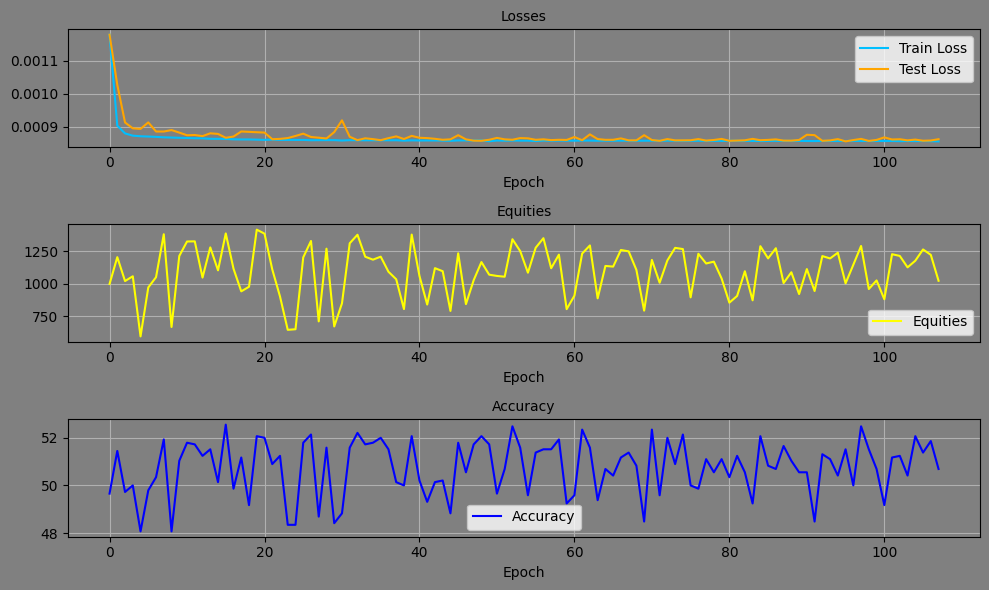

Epoch: 108, Equity: 1004.05, Accuracy: 51.38 train_losses: 0.0019958361711663506, test_losses: 0.0008551867795176804, Duration: 0:00:01.486233


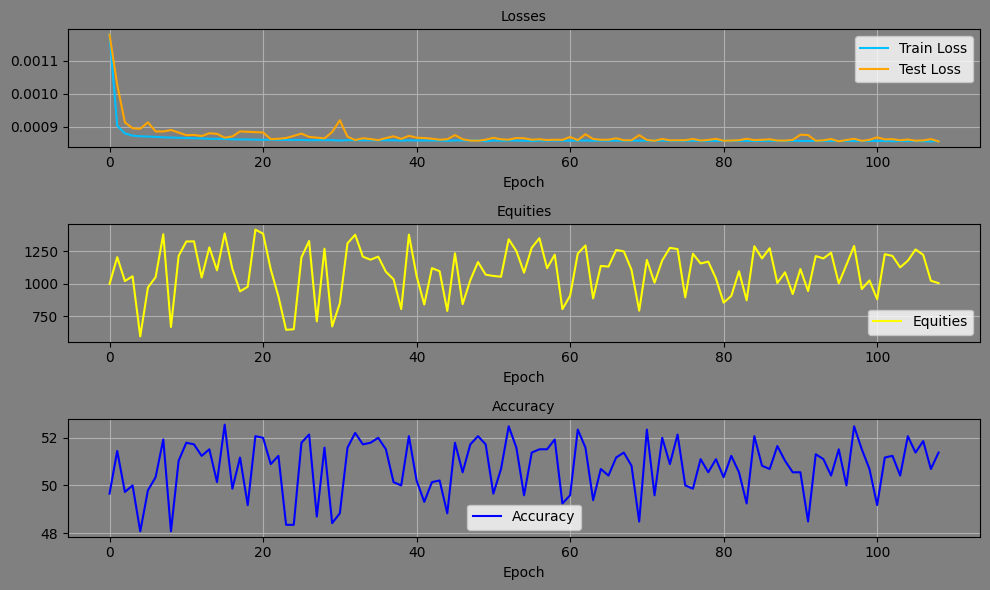

Epoch: 109, Equity: 1388.63, Accuracy: 52.69 train_losses: 0.0019970480763640483, test_losses: 0.0008553676307201385, Duration: 0:00:01.467904


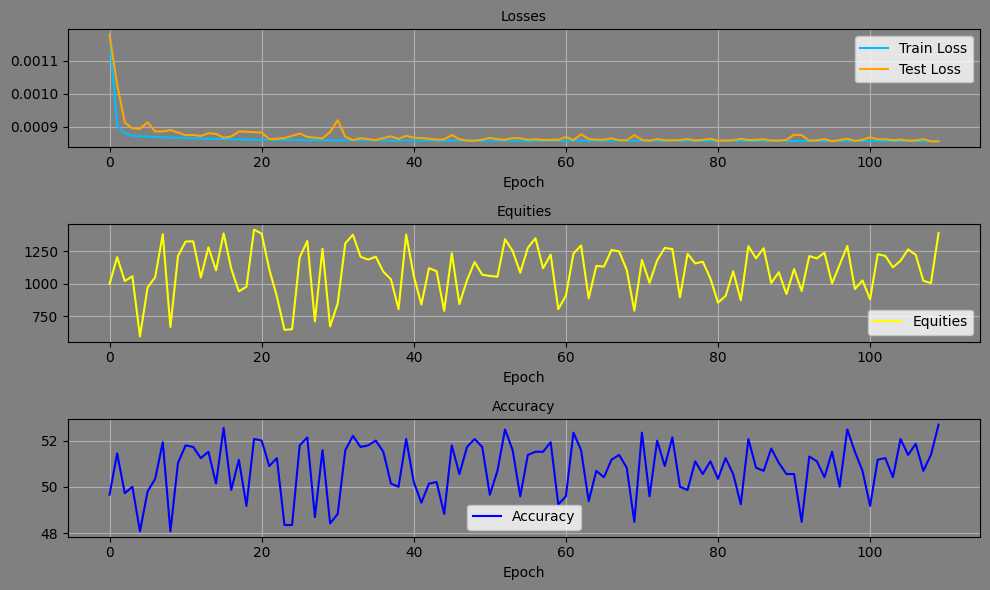

Epoch: 110, Equity: 1090.06, Accuracy: 51.93 train_losses: 0.0019943445988122948, test_losses: 0.0008575423853471875, Duration: 0:00:01.411069


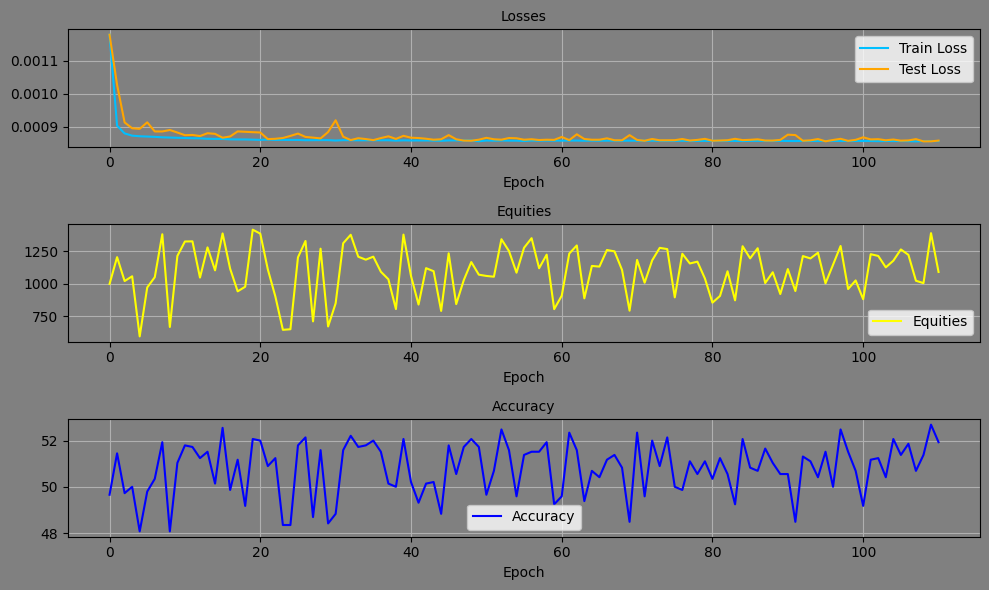

Epoch: 111, Equity: 1258.98, Accuracy: 51.03 train_losses: 0.0019942202647450285, test_losses: 0.0008588157361373305, Duration: 0:00:01.513005


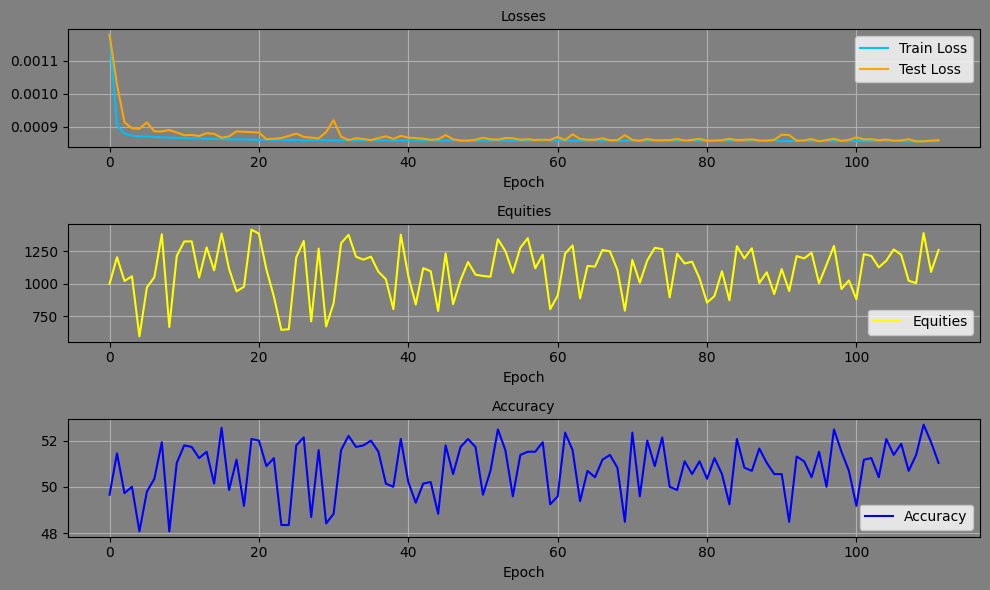

Epoch: 112, Equity: 1420.24, Accuracy: 52.34 train_losses: 0.0019915520748053426, test_losses: 0.0008555002859793603, Duration: 0:00:01.530098


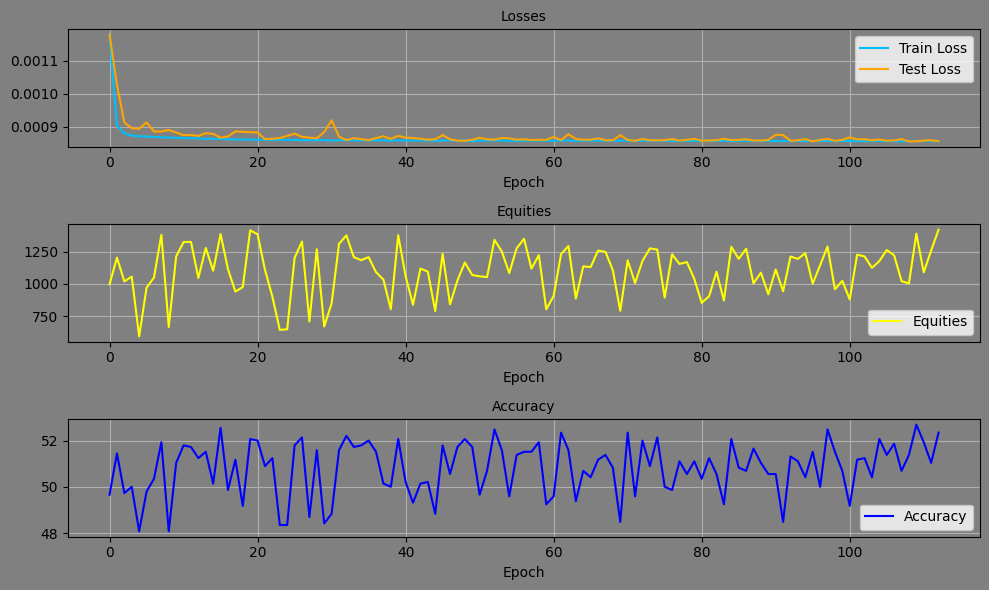

Epoch: 113, Equity: 1227.74, Accuracy: 51.38 train_losses: 0.0019918482363229036, test_losses: 0.0008584054885432124, Duration: 0:00:01.573905


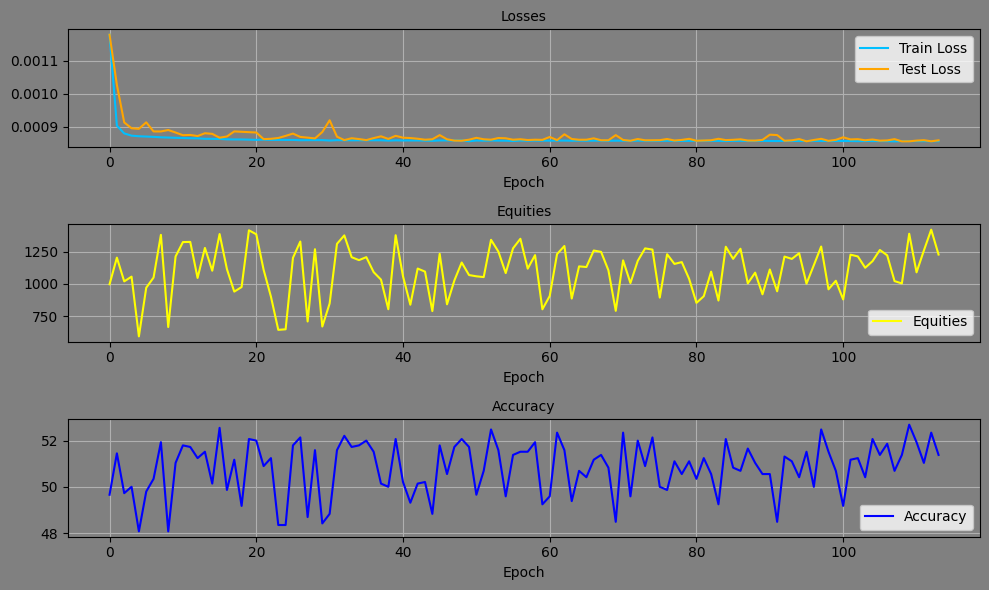

Epoch: 114, Equity: 1112.17, Accuracy: 50.62 train_losses: 0.0019919585260707805, test_losses: 0.0008636096608825028, Duration: 0:00:01.446673


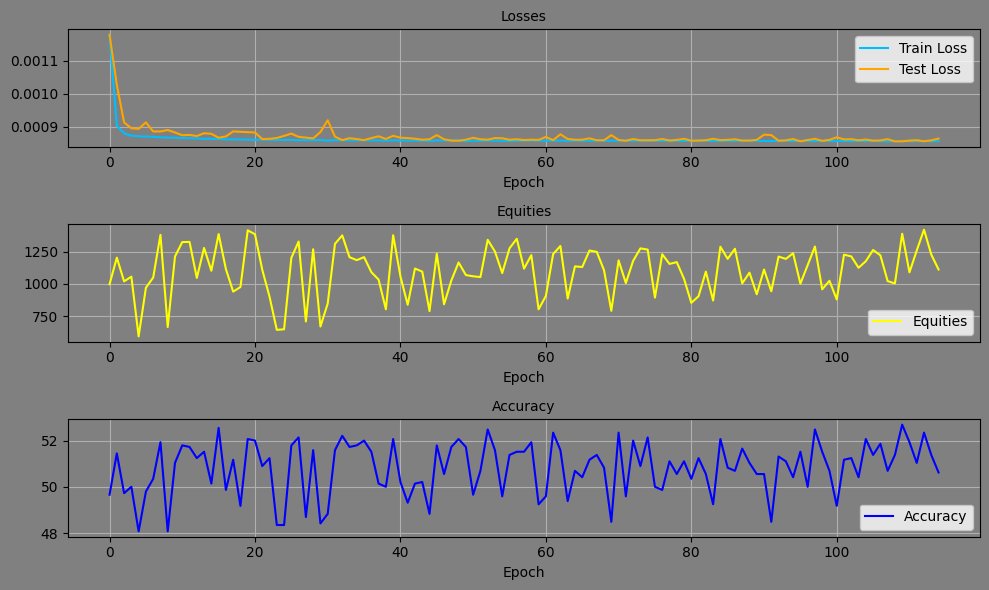

Epoch: 115, Equity: 1129.13, Accuracy: 50.48 train_losses: 0.001990331306187336, test_losses: 0.0008601706358604133, Duration: 0:00:01.580706


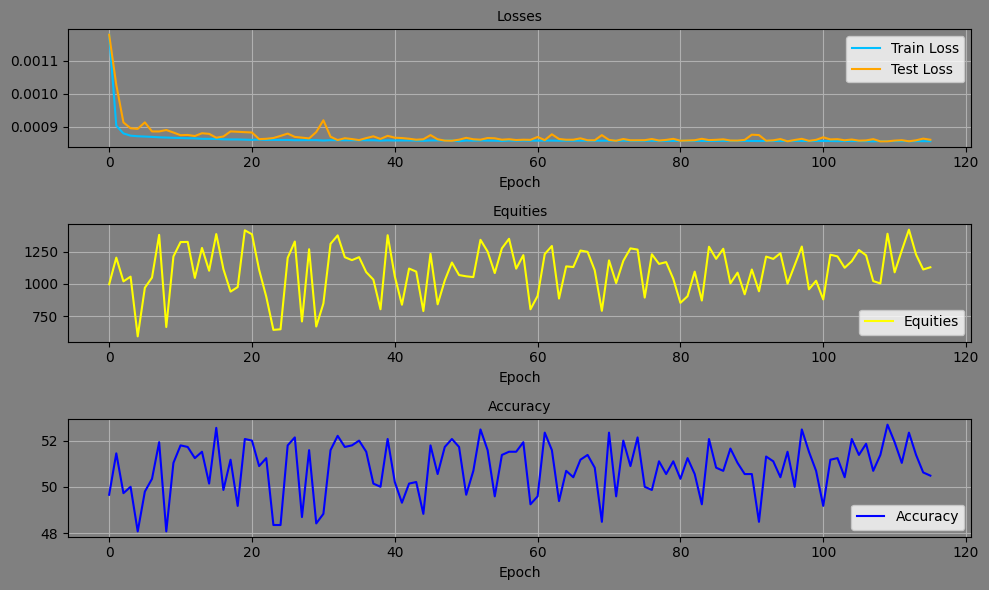

Epoch: 116, Equity: 1081.70, Accuracy: 52.00 train_losses: 0.0019794712145645905, test_losses: 0.0008612496894784272, Duration: 0:00:01.559878


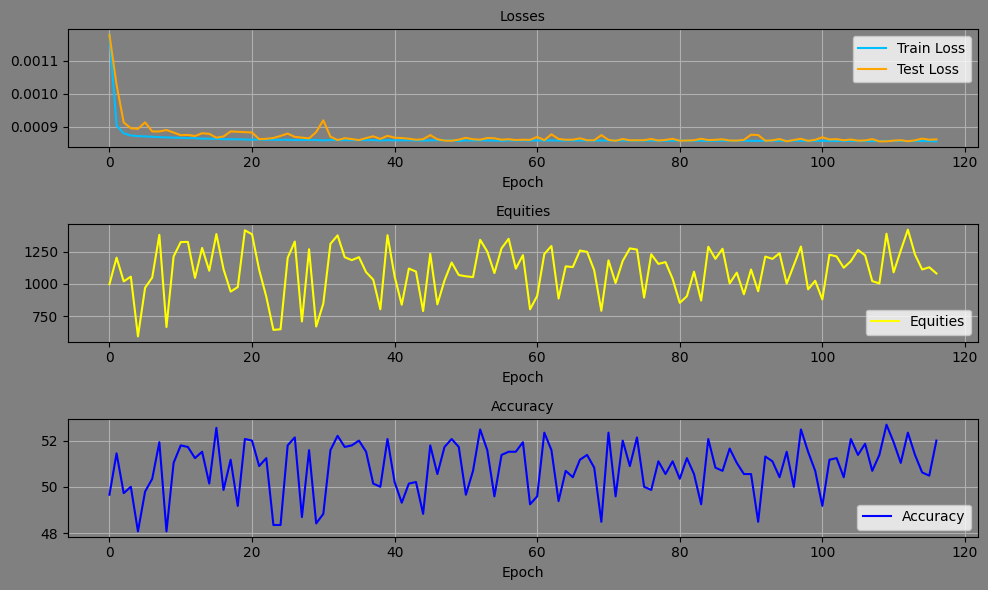

Epoch: 117, Equity: 1148.93, Accuracy: 51.17 train_losses: 0.001993280628071864, test_losses: 0.0008578742272220552, Duration: 0:00:01.619986


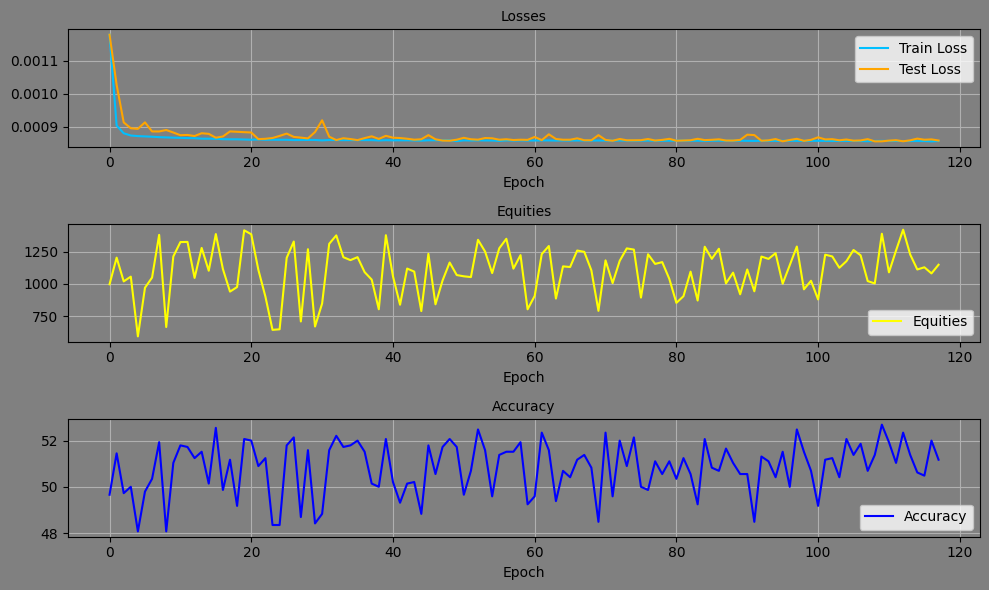

Epoch: 118, Equity: 1156.32, Accuracy: 51.03 train_losses: 0.0019912373213644896, test_losses: 0.000859210267663002, Duration: 0:00:01.545051


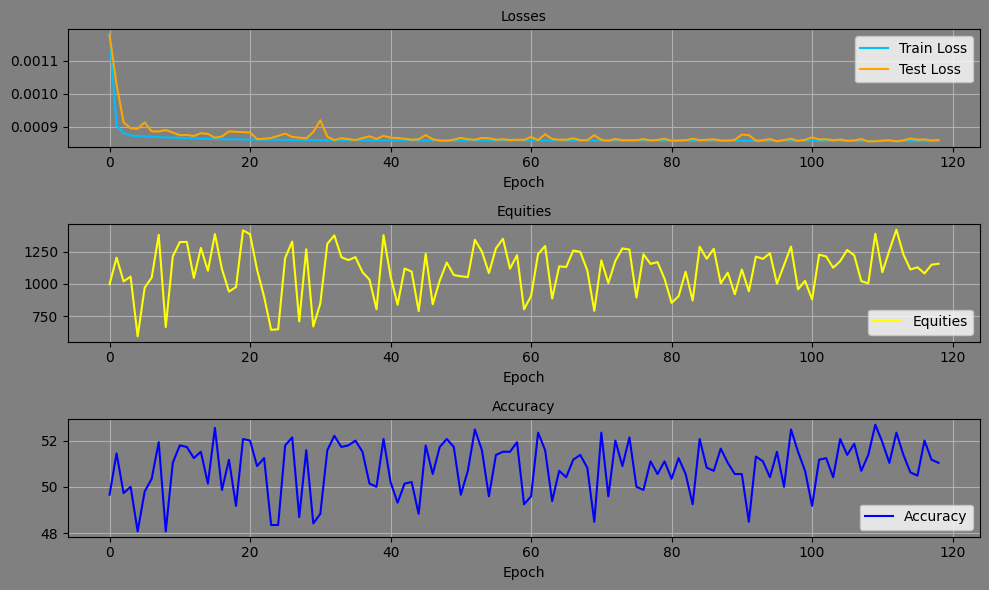

Epoch: 119, Equity: 1225.93, Accuracy: 51.10 train_losses: 0.0019943698880589803, test_losses: 0.0008570576901547611, Duration: 0:00:01.555954


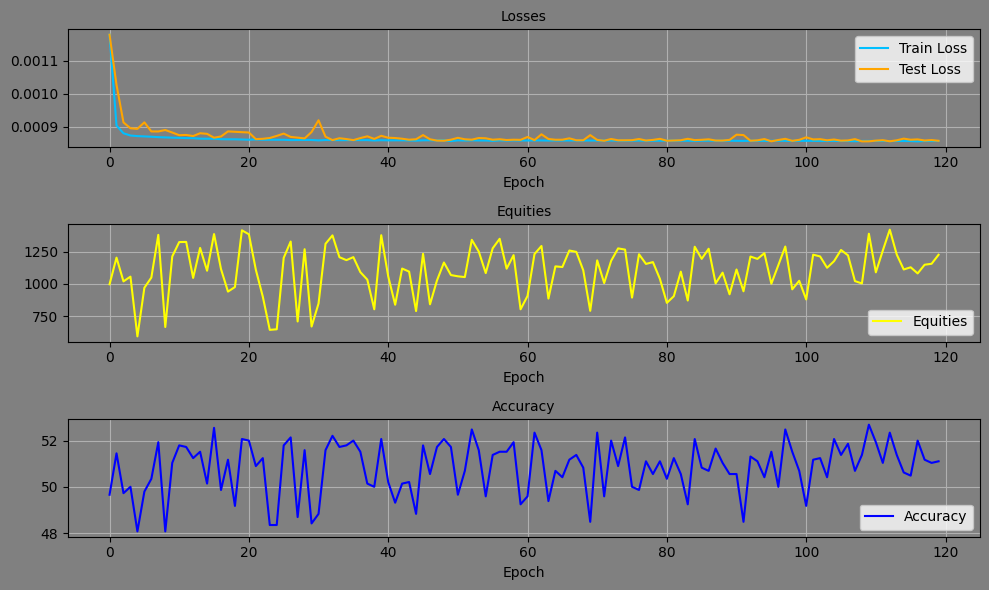

Epoch: 120, Equity: 1309.13, Accuracy: 52.27 train_losses: 0.001988981354949949, test_losses: 0.0008572135120630264, Duration: 0:00:01.370240


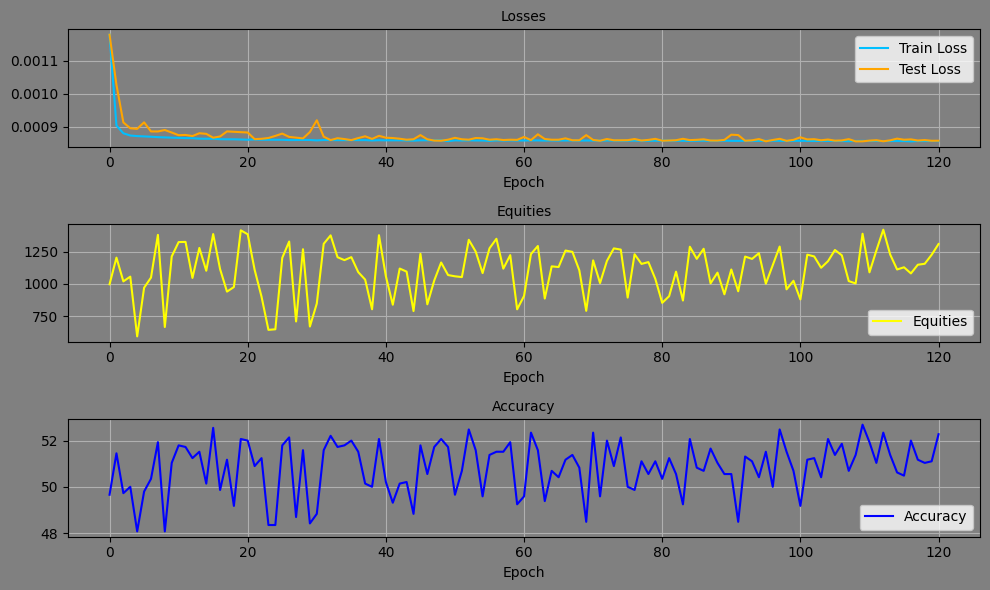

Epoch: 121, Equity: 1065.13, Accuracy: 51.38 train_losses: 0.0019886498331129015, test_losses: 0.0008600078290328383, Duration: 0:00:01.445203


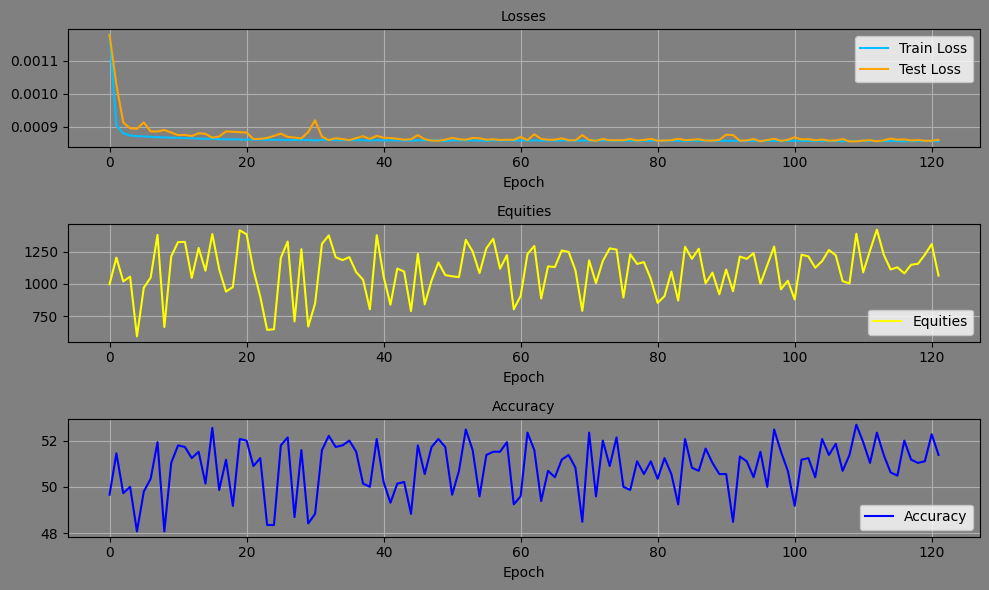

Epoch: 122, Equity: 991.80, Accuracy: 49.79 train_losses: 0.0019833341086079705, test_losses: 0.0008632622775621712, Duration: 0:00:01.520922


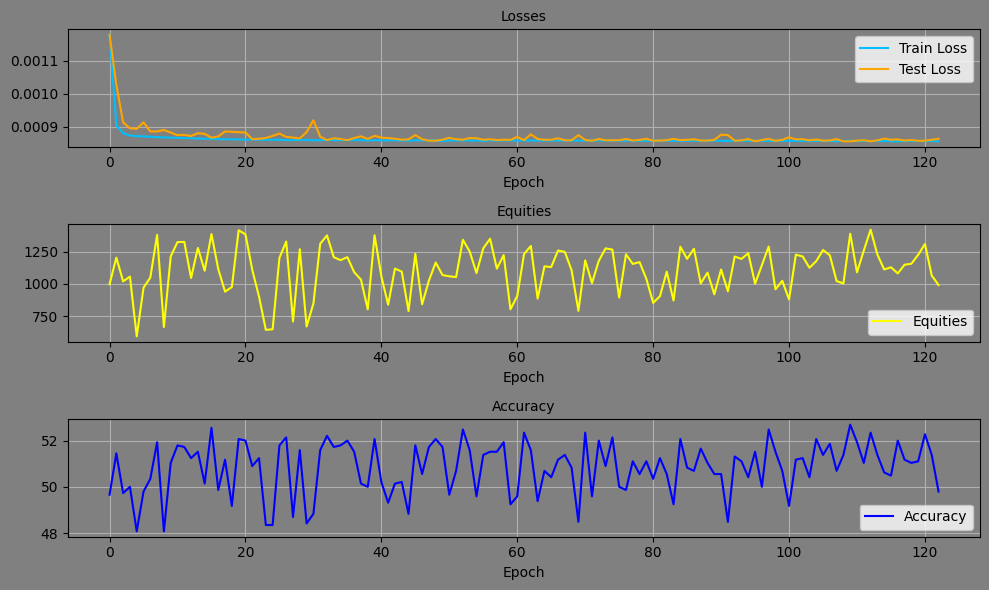

Epoch: 123, Equity: 1195.61, Accuracy: 50.76 train_losses: 0.001983057889264531, test_losses: 0.0008574885432608426, Duration: 0:00:01.527117


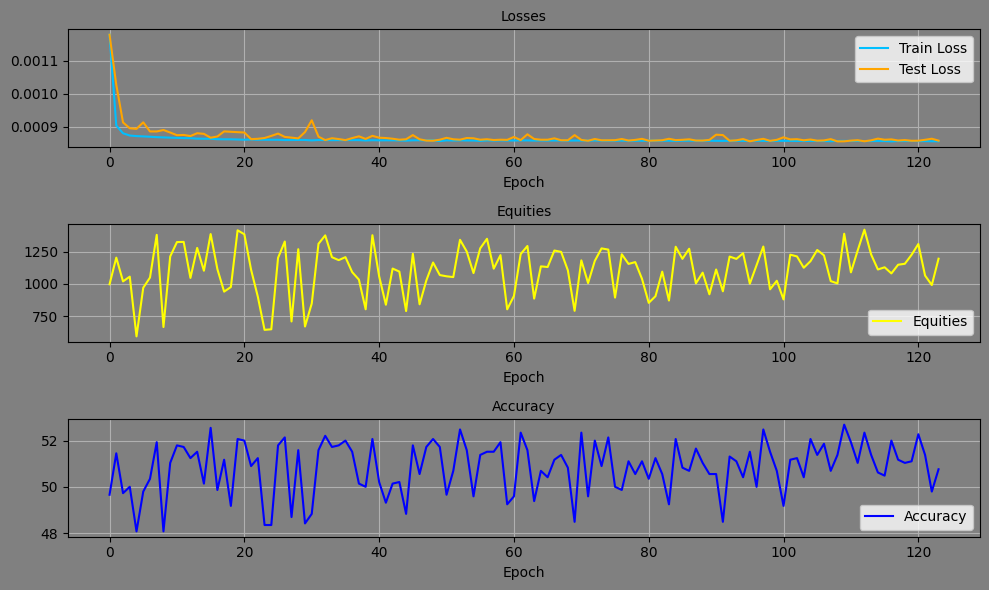

Epoch: 124, Equity: 1292.63, Accuracy: 52.62 train_losses: 0.001986125204440934, test_losses: 0.0008600530563853681, Duration: 0:00:01.417545


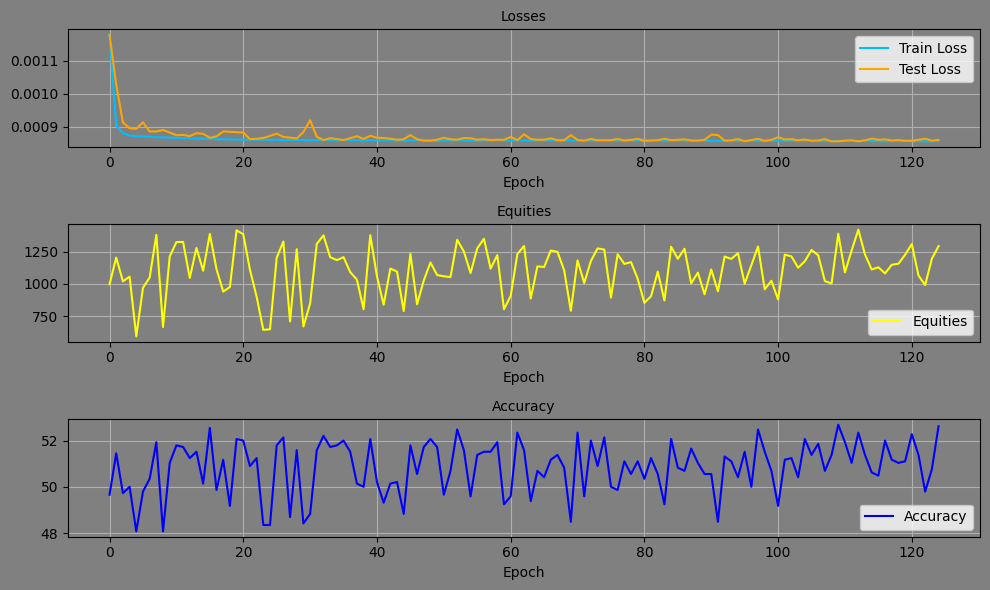

Epoch: 125, Equity: 1131.04, Accuracy: 49.79 train_losses: 0.0019780564204102055, test_losses: 0.0008810079889371991, Duration: 0:00:01.434463


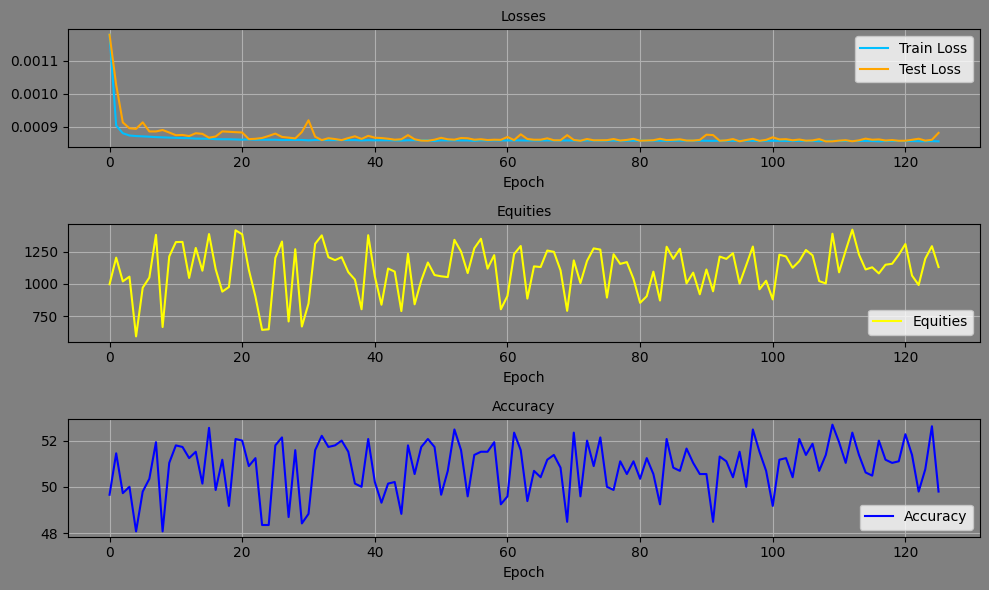

Epoch: 126, Equity: 1167.86, Accuracy: 50.48 train_losses: 0.0019861421022918007, test_losses: 0.0008583878516219556, Duration: 0:00:01.359992


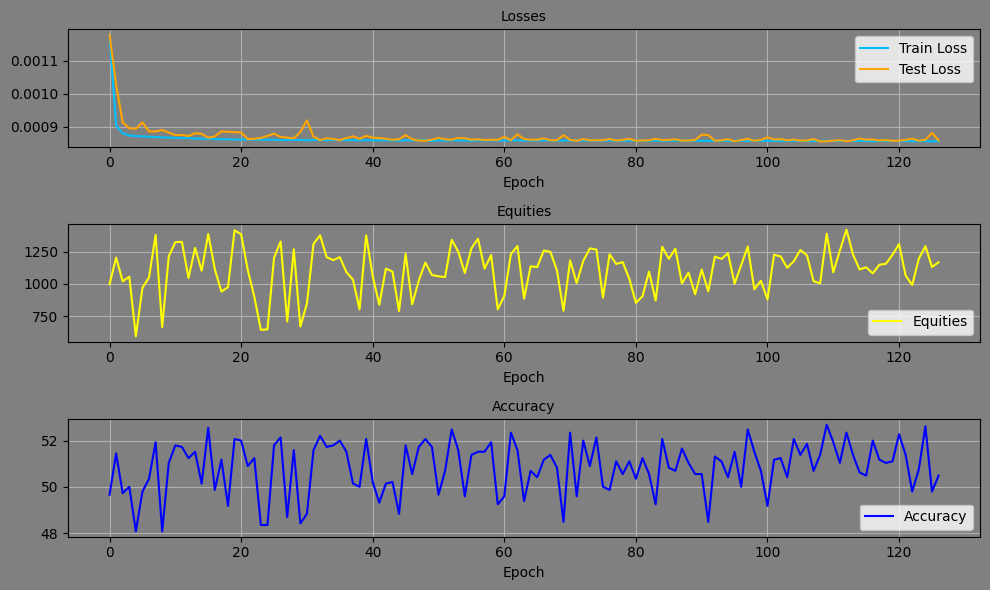

Epoch: 127, Equity: 998.05, Accuracy: 50.90 train_losses: 0.0019877727141797436, test_losses: 0.0008559392881579697, Duration: 0:00:01.346491


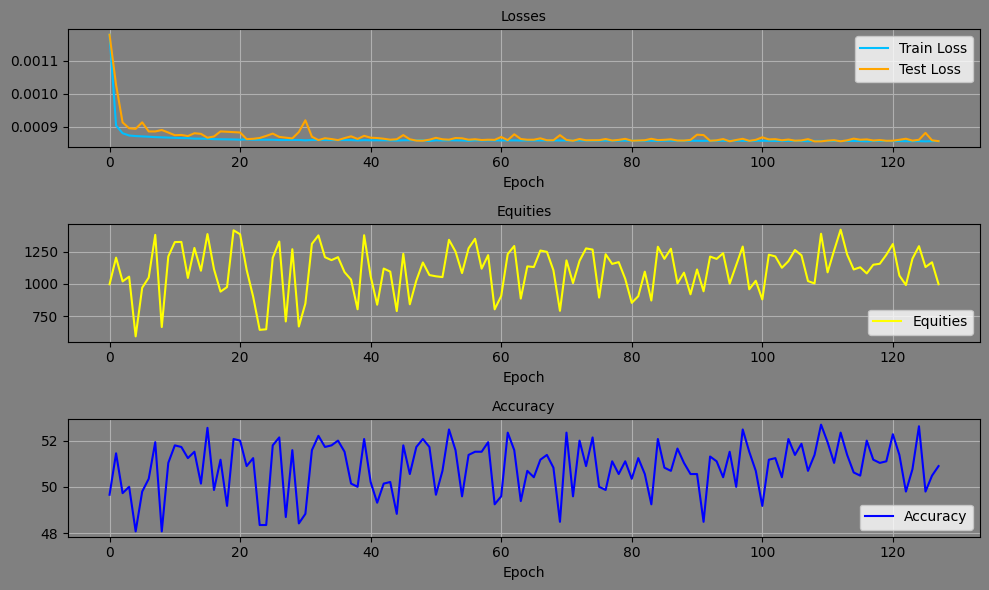

Epoch: 128, Equity: 1171.79, Accuracy: 50.69 train_losses: 0.0019857957325984245, test_losses: 0.0008588284254074097, Duration: 0:00:01.425791


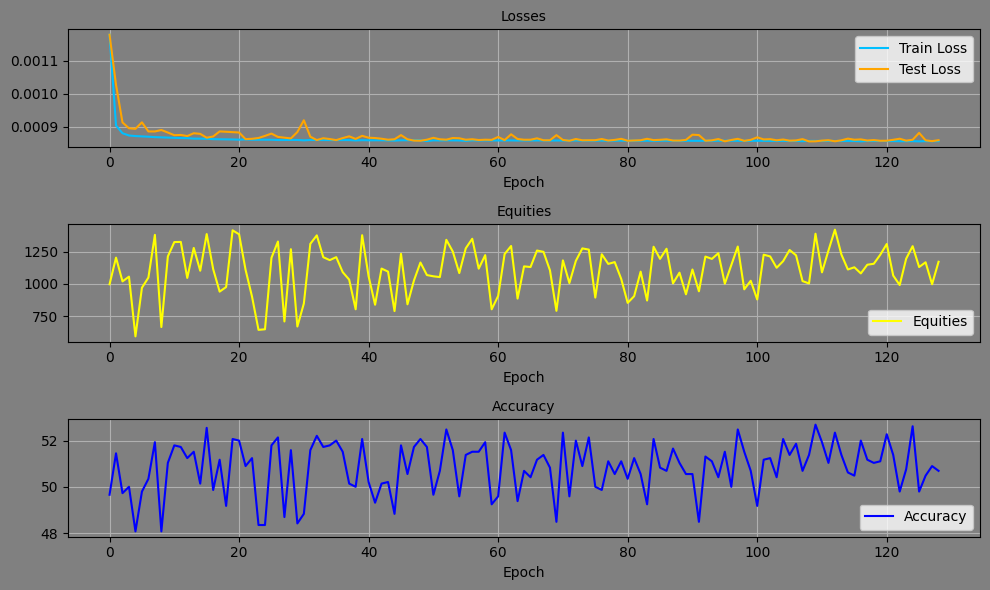

In [ ]:
for epoch in range(epoch, num_epochs):

    # Track duration
    dt0_epoch = datetime.now()

    # Create mini batches
    mini_batches, seed = create_minibatches(X_train, Y_train, batch_size, seed, shuffle=True)

    train_losses_batch = []

    for X_train_batch, Y_train_batch in mini_batches:
        # Set train mode
        model.train()

        # Reset the gradients
        optimizer.zero_grad()

        # Forward propagation
        Y_hat_train = model(X_train_batch) # Shape: (batch_size, num_features)

        # Calculate loss (train)
        train_loss = criterion(Y_hat_train, Y_train_batch)

        # Backprop
        train_loss.backward()

        # Update optimizer
        optimizer.step()

        # Keep track of training losses
        train_losses_batch.append(train_loss.item())

    # Predict on val slice (selection period)
    with torch.no_grad():

        # Set evaluation mode
        model.eval()

        # # Forward propagation
        # Y_pred_val = model(X_val)

        # Forward propagation
        while True:
            try:
                # split the test set into chunks
                chunks = 16
                m = m_val // chunks
                
                for j in range(chunks+1):
                    Y_pred_val[m*j:m*j+m] = model(X_val[m*j:m*j+m])
                
                break

            except Exception as err:
                print(f"Chunks ({chunks}) err: {err}")
                chunks += 2

        # Calculate test loss
        test_loss = criterion(Y_pred_val, Y_val)

    # Convert 'Y_pred_val' to numpy
    Y_pred_val_cpu = Y_pred_val.detach().cpu().numpy()

    train_losses.append(np.mean(train_losses_batch))
    test_losses.append(test_loss.item())

    # ===================== Backtest =====================
    equities = []    # Store equity (account value) over time
    pos_size = 1000  # Fixed position size ($1000 per trade)
    equity = 1000    # Starting capital
    correct_pred = 0 # Initialize correct prediction

    actions = Y_pred_val_cpu[:, 0] > 0 # Get model's buy/sell predictions

    for i in range(len(X_val)-1):
        curr_open = val_opens[i]   # the price we enter at.
        curr_close = val_closes[i] # the price we exit at.
        curr_action = actions[i]        # the model’s signal (buy or sell).

        # Calculate percentage price change
        pct_change = (curr_close - curr_open) / curr_open

        # Profit or loss in dollars
        pnl = np.abs(pos_size * pct_change)

        # Update equity depending on action and price move
        if curr_action == 1:     # Long position (Buy side)
            if pct_change > 0:
                equity += pnl    # Price up → profit
                correct_pred += 1
            elif pct_change < 0:
                equity -= pnl    # Price down → loss

        elif curr_action == 0:   # Short position
            if pct_change > 0:
                equity -= pnl    # Price up → loss
            elif pct_change < 0:
                equity += pnl    # Price down → profit
                correct_pred += 1

        equities.append(equity) # Save current equity
    # ========================================================

    # Calculate percentage accuracy
    accuracy = correct_pred / len(X_val) * 100

    # Save final equity for each epoch
    equity_epochs.append(equity)
    accuracy_epochs.append(accuracy)

    print(f'Epoch: {epoch}, Equity: {equity:.2f}, Accuracy: {accuracy:.2f} train_losses: {train_losses[-1]}, test_losses: {test_losses[-1]}, Duration: {datetime.now() - dt0_epoch}')

    # Save training process
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'test_losses': test_losses,
        'equity_epochs': equity_epochs,
        'accuracy_epochs': accuracy_epochs,
        'seed': seed,
    }, 'training_process')

    if equity > 1200:
        torch.save(model.state_dict(), f"models/eq_{equity:.0f}_ep_{epoch}.pt")

    # Plot training process
    fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(10, 6))
    scaler_testloss = MinMaxScaler(feature_range=(np.min(test_losses)-0.0000000001, np.max(test_losses)))

    # Plot Train Loss and Test Loss
    axs[0].set_title(f"Losses", fontsize=10)
    axs[0].plot(scaler_testloss.fit_transform(np.array(train_losses).reshape(-1,1)), label='Train Loss', color='deepskyblue')
    axs[0].plot(test_losses, label='Test Loss', color='orange')
    axs[0].set_xlabel("Epoch")
    axs[0].legend()
    axs[0].grid()
    # Plot Equities
    axs[1].set_title(f"Equities", fontsize=10)
    axs[1].plot(equity_epochs, label='Equities', color='yellow')
    axs[1].set_xlabel("Epoch")
    axs[1].legend()
    axs[1].grid()
    # Plot Accuracy
    axs[2].set_title(f"Accuracy", fontsize=10)
    axs[2].plot(accuracy_epochs, label='Accuracy', color='blue')
    axs[2].set_xlabel("Epoch")
    axs[2].legend()
    axs[2].grid()
    # Set background color and paper color
    fig.patch.set_facecolor(mcolors.to_hex('grey'))  # Set paper color
    for ax in axs.flat:
        ax.set_facecolor(mcolors.to_hex('grey'))  # Set bg color
    # Display
    plt.tight_layout()
    plt.savefig(f'training_process.png')
    plt.show()
    plt.close()


In [ ]:
import json
import re

split_info = {"train_start": TRAIN_START, "train_end": TRAIN_END, "val_end": VAL_END, "total_rows": total_rows}
with open(ARTIFACTS / "split_info.json", "w", encoding="utf-8") as f:
    json.dump(split_info, f, indent=2)

with open(ARTIFACTS / "scalers.pkl", "wb") as f:
    pickle.dump(train_scalers, f)

models_dir = Path("models").resolve()
pt_files = []
for fname in os.listdir(models_dir):
    if not fname.endswith(".pt"):
        continue
    m = re.match(r"^eq_(\d+)_ep_", fname)
    if not m:
        continue
    eq = float(m.group(1))
    rel_path = os.path.relpath(str(models_dir / fname), str(CNN_ROOT)).replace(os.sep, "/")
    pt_files.append((eq, rel_path))

pt_files.sort(key=lambda x: -x[0])
top3 = [p for _, p in pt_files[:3]]

manifest_path = ARTIFACTS / "manifest.json"
manifest = {}
if manifest_path.is_file():
    with open(manifest_path, "r", encoding="utf-8") as f:
        manifest = json.load(f)
manifest[ARCH_MANIFEST_KEY] = top3
with open(manifest_path, "w", encoding="utf-8") as f:
    json.dump(manifest, f, indent=2)

print("Written:", ARTIFACTS / "split_info.json", ARTIFACTS / "scalers.pkl", manifest_path)
print("manifest key:", ARCH_MANIFEST_KEY, "top3:", top3)

